In [1]:
import pandas as pd
import collections
import math
import os

import cv2
import matplotlib.pyplot as plt
import cv2
import sys
import numpy as np
import math
import time
from PIL import Image 

from pandas import read_csv  
import configparser

%config Completer.use_jedi = False

import configparser
config = configparser.ConfigParser()
config.read('XXX-config.txt')

source_folder = config.get('Configuration', 'source_folder')
time_step = int(config.get('Configuration', 'time_step'))
window_size = int(config.get('Configuration', 'window_size'))
data_folder = config.get('Configuration', 'data_folder')
ini_date = config.get('Configuration', 'ini_date')
end_date = config.get('Configuration', 'end_date')

users=config.get('Configuration', 'users')
users = [(item.strip()) for item in users.split(',')]

w = int(config.get('Configuration', 'w'))
h = int(config.get('Configuration', 'h'))

anchors=config.get('Configuration', 'anchors')
anchors = [(item.strip()) for item in anchors.split(',')]

rooms=config.get('Configuration', 'rooms')
rooms = [(item.strip()) for item in rooms.split(',')]

user_color={}
for user in users:
    user_color[user]=config.get('Colors', user)
print(user_color)

{'f02e': 'blue', '867f': 'red', 'ed9c': 'green'}


In [2]:
import numpy as np
from pandas import read_csv    
import pandas as pd
import time

from datetime import datetime

off_zone=60*60*2

def day_time(ti):
    return int((int)((ti+off_zone)/(60*60*24)))


def time2str(tt):
    return datetime.fromtimestamp(tt).strftime("%Y-%m-%d %H:%M:%S")


t0 = (int)(datetime.strptime(ini_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (ini_date,"Init date is", t0, "day:",day_time(t0), time2str(t0))

tN = (int)(datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S').timestamp())
print (end_date,"End date is", tN, "day:",day_time(tN), time2str(tN))


def day_time0(ti):
    return day_time(ti)-day_time(t0)+1

def relT(ti):
    return (int)((ti-t0)/time_step)

i0=0
ts=list(range(t0,tN,1))

day=list(range(day_time(t0),day_time(tN)+1))[0]
day=19798
print(day)


1980-01-01 13:00:02 Init date is 315576002 day: 3652 1980-01-01 13:00:02
1980-01-01 14:51:20 End date is 315582680 day: 3652 1980-01-01 14:51:20
19798


In [3]:
series=read_csv(os.path.join(source_folder,"scene-time.txt"), sep="\t",parse_dates=True, header=None, names=["tt0","time", "scene"]) 
S={} 
for index, row in series.iterrows():
    S[row["time"]]=row["scene"]
print(S)

{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 7

In [4]:
def getFPImg(tt):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP."+str(tt)+".png"))/255.0

def getGTImg(tt,user):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/GT."+user+"."+str(tt)+".png"))/255.0  

def getSceneImg(scene):
    return np.array(Image.open(data_folder+"/DAY_"+str(day)+"/FP.mean."+str(scene)+".png"))/255.0

In [5]:


XY0={}
rssi0={}
Y0={}

T0=[]
T1=[]


rssi_min=-90
rssi_max=-25


anchors_data={}
user_room={}
for user in users:
    XY0[user]=[]
    rssi0[user]=[]
    Y0[user]=[]

    print(data_folder+"/DAY_"+str(day)+"/GT.ROOM."+user+".tsv")
    print(user)
    series=read_csv(data_folder+"/DAY_"+str(day)+"/GT.ROOM."+user+".tsv", sep="\t",parse_dates=True, header=None, names=["id","time","room"])
    user_room[user]=series
        
    anchors_data[user]={}
    for anchor in anchors:
        print(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv")
        print(user,anchor)
        series=read_csv(data_folder+"/DAY_"+str(day)+"/"+user+"."+anchor+".tsv", sep="\t",parse_dates=True, header=None, names=["time","d"])
        series=series.values
        anchors_data[user][anchor]=series


for it,tt in enumerate(ts):
    #img00=np.zeros((w,h))
    #scene=getScene(tt)
    #if(scene):
    #    img00=getSceneImg(scene)
    #print("img00",img00)
    #imgX=imgX-img00
    #imgX[imgX<0]=0
    imgX=getFPImg(tt)
    for user in users:

        dist=[]
        
        yroom=user_room[user]["room"].iloc[it]
        if (yroom == "IDLE"):
            continue
        for ixa,anchor in enumerate(anchors):
            print(tt,time2str(tt),anchor,user)
            d=anchors_data[user][anchor][it][1]
            print(anchors_data[user][anchor][it][0], "vs",tt)

            #if(d!=-1):
            #    d=(d - rssi_min) / (rssi_max - rssi_min)

            #print(anchors_data[user][anchor][it][1],d)
            if(d>=0):
                if(d<10):
                    d=(1-d/10.0)
                else:
                    d=0
            else:
                    d=0

            print("\t anchor:",anchor, anchors_data[user][anchor][it], "tt:",tt)
            dist.append(d)

        dist=np.array(dist)
        print("dist:",dist,"Y:",yroom)

        rssi0[user].append(dist.reshape(len(anchors),1))
        XY0[user].append(imgX[:, :, np.newaxis])
        Y0[user].append(yroom)
        T0.append(it)
        T1.append(tt)
        
        


./all-data-aligned//DAY_19798/GT.ROOM.f02e.tsv
f02e
./all-data-aligned//DAY_19798/f02e.8171.tsv
f02e 8171
./all-data-aligned//DAY_19798/f02e.eb38.tsv
f02e eb38
./all-data-aligned//DAY_19798/f02e.1fa0.tsv
f02e 1fa0
./all-data-aligned//DAY_19798/f02e.a304.tsv
f02e a304
./all-data-aligned//DAY_19798/f02e.c492.tsv
f02e c492
./all-data-aligned//DAY_19798/GT.ROOM.867f.tsv
867f
./all-data-aligned//DAY_19798/867f.8171.tsv
867f 8171
./all-data-aligned//DAY_19798/867f.eb38.tsv
867f eb38
./all-data-aligned//DAY_19798/867f.1fa0.tsv
867f 1fa0
./all-data-aligned//DAY_19798/867f.a304.tsv
867f a304
./all-data-aligned//DAY_19798/867f.c492.tsv
867f c492
./all-data-aligned//DAY_19798/GT.ROOM.ed9c.tsv
ed9c
./all-data-aligned//DAY_19798/ed9c.8171.tsv
ed9c 8171
./all-data-aligned//DAY_19798/ed9c.eb38.tsv
ed9c eb38
./all-data-aligned//DAY_19798/ed9c.1fa0.tsv
ed9c 1fa0
./all-data-aligned//DAY_19798/ed9c.a304.tsv
ed9c a304
./all-data-aligned//DAY_19798/ed9c.c492.tsv
ed9c c492
315576002 1980-01-01 13:00:02 8171

315576023 1980-01-01 13:00:23 8171 ed9c
5.152 vs 315576023
	 anchor: 8171 [5.152 5.152] tt: 315576023
315576023 1980-01-01 13:00:23 eb38 ed9c
4.608 vs 315576023
	 anchor: eb38 [4.608 4.608] tt: 315576023
315576023 1980-01-01 13:00:23 1fa0 ed9c
10.0 vs 315576023
	 anchor: 1fa0 [ 10. -10.] tt: 315576023
315576023 1980-01-01 13:00:23 a304 ed9c
6.871 vs 315576023
	 anchor: a304 [6.871 6.871] tt: 315576023
315576023 1980-01-01 13:00:23 c492 ed9c
10.0 vs 315576023
	 anchor: c492 [ 10. -10.] tt: 315576023
dist: [0.4848 0.5392 0.     0.3129 0.    ] Y: livingroom
315576024 1980-01-01 13:00:24 8171 ed9c
5.152 vs 315576024
	 anchor: 8171 [5.152 5.152] tt: 315576024
315576024 1980-01-01 13:00:24 eb38 ed9c
4.608 vs 315576024
	 anchor: eb38 [4.608 4.608] tt: 315576024
315576024 1980-01-01 13:00:24 1fa0 ed9c
10.0 vs 315576024
	 anchor: 1fa0 [ 10. -10.] tt: 315576024
315576024 1980-01-01 13:00:24 a304 ed9c
6.871 vs 315576024
	 anchor: a304 [6.871 6.871] tt: 315576024
315576024 1980-01-01 13:00:24 c492

315576123 1980-01-01 13:02:03 8171 ed9c
5.175 vs 315576123
	 anchor: 8171 [5.175 5.175] tt: 315576123
315576123 1980-01-01 13:02:03 eb38 ed9c
3.933 vs 315576123
	 anchor: eb38 [3.933 3.933] tt: 315576123
315576123 1980-01-01 13:02:03 1fa0 ed9c
10.0 vs 315576123
	 anchor: 1fa0 [ 10. -10.] tt: 315576123
315576123 1980-01-01 13:02:03 a304 ed9c
7.7 vs 315576123
	 anchor: a304 [7.7 7.7] tt: 315576123
315576123 1980-01-01 13:02:03 c492 ed9c
10.0 vs 315576123
	 anchor: c492 [ 10. -10.] tt: 315576123
dist: [0.4825 0.6067 0.     0.23   0.    ] Y: livingroom
315576124 1980-01-01 13:02:04 8171 ed9c
5.006 vs 315576124
	 anchor: 8171 [5.006 5.175] tt: 315576124
315576124 1980-01-01 13:02:04 eb38 ed9c
3.001 vs 315576124
	 anchor: eb38 [3.001 3.933] tt: 315576124
315576124 1980-01-01 13:02:04 1fa0 ed9c
10.0 vs 315576124
	 anchor: 1fa0 [ 10. -10.] tt: 315576124
315576124 1980-01-01 13:02:04 a304 ed9c
7.7 vs 315576124
	 anchor: a304 [7.7 7.7] tt: 315576124
315576124 1980-01-01 13:02:04 c492 ed9c
10.0 v

315576155 1980-01-01 13:02:35 8171 ed9c
5.545 vs 315576155
	 anchor: 8171 [5.545 5.7  ] tt: 315576155
315576155 1980-01-01 13:02:35 eb38 ed9c
2.346 vs 315576155
	 anchor: eb38 [2.346 3.043] tt: 315576155
315576155 1980-01-01 13:02:35 1fa0 ed9c
10.0 vs 315576155
	 anchor: 1fa0 [ 10. -10.] tt: 315576155
315576155 1980-01-01 13:02:35 a304 ed9c
10.0 vs 315576155
	 anchor: a304 [ 10. -10.] tt: 315576155
315576155 1980-01-01 13:02:35 c492 ed9c
10.0 vs 315576155
	 anchor: c492 [ 10. -10.] tt: 315576155
dist: [0.43   0.6957 0.     0.     0.    ] Y: livingroom
315576156 1980-01-01 13:02:36 8171 ed9c
5.545 vs 315576156
	 anchor: 8171 [5.545 5.756] tt: 315576156
315576156 1980-01-01 13:02:36 eb38 ed9c
2.346 vs 315576156
	 anchor: eb38 [2.346 2.646] tt: 315576156
315576156 1980-01-01 13:02:36 1fa0 ed9c
10.0 vs 315576156
	 anchor: 1fa0 [ 10. -10.] tt: 315576156
315576156 1980-01-01 13:02:36 a304 ed9c
10.0 vs 315576156
	 anchor: a304 [ 10. -10.] tt: 315576156
315576156 1980-01-01 13:02:36 c492 ed9c


315576292 1980-01-01 13:04:52 8171 ed9c
5.344 vs 315576292
	 anchor: 8171 [5.344 5.353] tt: 315576292
315576292 1980-01-01 13:04:52 eb38 ed9c
3.442 vs 315576292
	 anchor: eb38 [3.442 3.554] tt: 315576292
315576292 1980-01-01 13:04:52 1fa0 ed9c
10.0 vs 315576292
	 anchor: 1fa0 [ 10. -10.] tt: 315576292
315576292 1980-01-01 13:04:52 a304 ed9c
10.0 vs 315576292
	 anchor: a304 [ 10. -10.] tt: 315576292
315576292 1980-01-01 13:04:52 c492 ed9c
10.0 vs 315576292
	 anchor: c492 [ 10. -10.] tt: 315576292
dist: [0.4647 0.6446 0.     0.     0.    ] Y: livingroom
315576293 1980-01-01 13:04:53 8171 ed9c
5.353 vs 315576293
	 anchor: 8171 [5.353 5.423] tt: 315576293
315576293 1980-01-01 13:04:53 eb38 ed9c
3.381 vs 315576293
	 anchor: eb38 [3.381 3.512] tt: 315576293
315576293 1980-01-01 13:04:53 1fa0 ed9c
10.0 vs 315576293
	 anchor: 1fa0 [ 10. -10.] tt: 315576293
315576293 1980-01-01 13:04:53 a304 ed9c
10.0 vs 315576293
	 anchor: a304 [ 10. -10.] tt: 315576293
315576293 1980-01-01 13:04:53 c492 ed9c


315576347 1980-01-01 13:05:47 8171 ed9c
10.0 vs 315576347
	 anchor: 8171 [ 10. -10.] tt: 315576347
315576347 1980-01-01 13:05:47 eb38 ed9c
10.0 vs 315576347
	 anchor: eb38 [ 10. -10.] tt: 315576347
315576347 1980-01-01 13:05:47 1fa0 ed9c
10.0 vs 315576347
	 anchor: 1fa0 [ 10. -10.] tt: 315576347
315576347 1980-01-01 13:05:47 a304 ed9c
10.0 vs 315576347
	 anchor: a304 [ 10. -10.] tt: 315576347
315576347 1980-01-01 13:05:47 c492 ed9c
10.0 vs 315576347
	 anchor: c492 [ 10. -10.] tt: 315576347
dist: [0 0 0 0 0] Y: livingroom
315576348 1980-01-01 13:05:48 8171 ed9c
6.121 vs 315576348
	 anchor: 8171 [6.121 6.121] tt: 315576348
315576348 1980-01-01 13:05:48 eb38 ed9c
3.962 vs 315576348
	 anchor: eb38 [3.962 3.962] tt: 315576348
315576348 1980-01-01 13:05:48 1fa0 ed9c
10.0 vs 315576348
	 anchor: 1fa0 [ 10. -10.] tt: 315576348
315576348 1980-01-01 13:05:48 a304 ed9c
10.0 vs 315576348
	 anchor: a304 [ 10. -10.] tt: 315576348
315576348 1980-01-01 13:05:48 c492 ed9c
10.0 vs 315576348
	 anchor: c49

315576470 1980-01-01 13:07:50 8171 ed9c
10.0 vs 315576470
	 anchor: 8171 [ 10. -10.] tt: 315576470
315576470 1980-01-01 13:07:50 eb38 ed9c
10.0 vs 315576470
	 anchor: eb38 [ 10. -10.] tt: 315576470
315576470 1980-01-01 13:07:50 1fa0 ed9c
10.0 vs 315576470
	 anchor: 1fa0 [ 10. -10.] tt: 315576470
315576470 1980-01-01 13:07:50 a304 ed9c
10.0 vs 315576470
	 anchor: a304 [ 10. -10.] tt: 315576470
315576470 1980-01-01 13:07:50 c492 ed9c
10.0 vs 315576470
	 anchor: c492 [ 10. -10.] tt: 315576470
dist: [0 0 0 0 0] Y: livingroom
315576471 1980-01-01 13:07:51 8171 ed9c
10.0 vs 315576471
	 anchor: 8171 [ 10. -10.] tt: 315576471
315576471 1980-01-01 13:07:51 eb38 ed9c
10.0 vs 315576471
	 anchor: eb38 [ 10. -10.] tt: 315576471
315576471 1980-01-01 13:07:51 1fa0 ed9c
10.0 vs 315576471
	 anchor: 1fa0 [ 10. -10.] tt: 315576471
315576471 1980-01-01 13:07:51 a304 ed9c
10.0 vs 315576471
	 anchor: a304 [ 10. -10.] tt: 315576471
315576471 1980-01-01 13:07:51 c492 ed9c
10.0 vs 315576471
	 anchor: c492 [ 10

315576524 1980-01-01 13:08:44 8171 ed9c
5.568 vs 315576524
	 anchor: 8171 [5.568 5.568] tt: 315576524
315576524 1980-01-01 13:08:44 eb38 ed9c
2.267 vs 315576524
	 anchor: eb38 [2.267 2.267] tt: 315576524
315576524 1980-01-01 13:08:44 1fa0 ed9c
10.0 vs 315576524
	 anchor: 1fa0 [ 10. -10.] tt: 315576524
315576524 1980-01-01 13:08:44 a304 ed9c
10.0 vs 315576524
	 anchor: a304 [ 10. -10.] tt: 315576524
315576524 1980-01-01 13:08:44 c492 ed9c
10.0 vs 315576524
	 anchor: c492 [ 10. -10.] tt: 315576524
dist: [0.4432 0.7733 0.     0.     0.    ] Y: livingroom
315576525 1980-01-01 13:08:45 8171 ed9c
10.0 vs 315576525
	 anchor: 8171 [ 10. -10.] tt: 315576525
315576525 1980-01-01 13:08:45 eb38 ed9c
10.0 vs 315576525
	 anchor: eb38 [ 10. -10.] tt: 315576525
315576525 1980-01-01 13:08:45 1fa0 ed9c
10.0 vs 315576525
	 anchor: 1fa0 [ 10. -10.] tt: 315576525
315576525 1980-01-01 13:08:45 a304 ed9c
10.0 vs 315576525
	 anchor: a304 [ 10. -10.] tt: 315576525
315576525 1980-01-01 13:08:45 c492 ed9c
10.0 v

315576632 1980-01-01 13:10:32 8171 ed9c
4.74 vs 315576632
	 anchor: 8171 [4.74  4.898] tt: 315576632
315576632 1980-01-01 13:10:32 eb38 ed9c
3.395 vs 315576632
	 anchor: eb38 [3.395 3.821] tt: 315576632
315576632 1980-01-01 13:10:32 1fa0 ed9c
10.0 vs 315576632
	 anchor: 1fa0 [ 10. -10.] tt: 315576632
315576632 1980-01-01 13:10:32 a304 ed9c
10.0 vs 315576632
	 anchor: a304 [ 10. -10.] tt: 315576632
315576632 1980-01-01 13:10:32 c492 ed9c
10.0 vs 315576632
	 anchor: c492 [ 10. -10.] tt: 315576632
dist: [0.5102 0.6179 0.     0.     0.    ] Y: livingroom
315576633 1980-01-01 13:10:33 8171 ed9c
4.74 vs 315576633
	 anchor: 8171 [4.74  4.969] tt: 315576633
315576633 1980-01-01 13:10:33 eb38 ed9c
3.596 vs 315576633
	 anchor: eb38 [3.596 3.821] tt: 315576633
315576633 1980-01-01 13:10:33 1fa0 ed9c
10.0 vs 315576633
	 anchor: 1fa0 [ 10. -10.] tt: 315576633
315576633 1980-01-01 13:10:33 a304 ed9c
10.0 vs 315576633
	 anchor: a304 [ 10. -10.] tt: 315576633
315576633 1980-01-01 13:10:33 c492 ed9c
10

315576692 1980-01-01 13:11:32 8171 ed9c
10.0 vs 315576692
	 anchor: 8171 [ 10. -10.] tt: 315576692
315576692 1980-01-01 13:11:32 eb38 ed9c
10.0 vs 315576692
	 anchor: eb38 [ 10. -10.] tt: 315576692
315576692 1980-01-01 13:11:32 1fa0 ed9c
10.0 vs 315576692
	 anchor: 1fa0 [ 10. -10.] tt: 315576692
315576692 1980-01-01 13:11:32 a304 ed9c
10.0 vs 315576692
	 anchor: a304 [ 10. -10.] tt: 315576692
315576692 1980-01-01 13:11:32 c492 ed9c
10.0 vs 315576692
	 anchor: c492 [ 10. -10.] tt: 315576692
dist: [0 0 0 0 0] Y: livingroom
315576693 1980-01-01 13:11:33 8171 ed9c
7.813 vs 315576693
	 anchor: 8171 [7.813 7.813] tt: 315576693
315576693 1980-01-01 13:11:33 eb38 ed9c
1.312 vs 315576693
	 anchor: eb38 [1.312 1.312] tt: 315576693
315576693 1980-01-01 13:11:33 1fa0 ed9c
10.0 vs 315576693
	 anchor: 1fa0 [ 10. -10.] tt: 315576693
315576693 1980-01-01 13:11:33 a304 ed9c
10.0 vs 315576693
	 anchor: a304 [ 10. -10.] tt: 315576693
315576693 1980-01-01 13:11:33 c492 ed9c
10.0 vs 315576693
	 anchor: c49

315576826 1980-01-01 13:13:46 8171 ed9c
5.971 vs 315576826
	 anchor: 8171 [5.971 6.66 ] tt: 315576826
315576826 1980-01-01 13:13:46 eb38 ed9c
2.866 vs 315576826
	 anchor: eb38 [2.866 2.908] tt: 315576826
315576826 1980-01-01 13:13:46 1fa0 ed9c
10.0 vs 315576826
	 anchor: 1fa0 [ 10. -10.] tt: 315576826
315576826 1980-01-01 13:13:46 a304 ed9c
8.759 vs 315576826
	 anchor: a304 [8.759 9.092] tt: 315576826
315576826 1980-01-01 13:13:46 c492 ed9c
10.0 vs 315576826
	 anchor: c492 [ 10. -10.] tt: 315576826
dist: [0.334  0.7092 0.     0.0908 0.    ] Y: livingroom
315576827 1980-01-01 13:13:47 8171 ed9c
6.131 vs 315576827
	 anchor: 8171 [6.131 6.66 ] tt: 315576827
315576827 1980-01-01 13:13:47 eb38 ed9c
2.866 vs 315576827
	 anchor: eb38 [2.866 3.048] tt: 315576827
315576827 1980-01-01 13:13:47 1fa0 ed9c
10.0 vs 315576827
	 anchor: 1fa0 [ 10. -10.] tt: 315576827
315576827 1980-01-01 13:13:47 a304 ed9c
8.764 vs 315576827
	 anchor: a304 [8.764 9.092] tt: 315576827
315576827 1980-01-01 13:13:47 c492

315576896 1980-01-01 13:14:56 8171 ed9c
5.84 vs 315576896
	 anchor: 8171 [5.84  5.971] tt: 315576896
315576896 1980-01-01 13:14:56 eb38 ed9c
2.519 vs 315576896
	 anchor: eb38 [2.519 2.706] tt: 315576896
315576896 1980-01-01 13:14:56 1fa0 ed9c
6.716 vs 315576896
	 anchor: 1fa0 [6.716 6.716] tt: 315576896
315576896 1980-01-01 13:14:56 a304 ed9c
10.0 vs 315576896
	 anchor: a304 [ 10. -10.] tt: 315576896
315576896 1980-01-01 13:14:56 c492 ed9c
10.0 vs 315576896
	 anchor: c492 [ 10. -10.] tt: 315576896
dist: [0.4029 0.7294 0.3284 0.     0.    ] Y: livingroom
315576897 1980-01-01 13:14:57 8171 ed9c
5.84 vs 315576897
	 anchor: 8171 [5.84  6.201] tt: 315576897
315576897 1980-01-01 13:14:57 eb38 ed9c
2.519 vs 315576897
	 anchor: eb38 [2.519 3.292] tt: 315576897
315576897 1980-01-01 13:14:57 1fa0 ed9c
6.557 vs 315576897
	 anchor: 1fa0 [6.557 6.716] tt: 315576897
315576897 1980-01-01 13:14:57 a304 ed9c
9.364 vs 315576897
	 anchor: a304 [9.364 9.392] tt: 315576897
315576897 1980-01-01 13:14:57 c49

315577024 1980-01-01 13:17:04 8171 ed9c
3.976 vs 315577024
	 anchor: 8171 [3.976 4.43 ] tt: 315577024
315577024 1980-01-01 13:17:04 eb38 ed9c
4.153 vs 315577024
	 anchor: eb38 [4.153 4.983] tt: 315577024
315577024 1980-01-01 13:17:04 1fa0 ed9c
10.0 vs 315577024
	 anchor: 1fa0 [ 10. -10.] tt: 315577024
315577024 1980-01-01 13:17:04 a304 ed9c
6.397 vs 315577024
	 anchor: a304 [6.397 6.397] tt: 315577024
315577024 1980-01-01 13:17:04 c492 ed9c
10.0 vs 315577024
	 anchor: c492 [ 10. -10.] tt: 315577024
dist: [0.557  0.5017 0.     0.3603 0.    ] Y: livingroom
315577025 1980-01-01 13:17:05 8171 ed9c
10.0 vs 315577025
	 anchor: 8171 [ 10. -10.] tt: 315577025
315577025 1980-01-01 13:17:05 eb38 ed9c
10.0 vs 315577025
	 anchor: eb38 [ 10. -10.] tt: 315577025
315577025 1980-01-01 13:17:05 1fa0 ed9c
10.0 vs 315577025
	 anchor: 1fa0 [ 10. -10.] tt: 315577025
315577025 1980-01-01 13:17:05 a304 ed9c
10.0 vs 315577025
	 anchor: a304 [ 10. -10.] tt: 315577025
315577025 1980-01-01 13:17:05 c492 ed9c
10.

315577068 1980-01-01 13:17:48 8171 ed9c
4.041 vs 315577068
	 anchor: 8171 [4.041 4.041] tt: 315577068
315577068 1980-01-01 13:17:48 eb38 ed9c
4.796 vs 315577068
	 anchor: eb38 [4.796 4.796] tt: 315577068
315577068 1980-01-01 13:17:48 1fa0 ed9c
10.0 vs 315577068
	 anchor: 1fa0 [ 10. -10.] tt: 315577068
315577068 1980-01-01 13:17:48 a304 ed9c
10.0 vs 315577068
	 anchor: a304 [ 10. -10.] tt: 315577068
315577068 1980-01-01 13:17:48 c492 ed9c
10.0 vs 315577068
	 anchor: c492 [ 10. -10.] tt: 315577068
dist: [0.5959 0.5204 0.     0.     0.    ] Y: livingroom
315577069 1980-01-01 13:17:49 8171 ed9c
4.041 vs 315577069
	 anchor: 8171 [4.041 4.041] tt: 315577069
315577069 1980-01-01 13:17:49 eb38 ed9c
4.796 vs 315577069
	 anchor: eb38 [4.796 4.796] tt: 315577069
315577069 1980-01-01 13:17:49 1fa0 ed9c
10.0 vs 315577069
	 anchor: 1fa0 [ 10. -10.] tt: 315577069
315577069 1980-01-01 13:17:49 a304 ed9c
10.0 vs 315577069
	 anchor: a304 [ 10. -10.] tt: 315577069
315577069 1980-01-01 13:17:49 c492 ed9c


315577182 1980-01-01 13:19:42 8171 ed9c
10.0 vs 315577182
	 anchor: 8171 [ 10. -10.] tt: 315577182
315577182 1980-01-01 13:19:42 eb38 ed9c
10.0 vs 315577182
	 anchor: eb38 [ 10. -10.] tt: 315577182
315577182 1980-01-01 13:19:42 1fa0 ed9c
10.0 vs 315577182
	 anchor: 1fa0 [ 10. -10.] tt: 315577182
315577182 1980-01-01 13:19:42 a304 ed9c
10.0 vs 315577182
	 anchor: a304 [ 10. -10.] tt: 315577182
315577182 1980-01-01 13:19:42 c492 ed9c
10.0 vs 315577182
	 anchor: c492 [ 10. -10.] tt: 315577182
dist: [0 0 0 0 0] Y: livingroom
315577183 1980-01-01 13:19:43 8171 ed9c
6.168 vs 315577183
	 anchor: 8171 [6.168 6.168] tt: 315577183
315577183 1980-01-01 13:19:43 eb38 ed9c
3.568 vs 315577183
	 anchor: eb38 [3.568 3.568] tt: 315577183
315577183 1980-01-01 13:19:43 1fa0 ed9c
10.0 vs 315577183
	 anchor: 1fa0 [ 10. -10.] tt: 315577183
315577183 1980-01-01 13:19:43 a304 ed9c
10.0 vs 315577183
	 anchor: a304 [ 10. -10.] tt: 315577183
315577183 1980-01-01 13:19:43 c492 ed9c
10.0 vs 315577183
	 anchor: c49

315577255 1980-01-01 13:20:55 8171 ed9c
7.04 vs 315577255
	 anchor: 8171 [7.04 7.04] tt: 315577255
315577255 1980-01-01 13:20:55 eb38 ed9c
2.496 vs 315577255
	 anchor: eb38 [2.496 2.496] tt: 315577255
315577255 1980-01-01 13:20:55 1fa0 ed9c
10.0 vs 315577255
	 anchor: 1fa0 [ 10. -10.] tt: 315577255
315577255 1980-01-01 13:20:55 a304 ed9c
10.0 vs 315577255
	 anchor: a304 [ 10. -10.] tt: 315577255
315577255 1980-01-01 13:20:55 c492 ed9c
10.0 vs 315577255
	 anchor: c492 [ 10. -10.] tt: 315577255
dist: [0.296  0.7504 0.     0.     0.    ] Y: livingroom
315577256 1980-01-01 13:20:56 8171 ed9c
10.0 vs 315577256
	 anchor: 8171 [ 10. -10.] tt: 315577256
315577256 1980-01-01 13:20:56 eb38 ed9c
10.0 vs 315577256
	 anchor: eb38 [ 10. -10.] tt: 315577256
315577256 1980-01-01 13:20:56 1fa0 ed9c
10.0 vs 315577256
	 anchor: 1fa0 [ 10. -10.] tt: 315577256
315577256 1980-01-01 13:20:56 a304 ed9c
10.0 vs 315577256
	 anchor: a304 [ 10. -10.] tt: 315577256
315577256 1980-01-01 13:20:56 c492 ed9c
10.0 vs 3

315577365 1980-01-01 13:22:45 8171 ed9c
4.908 vs 315577365
	 anchor: 8171 [4.908 4.908] tt: 315577365
315577365 1980-01-01 13:22:45 eb38 ed9c
3.999 vs 315577365
	 anchor: eb38 [3.999 3.999] tt: 315577365
315577365 1980-01-01 13:22:45 1fa0 ed9c
10.0 vs 315577365
	 anchor: 1fa0 [ 10. -10.] tt: 315577365
315577365 1980-01-01 13:22:45 a304 ed9c
7.625 vs 315577365
	 anchor: a304 [7.625 7.625] tt: 315577365
315577365 1980-01-01 13:22:45 c492 ed9c
10.0 vs 315577365
	 anchor: c492 [ 10. -10.] tt: 315577365
dist: [0.5092 0.6001 0.     0.2375 0.    ] Y: livingroom
315577366 1980-01-01 13:22:46 8171 ed9c
10.0 vs 315577366
	 anchor: 8171 [ 10. -10.] tt: 315577366
315577366 1980-01-01 13:22:46 eb38 ed9c
10.0 vs 315577366
	 anchor: eb38 [ 10. -10.] tt: 315577366
315577366 1980-01-01 13:22:46 1fa0 ed9c
10.0 vs 315577366
	 anchor: 1fa0 [ 10. -10.] tt: 315577366
315577366 1980-01-01 13:22:46 a304 ed9c
10.0 vs 315577366
	 anchor: a304 [ 10. -10.] tt: 315577366
315577366 1980-01-01 13:22:46 c492 ed9c
10.

315577440 1980-01-01 13:24:00 8171 ed9c
5.756 vs 315577440
	 anchor: 8171 [5.756 6.29 ] tt: 315577440
315577440 1980-01-01 13:24:00 eb38 ed9c
2.403 vs 315577440
	 anchor: eb38 [2.403 2.426] tt: 315577440
315577440 1980-01-01 13:24:00 1fa0 ed9c
10.0 vs 315577440
	 anchor: 1fa0 [ 10. -10.] tt: 315577440
315577440 1980-01-01 13:24:00 a304 ed9c
8.567 vs 315577440
	 anchor: a304 [8.567 8.942] tt: 315577440
315577440 1980-01-01 13:24:00 c492 ed9c
10.0 vs 315577440
	 anchor: c492 [ 10. -10.] tt: 315577440
dist: [0.371  0.7574 0.     0.1058 0.    ] Y: livingroom
315577441 1980-01-01 13:24:01 8171 ed9c
6.126 vs 315577441
	 anchor: 8171 [6.126 6.3  ] tt: 315577441
315577441 1980-01-01 13:24:01 eb38 ed9c
2.403 vs 315577441
	 anchor: eb38 [2.403 2.548] tt: 315577441
315577441 1980-01-01 13:24:01 1fa0 ed9c
10.0 vs 315577441
	 anchor: 1fa0 [ 10. -10.] tt: 315577441
315577441 1980-01-01 13:24:01 a304 ed9c
8.567 vs 315577441
	 anchor: a304 [8.567 9.19 ] tt: 315577441
315577441 1980-01-01 13:24:01 c492

315577551 1980-01-01 13:25:51 8171 ed9c
0.0 vs 315577551
	 anchor: 8171 [0. 0.] tt: 315577551
315577551 1980-01-01 13:25:51 eb38 ed9c
4.866 vs 315577551
	 anchor: eb38 [4.866 4.866] tt: 315577551
315577551 1980-01-01 13:25:51 1fa0 ed9c
10.0 vs 315577551
	 anchor: 1fa0 [ 10. -10.] tt: 315577551
315577551 1980-01-01 13:25:51 a304 ed9c
10.0 vs 315577551
	 anchor: a304 [ 10. -10.] tt: 315577551
315577551 1980-01-01 13:25:51 c492 ed9c
10.0 vs 315577551
	 anchor: c492 [ 10. -10.] tt: 315577551
dist: [1.     0.5134 0.     0.     0.    ] Y: livingroom
315577552 1980-01-01 13:25:52 8171 ed9c
10.0 vs 315577552
	 anchor: 8171 [ 10. -10.] tt: 315577552
315577552 1980-01-01 13:25:52 eb38 ed9c
10.0 vs 315577552
	 anchor: eb38 [ 10. -10.] tt: 315577552
315577552 1980-01-01 13:25:52 1fa0 ed9c
10.0 vs 315577552
	 anchor: 1fa0 [ 10. -10.] tt: 315577552
315577552 1980-01-01 13:25:52 a304 ed9c
10.0 vs 315577552
	 anchor: a304 [ 10. -10.] tt: 315577552
315577552 1980-01-01 13:25:52 c492 ed9c
10.0 vs 315577

315577621 1980-01-01 13:27:01 8171 ed9c
10.0 vs 315577621
	 anchor: 8171 [ 10. -10.] tt: 315577621
315577621 1980-01-01 13:27:01 eb38 ed9c
10.0 vs 315577621
	 anchor: eb38 [ 10. -10.] tt: 315577621
315577621 1980-01-01 13:27:01 1fa0 ed9c
10.0 vs 315577621
	 anchor: 1fa0 [ 10. -10.] tt: 315577621
315577621 1980-01-01 13:27:01 a304 ed9c
10.0 vs 315577621
	 anchor: a304 [ 10. -10.] tt: 315577621
315577621 1980-01-01 13:27:01 c492 ed9c
10.0 vs 315577621
	 anchor: c492 [ 10. -10.] tt: 315577621
dist: [0 0 0 0 0] Y: livingroom
315577622 1980-01-01 13:27:02 8171 ed9c
10.0 vs 315577622
	 anchor: 8171 [ 10. -10.] tt: 315577622
315577622 1980-01-01 13:27:02 eb38 ed9c
10.0 vs 315577622
	 anchor: eb38 [ 10. -10.] tt: 315577622
315577622 1980-01-01 13:27:02 1fa0 ed9c
10.0 vs 315577622
	 anchor: 1fa0 [ 10. -10.] tt: 315577622
315577622 1980-01-01 13:27:02 a304 ed9c
10.0 vs 315577622
	 anchor: a304 [ 10. -10.] tt: 315577622
315577622 1980-01-01 13:27:02 c492 ed9c
10.0 vs 315577622
	 anchor: c492 [ 10

315577718 1980-01-01 13:28:38 8171 ed9c
10.0 vs 315577718
	 anchor: 8171 [ 10. -10.] tt: 315577718
315577718 1980-01-01 13:28:38 eb38 ed9c
10.0 vs 315577718
	 anchor: eb38 [ 10. -10.] tt: 315577718
315577718 1980-01-01 13:28:38 1fa0 ed9c
10.0 vs 315577718
	 anchor: 1fa0 [ 10. -10.] tt: 315577718
315577718 1980-01-01 13:28:38 a304 ed9c
10.0 vs 315577718
	 anchor: a304 [ 10. -10.] tt: 315577718
315577718 1980-01-01 13:28:38 c492 ed9c
10.0 vs 315577718
	 anchor: c492 [ 10. -10.] tt: 315577718
dist: [0 0 0 0 0] Y: livingroom
315577719 1980-01-01 13:28:39 8171 ed9c
6.674 vs 315577719
	 anchor: 8171 [6.674 6.698] tt: 315577719
315577719 1980-01-01 13:28:39 eb38 ed9c
2.72 vs 315577719
	 anchor: eb38 [2.72  2.735] tt: 315577719
315577719 1980-01-01 13:28:39 1fa0 ed9c
10.0 vs 315577719
	 anchor: 1fa0 [ 10. -10.] tt: 315577719
315577719 1980-01-01 13:28:39 a304 ed9c
10.0 vs 315577719
	 anchor: a304 [ 10. -10.] tt: 315577719
315577719 1980-01-01 13:28:39 c492 ed9c
10.0 vs 315577719
	 anchor: c492

315577805 1980-01-01 13:30:05 8171 ed9c
10.0 vs 315577805
	 anchor: 8171 [ 10. -10.] tt: 315577805
315577805 1980-01-01 13:30:05 eb38 ed9c
10.0 vs 315577805
	 anchor: eb38 [ 10. -10.] tt: 315577805
315577805 1980-01-01 13:30:05 1fa0 ed9c
10.0 vs 315577805
	 anchor: 1fa0 [ 10. -10.] tt: 315577805
315577805 1980-01-01 13:30:05 a304 ed9c
10.0 vs 315577805
	 anchor: a304 [ 10. -10.] tt: 315577805
315577805 1980-01-01 13:30:05 c492 ed9c
1.639 vs 315577805
	 anchor: c492 [1.639 1.639] tt: 315577805
dist: [0.     0.     0.     0.     0.8361] Y: bathroom
315577806 1980-01-01 13:30:06 8171 ed9c
10.0 vs 315577806
	 anchor: 8171 [ 10. -10.] tt: 315577806
315577806 1980-01-01 13:30:06 eb38 ed9c
10.0 vs 315577806
	 anchor: eb38 [ 10. -10.] tt: 315577806
315577806 1980-01-01 13:30:06 1fa0 ed9c
10.0 vs 315577806
	 anchor: 1fa0 [ 10. -10.] tt: 315577806
315577806 1980-01-01 13:30:06 a304 ed9c
10.0 vs 315577806
	 anchor: a304 [ 10. -10.] tt: 315577806
315577806 1980-01-01 13:30:06 c492 ed9c
10.0 vs 315

315577873 1980-01-01 13:31:13 8171 ed9c
10.0 vs 315577873
	 anchor: 8171 [ 10. -10.] tt: 315577873
315577873 1980-01-01 13:31:13 eb38 ed9c
10.0 vs 315577873
	 anchor: eb38 [ 10. -10.] tt: 315577873
315577873 1980-01-01 13:31:13 1fa0 ed9c
10.0 vs 315577873
	 anchor: 1fa0 [ 10. -10.] tt: 315577873
315577873 1980-01-01 13:31:13 a304 ed9c
10.0 vs 315577873
	 anchor: a304 [ 10. -10.] tt: 315577873
315577873 1980-01-01 13:31:13 c492 ed9c
10.0 vs 315577873
	 anchor: c492 [ 10. -10.] tt: 315577873
dist: [0 0 0 0 0] Y: bathroom
315577874 1980-01-01 13:31:14 8171 ed9c
10.0 vs 315577874
	 anchor: 8171 [ 10. -10.] tt: 315577874
315577874 1980-01-01 13:31:14 eb38 ed9c
10.0 vs 315577874
	 anchor: eb38 [ 10. -10.] tt: 315577874
315577874 1980-01-01 13:31:14 1fa0 ed9c
10.0 vs 315577874
	 anchor: 1fa0 [ 10. -10.] tt: 315577874
315577874 1980-01-01 13:31:14 a304 ed9c
10.0 vs 315577874
	 anchor: a304 [ 10. -10.] tt: 315577874
315577874 1980-01-01 13:31:14 c492 ed9c
10.0 vs 315577874
	 anchor: c492 [ 10. 

315577948 1980-01-01 13:32:28 8171 ed9c
10.0 vs 315577948
	 anchor: 8171 [ 10. -10.] tt: 315577948
315577948 1980-01-01 13:32:28 eb38 ed9c
10.0 vs 315577948
	 anchor: eb38 [ 10. -10.] tt: 315577948
315577948 1980-01-01 13:32:28 1fa0 ed9c
10.0 vs 315577948
	 anchor: 1fa0 [ 10. -10.] tt: 315577948
315577948 1980-01-01 13:32:28 a304 ed9c
10.0 vs 315577948
	 anchor: a304 [ 10. -10.] tt: 315577948
315577948 1980-01-01 13:32:28 c492 ed9c
10.0 vs 315577948
	 anchor: c492 [ 10. -10.] tt: 315577948
dist: [0 0 0 0 0] Y: bathroom
315577949 1980-01-01 13:32:29 8171 ed9c
10.0 vs 315577949
	 anchor: 8171 [ 10. -10.] tt: 315577949
315577949 1980-01-01 13:32:29 eb38 ed9c
10.0 vs 315577949
	 anchor: eb38 [ 10. -10.] tt: 315577949
315577949 1980-01-01 13:32:29 1fa0 ed9c
10.0 vs 315577949
	 anchor: 1fa0 [ 10. -10.] tt: 315577949
315577949 1980-01-01 13:32:29 a304 ed9c
10.0 vs 315577949
	 anchor: a304 [ 10. -10.] tt: 315577949
315577949 1980-01-01 13:32:29 c492 ed9c
10.0 vs 315577949
	 anchor: c492 [ 10. 

315577990 1980-01-01 13:33:10 8171 f02e
10.0 vs 315577990
	 anchor: 8171 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 eb38 f02e
10.0 vs 315577990
	 anchor: eb38 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 1fa0 f02e
10.0 vs 315577990
	 anchor: 1fa0 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 a304 f02e
10.0 vs 315577990
	 anchor: a304 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 c492 f02e
10.0 vs 315577990
	 anchor: c492 [ 10. -10.] tt: 315577990
dist: [0 0 0 0 0] Y: livingroom
315577990 1980-01-01 13:33:10 8171 867f
10.0 vs 315577990
	 anchor: 8171 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 eb38 867f
10.0 vs 315577990
	 anchor: eb38 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 1fa0 867f
10.0 vs 315577990
	 anchor: 1fa0 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 a304 867f
10.0 vs 315577990
	 anchor: a304 [ 10. -10.] tt: 315577990
315577990 1980-01-01 13:33:10 c492 867f
10.0 vs 315577990
	 anchor: c492 [ 10

315578021 1980-01-01 13:33:41 8171 f02e
6.838 vs 315578021
	 anchor: 8171 [6.838 7.232] tt: 315578021
315578021 1980-01-01 13:33:41 eb38 f02e
4.608 vs 315578021
	 anchor: eb38 [4.608 5.105] tt: 315578021
315578021 1980-01-01 13:33:41 1fa0 f02e
10.0 vs 315578021
	 anchor: 1fa0 [ 10. -10.] tt: 315578021
315578021 1980-01-01 13:33:41 a304 f02e
10.0 vs 315578021
	 anchor: a304 [ 10. -10.] tt: 315578021
315578021 1980-01-01 13:33:41 c492 f02e
10.0 vs 315578021
	 anchor: c492 [ 10. -10.] tt: 315578021
dist: [0.2768 0.4895 0.     0.     0.    ] Y: livingroom
315578021 1980-01-01 13:33:41 8171 867f
4.449 vs 315578021
	 anchor: 8171 [4.449 4.449] tt: 315578021
315578021 1980-01-01 13:33:41 eb38 867f
5.325 vs 315578021
	 anchor: eb38 [5.325 5.325] tt: 315578021
315578021 1980-01-01 13:33:41 1fa0 867f
10.0 vs 315578021
	 anchor: 1fa0 [ 10. -10.] tt: 315578021
315578021 1980-01-01 13:33:41 a304 867f
10.0 vs 315578021
	 anchor: a304 [ 10. -10.] tt: 315578021
315578021 1980-01-01 13:33:41 c492 867f


315578050 1980-01-01 13:34:10 8171 f02e
8.652 vs 315578050
	 anchor: 8171 [8.652 8.652] tt: 315578050
315578050 1980-01-01 13:34:10 eb38 f02e
2.182 vs 315578050
	 anchor: eb38 [2.182 2.182] tt: 315578050
315578050 1980-01-01 13:34:10 1fa0 f02e
10.0 vs 315578050
	 anchor: 1fa0 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 a304 f02e
10.0 vs 315578050
	 anchor: a304 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 c492 f02e
10.0 vs 315578050
	 anchor: c492 [ 10. -10.] tt: 315578050
dist: [0.1348 0.7818 0.     0.     0.    ] Y: livingroom
315578050 1980-01-01 13:34:10 8171 867f
10.0 vs 315578050
	 anchor: 8171 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 eb38 867f
10.0 vs 315578050
	 anchor: eb38 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 1fa0 867f
10.0 vs 315578050
	 anchor: 1fa0 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 a304 867f
10.0 vs 315578050
	 anchor: a304 [ 10. -10.] tt: 315578050
315578050 1980-01-01 13:34:10 c492 867f
10.0 v

315578079 1980-01-01 13:34:39 8171 f02e
10.0 vs 315578079
	 anchor: 8171 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 eb38 f02e
10.0 vs 315578079
	 anchor: eb38 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 1fa0 f02e
10.0 vs 315578079
	 anchor: 1fa0 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 a304 f02e
10.0 vs 315578079
	 anchor: a304 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 c492 f02e
10.0 vs 315578079
	 anchor: c492 [ 10. -10.] tt: 315578079
dist: [0 0 0 0 0] Y: livingroom
315578079 1980-01-01 13:34:39 8171 867f
10.0 vs 315578079
	 anchor: 8171 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 eb38 867f
10.0 vs 315578079
	 anchor: eb38 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 1fa0 867f
10.0 vs 315578079
	 anchor: 1fa0 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 a304 867f
10.0 vs 315578079
	 anchor: a304 [ 10. -10.] tt: 315578079
315578079 1980-01-01 13:34:39 c492 867f
10.0 vs 315578079
	 anchor: c492 [ 10

315578109 1980-01-01 13:35:09 8171 f02e
10.0 vs 315578109
	 anchor: 8171 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 eb38 f02e
10.0 vs 315578109
	 anchor: eb38 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 1fa0 f02e
10.0 vs 315578109
	 anchor: 1fa0 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 a304 f02e
10.0 vs 315578109
	 anchor: a304 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 c492 f02e
10.0 vs 315578109
	 anchor: c492 [ 10. -10.] tt: 315578109
dist: [0 0 0 0 0] Y: livingroom
315578109 1980-01-01 13:35:09 8171 867f
10.0 vs 315578109
	 anchor: 8171 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 eb38 867f
10.0 vs 315578109
	 anchor: eb38 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 1fa0 867f
10.0 vs 315578109
	 anchor: 1fa0 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 a304 867f
10.0 vs 315578109
	 anchor: a304 [ 10. -10.] tt: 315578109
315578109 1980-01-01 13:35:09 c492 867f
10.0 vs 315578109
	 anchor: c492 [ 10

315578133 1980-01-01 13:35:33 8171 f02e
3.985 vs 315578133
	 anchor: 8171 [3.985 3.985] tt: 315578133
315578133 1980-01-01 13:35:33 eb38 f02e
4.214 vs 315578133
	 anchor: eb38 [4.214 4.214] tt: 315578133
315578133 1980-01-01 13:35:33 1fa0 f02e
10.0 vs 315578133
	 anchor: 1fa0 [ 10. -10.] tt: 315578133
315578133 1980-01-01 13:35:33 a304 f02e
10.0 vs 315578133
	 anchor: a304 [ 10. -10.] tt: 315578133
315578133 1980-01-01 13:35:33 c492 f02e
10.0 vs 315578133
	 anchor: c492 [ 10. -10.] tt: 315578133
dist: [0.6015 0.5786 0.     0.     0.    ] Y: livingroom
315578133 1980-01-01 13:35:33 8171 867f
6.346 vs 315578133
	 anchor: 8171 [6.346 6.744] tt: 315578133
315578133 1980-01-01 13:35:33 eb38 867f
1.354 vs 315578133
	 anchor: eb38 [1.354 1.63 ] tt: 315578133
315578133 1980-01-01 13:35:33 1fa0 867f
10.0 vs 315578133
	 anchor: 1fa0 [ 10. -10.] tt: 315578133
315578133 1980-01-01 13:35:33 a304 867f
9.251 vs 315578133
	 anchor: a304 [9.251 9.251] tt: 315578133
315578133 1980-01-01 13:35:33 c492 86

315578180 1980-01-01 13:36:20 8171 f02e
10.0 vs 315578180
	 anchor: 8171 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 eb38 f02e
10.0 vs 315578180
	 anchor: eb38 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 1fa0 f02e
10.0 vs 315578180
	 anchor: 1fa0 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 a304 f02e
10.0 vs 315578180
	 anchor: a304 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 c492 f02e
10.0 vs 315578180
	 anchor: c492 [ 10. -10.] tt: 315578180
dist: [0 0 0 0 0] Y: livingroom
315578180 1980-01-01 13:36:20 8171 867f
10.0 vs 315578180
	 anchor: 8171 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 eb38 867f
10.0 vs 315578180
	 anchor: eb38 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 1fa0 867f
10.0 vs 315578180
	 anchor: 1fa0 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 a304 867f
10.0 vs 315578180
	 anchor: a304 [ 10. -10.] tt: 315578180
315578180 1980-01-01 13:36:20 c492 867f
10.0 vs 315578180
	 anchor: c492 [ 10

315578213 1980-01-01 13:36:53 8171 f02e
10.0 vs 315578213
	 anchor: 8171 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 eb38 f02e
10.0 vs 315578213
	 anchor: eb38 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 1fa0 f02e
10.0 vs 315578213
	 anchor: 1fa0 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 a304 f02e
10.0 vs 315578213
	 anchor: a304 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 c492 f02e
10.0 vs 315578213
	 anchor: c492 [ 10. -10.] tt: 315578213
dist: [0 0 0 0 0] Y: livingroom
315578213 1980-01-01 13:36:53 8171 867f
10.0 vs 315578213
	 anchor: 8171 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 eb38 867f
10.0 vs 315578213
	 anchor: eb38 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 1fa0 867f
10.0 vs 315578213
	 anchor: 1fa0 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 a304 867f
10.0 vs 315578213
	 anchor: a304 [ 10. -10.] tt: 315578213
315578213 1980-01-01 13:36:53 c492 867f
10.0 vs 315578213
	 anchor: c492 [ 10

315578265 1980-01-01 13:37:45 8171 f02e
5.227 vs 315578265
	 anchor: 8171 [5.227 5.371] tt: 315578265
315578265 1980-01-01 13:37:45 eb38 f02e
3.952 vs 315578265
	 anchor: eb38 [3.952 4.051] tt: 315578265
315578265 1980-01-01 13:37:45 1fa0 f02e
10.0 vs 315578265
	 anchor: 1fa0 [ 10. -10.] tt: 315578265
315578265 1980-01-01 13:37:45 a304 f02e
6.993 vs 315578265
	 anchor: a304 [6.993 7.274] tt: 315578265
315578265 1980-01-01 13:37:45 c492 f02e
10.0 vs 315578265
	 anchor: c492 [ 10. -10.] tt: 315578265
dist: [0.4629 0.5949 0.     0.2726 0.    ] Y: livingroom
315578265 1980-01-01 13:37:45 8171 867f
5.109 vs 315578265
	 anchor: 8171 [5.109 5.367] tt: 315578265
315578265 1980-01-01 13:37:45 eb38 867f
2.632 vs 315578265
	 anchor: eb38 [2.632 2.688] tt: 315578265
315578265 1980-01-01 13:37:45 1fa0 867f
10.0 vs 315578265
	 anchor: 1fa0 [ 10. -10.] tt: 315578265
315578265 1980-01-01 13:37:45 a304 867f
8.591 vs 315578265
	 anchor: a304 [8.591 8.647] tt: 315578265
315578265 1980-01-01 13:37:45 c492

315578298 1980-01-01 13:38:18 8171 f02e
10.0 vs 315578298
	 anchor: 8171 [ 10. -10.] tt: 315578298
315578298 1980-01-01 13:38:18 eb38 f02e
10.0 vs 315578298
	 anchor: eb38 [ 10. -10.] tt: 315578298
315578298 1980-01-01 13:38:18 1fa0 f02e
10.0 vs 315578298
	 anchor: 1fa0 [ 10. -10.] tt: 315578298
315578298 1980-01-01 13:38:18 a304 f02e
10.0 vs 315578298
	 anchor: a304 [ 10. -10.] tt: 315578298
315578298 1980-01-01 13:38:18 c492 f02e
10.0 vs 315578298
	 anchor: c492 [ 10. -10.] tt: 315578298
dist: [0 0 0 0 0] Y: livingroom
315578299 1980-01-01 13:38:19 8171 f02e
5.91 vs 315578299
	 anchor: 8171 [5.91 5.91] tt: 315578299
315578299 1980-01-01 13:38:19 eb38 f02e
2.239 vs 315578299
	 anchor: eb38 [2.239 2.239] tt: 315578299
315578299 1980-01-01 13:38:19 1fa0 f02e
10.0 vs 315578299
	 anchor: 1fa0 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 a304 f02e
10.0 vs 315578299
	 anchor: a304 [ 10. -10.] tt: 315578299
315578299 1980-01-01 13:38:19 c492 f02e
10.0 vs 315578299
	 anchor: c492 [

315578405 1980-01-01 13:40:05 8171 ed9c
10.0 vs 315578405
	 anchor: 8171 [ 10. -10.] tt: 315578405
315578405 1980-01-01 13:40:05 eb38 ed9c
10.0 vs 315578405
	 anchor: eb38 [ 10. -10.] tt: 315578405
315578405 1980-01-01 13:40:05 1fa0 ed9c
10.0 vs 315578405
	 anchor: 1fa0 [ 10. -10.] tt: 315578405
315578405 1980-01-01 13:40:05 a304 ed9c
10.0 vs 315578405
	 anchor: a304 [ 10. -10.] tt: 315578405
315578405 1980-01-01 13:40:05 c492 ed9c
10.0 vs 315578405
	 anchor: c492 [ 10. -10.] tt: 315578405
dist: [0 0 0 0 0] Y: bathroom
315578406 1980-01-01 13:40:06 8171 ed9c
10.0 vs 315578406
	 anchor: 8171 [ 10. -10.] tt: 315578406
315578406 1980-01-01 13:40:06 eb38 ed9c
10.0 vs 315578406
	 anchor: eb38 [ 10. -10.] tt: 315578406
315578406 1980-01-01 13:40:06 1fa0 ed9c
10.0 vs 315578406
	 anchor: 1fa0 [ 10. -10.] tt: 315578406
315578406 1980-01-01 13:40:06 a304 ed9c
10.0 vs 315578406
	 anchor: a304 [ 10. -10.] tt: 315578406
315578406 1980-01-01 13:40:06 c492 ed9c
10.0 vs 315578406
	 anchor: c492 [ 10. 

315578460 1980-01-01 13:41:00 8171 ed9c
10.0 vs 315578460
	 anchor: 8171 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 eb38 ed9c
10.0 vs 315578460
	 anchor: eb38 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 1fa0 ed9c
4.903 vs 315578460
	 anchor: 1fa0 [4.903 4.903] tt: 315578460
315578460 1980-01-01 13:41:00 a304 ed9c
10.0 vs 315578460
	 anchor: a304 [ 10. -10.] tt: 315578460
315578460 1980-01-01 13:41:00 c492 ed9c
1.34 vs 315578460
	 anchor: c492 [1.34 1.34] tt: 315578460
dist: [0.     0.     0.5097 0.     0.866 ] Y: bathroom
315578461 1980-01-01 13:41:01 8171 ed9c
10.0 vs 315578461
	 anchor: 8171 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 eb38 ed9c
10.0 vs 315578461
	 anchor: eb38 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 1fa0 ed9c
10.0 vs 315578461
	 anchor: 1fa0 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 a304 ed9c
10.0 vs 315578461
	 anchor: a304 [ 10. -10.] tt: 315578461
315578461 1980-01-01 13:41:01 c492 ed9c
10.0 vs 315

315578550 1980-01-01 13:42:30 8171 f02e
4.646 vs 315578550
	 anchor: 8171 [4.646 5.006] tt: 315578550
315578550 1980-01-01 13:42:30 eb38 f02e
3.372 vs 315578550
	 anchor: eb38 [3.372 3.657] tt: 315578550
315578550 1980-01-01 13:42:30 1fa0 f02e
10.0 vs 315578550
	 anchor: 1fa0 [ 10. -10.] tt: 315578550
315578550 1980-01-01 13:42:30 a304 f02e
7.49 vs 315578550
	 anchor: a304 [7.49  8.005] tt: 315578550
315578550 1980-01-01 13:42:30 c492 f02e
7.41 vs 315578550
	 anchor: c492 [7.41 7.41] tt: 315578550
dist: [0.4994 0.6343 0.     0.1995 0.259 ] Y: livingroom
315578550 1980-01-01 13:42:30 8171 867f
4.552 vs 315578550
	 anchor: 8171 [4.552 5.395] tt: 315578550
315578550 1980-01-01 13:42:30 eb38 867f
2.477 vs 315578550
	 anchor: eb38 [2.477 3.062] tt: 315578550
315578550 1980-01-01 13:42:30 1fa0 867f
10.0 vs 315578550
	 anchor: 1fa0 [ 10. -10.] tt: 315578550
315578550 1980-01-01 13:42:30 a304 867f
10.0 vs 315578550
	 anchor: a304 [ 10. -10.] tt: 315578550
315578550 1980-01-01 13:42:30 c492 867

315578575 1980-01-01 13:42:55 8171 f02e
10.0 vs 315578575
	 anchor: 8171 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 eb38 f02e
10.0 vs 315578575
	 anchor: eb38 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 1fa0 f02e
10.0 vs 315578575
	 anchor: 1fa0 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 a304 f02e
10.0 vs 315578575
	 anchor: a304 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 c492 f02e
10.0 vs 315578575
	 anchor: c492 [ 10. -10.] tt: 315578575
dist: [0 0 0 0 0] Y: livingroom
315578575 1980-01-01 13:42:55 8171 867f
3.765 vs 315578575
	 anchor: 8171 [3.765 4.308] tt: 315578575
315578575 1980-01-01 13:42:55 eb38 867f
3.75 vs 315578575
	 anchor: eb38 [3.75  4.228] tt: 315578575
315578575 1980-01-01 13:42:55 1fa0 867f
10.0 vs 315578575
	 anchor: 1fa0 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 a304 867f
10.0 vs 315578575
	 anchor: a304 [ 10. -10.] tt: 315578575
315578575 1980-01-01 13:42:55 c492 867f
10.0 vs 315578575
	 anchor: c492

315578634 1980-01-01 13:43:54 8171 f02e
3.807 vs 315578634
	 anchor: 8171 [3.807 4.041] tt: 315578634
315578634 1980-01-01 13:43:54 eb38 f02e
4.374 vs 315578634
	 anchor: eb38 [4.374 4.421] tt: 315578634
315578634 1980-01-01 13:43:54 1fa0 f02e
10.0 vs 315578634
	 anchor: 1fa0 [ 10. -10.] tt: 315578634
315578634 1980-01-01 13:43:54 a304 f02e
10.0 vs 315578634
	 anchor: a304 [ 10. -10.] tt: 315578634
315578634 1980-01-01 13:43:54 c492 f02e
10.0 vs 315578634
	 anchor: c492 [ 10. -10.] tt: 315578634
dist: [0.5959 0.5579 0.     0.     0.    ] Y: livingroom
315578634 1980-01-01 13:43:54 8171 867f
4.987 vs 315578634
	 anchor: 8171 [4.987 4.987] tt: 315578634
315578634 1980-01-01 13:43:54 eb38 867f
4.866 vs 315578634
	 anchor: eb38 [4.866 4.866] tt: 315578634
315578634 1980-01-01 13:43:54 1fa0 867f
10.0 vs 315578634
	 anchor: 1fa0 [ 10. -10.] tt: 315578634
315578634 1980-01-01 13:43:54 a304 867f
10.0 vs 315578634
	 anchor: a304 [ 10. -10.] tt: 315578634
315578634 1980-01-01 13:43:54 c492 867f


315578652 1980-01-01 13:44:12 8171 f02e
5.063 vs 315578652
	 anchor: 8171 [5.063 5.199] tt: 315578652
315578652 1980-01-01 13:44:12 eb38 f02e
2.688 vs 315578652
	 anchor: eb38 [2.688 4.027] tt: 315578652
315578652 1980-01-01 13:44:12 1fa0 f02e
10.0 vs 315578652
	 anchor: 1fa0 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 a304 f02e
10.0 vs 315578652
	 anchor: a304 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 c492 f02e
10.0 vs 315578652
	 anchor: c492 [ 10. -10.] tt: 315578652
dist: [0.4801 0.5973 0.     0.     0.    ] Y: livingroom
315578652 1980-01-01 13:44:12 8171 867f
10.0 vs 315578652
	 anchor: 8171 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 eb38 867f
10.0 vs 315578652
	 anchor: eb38 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 1fa0 867f
10.0 vs 315578652
	 anchor: 1fa0 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 a304 867f
10.0 vs 315578652
	 anchor: a304 [ 10. -10.] tt: 315578652
315578652 1980-01-01 13:44:12 c492 867f
10.0 v

315578694 1980-01-01 13:44:54 8171 f02e
10.0 vs 315578694
	 anchor: 8171 [ 10. -10.] tt: 315578694
315578694 1980-01-01 13:44:54 eb38 f02e
10.0 vs 315578694
	 anchor: eb38 [ 10. -10.] tt: 315578694
315578694 1980-01-01 13:44:54 1fa0 f02e
10.0 vs 315578694
	 anchor: 1fa0 [ 10. -10.] tt: 315578694
315578694 1980-01-01 13:44:54 a304 f02e
10.0 vs 315578694
	 anchor: a304 [ 10. -10.] tt: 315578694
315578694 1980-01-01 13:44:54 c492 f02e
10.0 vs 315578694
	 anchor: c492 [ 10. -10.] tt: 315578694
dist: [0 0 0 0 0] Y: livingroom
315578694 1980-01-01 13:44:54 8171 867f
6.637 vs 315578694
	 anchor: 8171 [6.637 6.637] tt: 315578694
315578694 1980-01-01 13:44:54 eb38 867f
1.035 vs 315578694
	 anchor: eb38 [1.035 1.035] tt: 315578694
315578694 1980-01-01 13:44:54 1fa0 867f
10.0 vs 315578694
	 anchor: 1fa0 [ 10. -10.] tt: 315578694
315578694 1980-01-01 13:44:54 a304 867f
9.898 vs 315578694
	 anchor: a304 [9.898 9.898] tt: 315578694
315578694 1980-01-01 13:44:54 c492 867f
10.0 vs 315578694
	 anchor: 

315578712 1980-01-01 13:45:12 8171 f02e
3.647 vs 315578712
	 anchor: 8171 [3.647 4.018] tt: 315578712
315578712 1980-01-01 13:45:12 eb38 f02e
4.186 vs 315578712
	 anchor: eb38 [4.186 4.294] tt: 315578712
315578712 1980-01-01 13:45:12 1fa0 f02e
10.0 vs 315578712
	 anchor: 1fa0 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 a304 f02e
10.0 vs 315578712
	 anchor: a304 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 c492 f02e
10.0 vs 315578712
	 anchor: c492 [ 10. -10.] tt: 315578712
dist: [0.5982 0.5706 0.     0.     0.    ] Y: livingroom
315578712 1980-01-01 13:45:12 8171 867f
10.0 vs 315578712
	 anchor: 8171 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 eb38 867f
10.0 vs 315578712
	 anchor: eb38 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 1fa0 867f
10.0 vs 315578712
	 anchor: 1fa0 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 a304 867f
10.0 vs 315578712
	 anchor: a304 [ 10. -10.] tt: 315578712
315578712 1980-01-01 13:45:12 c492 867f
10.0 v

315578752 1980-01-01 13:45:52 8171 f02e
10.0 vs 315578752
	 anchor: 8171 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 eb38 f02e
10.0 vs 315578752
	 anchor: eb38 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 1fa0 f02e
10.0 vs 315578752
	 anchor: 1fa0 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 a304 f02e
10.0 vs 315578752
	 anchor: a304 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 c492 f02e
10.0 vs 315578752
	 anchor: c492 [ 10. -10.] tt: 315578752
dist: [0 0 0 0 0] Y: livingroom
315578752 1980-01-01 13:45:52 8171 867f
4.857 vs 315578752
	 anchor: 8171 [4.857 4.857] tt: 315578752
315578752 1980-01-01 13:45:52 eb38 867f
3.661 vs 315578752
	 anchor: eb38 [3.661 3.661] tt: 315578752
315578752 1980-01-01 13:45:52 1fa0 867f
10.0 vs 315578752
	 anchor: 1fa0 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 a304 867f
10.0 vs 315578752
	 anchor: a304 [ 10. -10.] tt: 315578752
315578752 1980-01-01 13:45:52 c492 867f
10.0 vs 315578752
	 anchor: c49

315578769 1980-01-01 13:46:09 8171 f02e
5.545 vs 315578769
	 anchor: 8171 [5.545 5.545] tt: 315578769
315578769 1980-01-01 13:46:09 eb38 f02e
4.496 vs 315578769
	 anchor: eb38 [4.496 4.496] tt: 315578769
315578769 1980-01-01 13:46:09 1fa0 f02e
10.0 vs 315578769
	 anchor: 1fa0 [ 10. -10.] tt: 315578769
315578769 1980-01-01 13:46:09 a304 f02e
7.279 vs 315578769
	 anchor: a304 [7.279 7.279] tt: 315578769
315578769 1980-01-01 13:46:09 c492 f02e
10.0 vs 315578769
	 anchor: c492 [ 10. -10.] tt: 315578769
dist: [0.4455 0.5504 0.     0.2721 0.    ] Y: livingroom
315578769 1980-01-01 13:46:09 8171 867f
10.0 vs 315578769
	 anchor: 8171 [ 10. -10.] tt: 315578769
315578769 1980-01-01 13:46:09 eb38 867f
10.0 vs 315578769
	 anchor: eb38 [ 10. -10.] tt: 315578769
315578769 1980-01-01 13:46:09 1fa0 867f
10.0 vs 315578769
	 anchor: 1fa0 [ 10. -10.] tt: 315578769
315578769 1980-01-01 13:46:09 a304 867f
10.0 vs 315578769
	 anchor: a304 [ 10. -10.] tt: 315578769
315578769 1980-01-01 13:46:09 c492 867f
10.

315578831 1980-01-01 13:47:11 8171 f02e
10.0 vs 315578831
	 anchor: 8171 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 eb38 f02e
10.0 vs 315578831
	 anchor: eb38 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 1fa0 f02e
10.0 vs 315578831
	 anchor: 1fa0 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 a304 f02e
10.0 vs 315578831
	 anchor: a304 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 c492 f02e
10.0 vs 315578831
	 anchor: c492 [ 10. -10.] tt: 315578831
dist: [0 0 0 0 0] Y: livingroom
315578831 1980-01-01 13:47:11 8171 867f
10.0 vs 315578831
	 anchor: 8171 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 eb38 867f
10.0 vs 315578831
	 anchor: eb38 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 1fa0 867f
10.0 vs 315578831
	 anchor: 1fa0 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 a304 867f
10.0 vs 315578831
	 anchor: a304 [ 10. -10.] tt: 315578831
315578831 1980-01-01 13:47:11 c492 867f
10.0 vs 315578831
	 anchor: c492 [ 10

315578874 1980-01-01 13:47:54 8171 ed9c
10.0 vs 315578874
	 anchor: 8171 [ 10. -10.] tt: 315578874
315578874 1980-01-01 13:47:54 eb38 ed9c
5.072 vs 315578874
	 anchor: eb38 [5.072 5.072] tt: 315578874
315578874 1980-01-01 13:47:54 1fa0 ed9c
1.696 vs 315578874
	 anchor: 1fa0 [1.696 1.696] tt: 315578874
315578874 1980-01-01 13:47:54 a304 ed9c
3.573 vs 315578874
	 anchor: a304 [3.573 3.573] tt: 315578874
315578874 1980-01-01 13:47:54 c492 ed9c
10.0 vs 315578874
	 anchor: c492 [ 10. -10.] tt: 315578874
dist: [0.     0.4928 0.8304 0.6427 0.    ] Y: kitchen
315578875 1980-01-01 13:47:55 8171 ed9c
10.0 vs 315578875
	 anchor: 8171 [ 10. -10.] tt: 315578875
315578875 1980-01-01 13:47:55 eb38 ed9c
10.0 vs 315578875
	 anchor: eb38 [ 10. -10.] tt: 315578875
315578875 1980-01-01 13:47:55 1fa0 ed9c
10.0 vs 315578875
	 anchor: 1fa0 [ 10. -10.] tt: 315578875
315578875 1980-01-01 13:47:55 a304 ed9c
10.0 vs 315578875
	 anchor: a304 [ 10. -10.] tt: 315578875
315578875 1980-01-01 13:47:55 c492 ed9c
10.0 v

315578940 1980-01-01 13:49:00 8171 ed9c
10.0 vs 315578940
	 anchor: 8171 [ 10. -10.] tt: 315578940
315578940 1980-01-01 13:49:00 eb38 ed9c
4.88 vs 315578940
	 anchor: eb38 [4.88  6.318] tt: 315578940
315578940 1980-01-01 13:49:00 1fa0 ed9c
2.074 vs 315578940
	 anchor: 1fa0 [2.074 2.224] tt: 315578940
315578940 1980-01-01 13:49:00 a304 ed9c
1.621 vs 315578940
	 anchor: a304 [1.621 2.098] tt: 315578940
315578940 1980-01-01 13:49:00 c492 ed9c
5.578 vs 315578940
	 anchor: c492 [5.578 5.578] tt: 315578940
dist: [0.     0.3682 0.7776 0.7902 0.4422] Y: kitchen
315578941 1980-01-01 13:49:01 8171 ed9c
10.0 vs 315578941
	 anchor: 8171 [ 10. -10.] tt: 315578941
315578941 1980-01-01 13:49:01 eb38 ed9c
6.065 vs 315578941
	 anchor: eb38 [6.065 9.973] tt: 315578941
315578941 1980-01-01 13:49:01 1fa0 ed9c
2.126 vs 315578941
	 anchor: 1fa0 [2.126 2.224] tt: 315578941
315578941 1980-01-01 13:49:01 a304 ed9c
1.382 vs 315578941
	 anchor: a304 [1.382 1.77 ] tt: 315578941
315578941 1980-01-01 13:49:01 c492 

315578986 1980-01-01 13:49:46 8171 ed9c
10.0 vs 315578986
	 anchor: 8171 [ 10. -10.] tt: 315578986
315578986 1980-01-01 13:49:46 eb38 ed9c
10.0 vs 315578986
	 anchor: eb38 [ 10. -10.] tt: 315578986
315578986 1980-01-01 13:49:46 1fa0 ed9c
2.187 vs 315578986
	 anchor: 1fa0 [2.187 2.187] tt: 315578986
315578986 1980-01-01 13:49:46 a304 ed9c
2.472 vs 315578986
	 anchor: a304 [2.472 2.472] tt: 315578986
315578986 1980-01-01 13:49:46 c492 ed9c
4.317 vs 315578986
	 anchor: c492 [4.317 4.317] tt: 315578986
dist: [0.     0.     0.7813 0.7528 0.5683] Y: kitchen
315578987 1980-01-01 13:49:47 8171 ed9c
10.0 vs 315578987
	 anchor: 8171 [ 10. -10.] tt: 315578987
315578987 1980-01-01 13:49:47 eb38 ed9c
10.0 vs 315578987
	 anchor: eb38 [ 10. -10.] tt: 315578987
315578987 1980-01-01 13:49:47 1fa0 ed9c
2.187 vs 315578987
	 anchor: 1fa0 [2.187 2.187] tt: 315578987
315578987 1980-01-01 13:49:47 a304 ed9c
2.472 vs 315578987
	 anchor: a304 [2.472 2.472] tt: 315578987
315578987 1980-01-01 13:49:47 c492 ed9c


315579054 1980-01-01 13:50:54 8171 867f
6.74 vs 315579054
	 anchor: 8171 [6.74 6.74] tt: 315579054
315579054 1980-01-01 13:50:54 eb38 867f
1.593 vs 315579054
	 anchor: eb38 [1.593 1.593] tt: 315579054
315579054 1980-01-01 13:50:54 1fa0 867f
10.0 vs 315579054
	 anchor: 1fa0 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 a304 867f
10.0 vs 315579054
	 anchor: a304 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 c492 867f
10.0 vs 315579054
	 anchor: c492 [ 10. -10.] tt: 315579054
dist: [0.326  0.8407 0.     0.     0.    ] Y: livingroom
315579054 1980-01-01 13:50:54 8171 ed9c
10.0 vs 315579054
	 anchor: 8171 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 eb38 ed9c
10.0 vs 315579054
	 anchor: eb38 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 1fa0 ed9c
10.0 vs 315579054
	 anchor: 1fa0 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 a304 ed9c
10.0 vs 315579054
	 anchor: a304 [ 10. -10.] tt: 315579054
315579054 1980-01-01 13:50:54 c492 ed9c
10.0 vs 3

315579082 1980-01-01 13:51:22 8171 f02e
10.0 vs 315579082
	 anchor: 8171 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 eb38 f02e
10.0 vs 315579082
	 anchor: eb38 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 1fa0 f02e
10.0 vs 315579082
	 anchor: 1fa0 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 a304 f02e
10.0 vs 315579082
	 anchor: a304 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 c492 f02e
10.0 vs 315579082
	 anchor: c492 [ 10. -10.] tt: 315579082
dist: [0 0 0 0 0] Y: livingroom
315579082 1980-01-01 13:51:22 8171 867f
10.0 vs 315579082
	 anchor: 8171 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 eb38 867f
10.0 vs 315579082
	 anchor: eb38 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 1fa0 867f
10.0 vs 315579082
	 anchor: 1fa0 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 a304 867f
10.0 vs 315579082
	 anchor: a304 [ 10. -10.] tt: 315579082
315579082 1980-01-01 13:51:22 c492 867f
10.0 vs 315579082
	 anchor: c492 [ 10

315579119 1980-01-01 13:51:59 8171 f02e
10.0 vs 315579119
	 anchor: 8171 [ 10. -10.] tt: 315579119
315579119 1980-01-01 13:51:59 eb38 f02e
4.866 vs 315579119
	 anchor: eb38 [4.866 4.866] tt: 315579119
315579119 1980-01-01 13:51:59 1fa0 f02e
4.467 vs 315579119
	 anchor: 1fa0 [4.467 4.467] tt: 315579119
315579119 1980-01-01 13:51:59 a304 f02e
10.0 vs 315579119
	 anchor: a304 [ 10. -10.] tt: 315579119
315579119 1980-01-01 13:51:59 c492 f02e
10.0 vs 315579119
	 anchor: c492 [ 10. -10.] tt: 315579119
dist: [0.     0.5134 0.5533 0.     0.    ] Y: livingroom
315579119 1980-01-01 13:51:59 8171 867f
6.726 vs 315579119
	 anchor: 8171 [6.726 6.726] tt: 315579119
315579119 1980-01-01 13:51:59 eb38 867f
1.63 vs 315579119
	 anchor: eb38 [1.63 1.63] tt: 315579119
315579119 1980-01-01 13:51:59 1fa0 867f
10.0 vs 315579119
	 anchor: 1fa0 [ 10. -10.] tt: 315579119
315579119 1980-01-01 13:51:59 a304 867f
10.0 vs 315579119
	 anchor: a304 [ 10. -10.] tt: 315579119
315579119 1980-01-01 13:51:59 c492 867f
10.

315579142 1980-01-01 13:52:22 8171 f02e
10.0 vs 315579142
	 anchor: 8171 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 eb38 f02e
10.0 vs 315579142
	 anchor: eb38 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 1fa0 f02e
10.0 vs 315579142
	 anchor: 1fa0 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 a304 f02e
10.0 vs 315579142
	 anchor: a304 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 c492 f02e
10.0 vs 315579142
	 anchor: c492 [ 10. -10.] tt: 315579142
dist: [0 0 0 0 0] Y: livingroom
315579142 1980-01-01 13:52:22 8171 867f
10.0 vs 315579142
	 anchor: 8171 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 eb38 867f
10.0 vs 315579142
	 anchor: eb38 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 1fa0 867f
10.0 vs 315579142
	 anchor: 1fa0 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 a304 867f
10.0 vs 315579142
	 anchor: a304 [ 10. -10.] tt: 315579142
315579142 1980-01-01 13:52:22 c492 867f
10.0 vs 315579142
	 anchor: c492 [ 10

315579195 1980-01-01 13:53:15 8171 f02e
4.768 vs 315579195
	 anchor: 8171 [4.768 4.768] tt: 315579195
315579195 1980-01-01 13:53:15 eb38 f02e
4.599 vs 315579195
	 anchor: eb38 [4.599 4.599] tt: 315579195
315579195 1980-01-01 13:53:15 1fa0 f02e
10.0 vs 315579195
	 anchor: 1fa0 [ 10. -10.] tt: 315579195
315579195 1980-01-01 13:53:15 a304 f02e
10.0 vs 315579195
	 anchor: a304 [ 10. -10.] tt: 315579195
315579195 1980-01-01 13:53:15 c492 f02e
10.0 vs 315579195
	 anchor: c492 [ 10. -10.] tt: 315579195
dist: [0.5232 0.5401 0.     0.     0.    ] Y: livingroom
315579196 1980-01-01 13:53:16 8171 f02e
10.0 vs 315579196
	 anchor: 8171 [ 10. -10.] tt: 315579196
315579196 1980-01-01 13:53:16 eb38 f02e
10.0 vs 315579196
	 anchor: eb38 [ 10. -10.] tt: 315579196
315579196 1980-01-01 13:53:16 1fa0 f02e
10.0 vs 315579196
	 anchor: 1fa0 [ 10. -10.] tt: 315579196
315579196 1980-01-01 13:53:16 a304 f02e
10.0 vs 315579196
	 anchor: a304 [ 10. -10.] tt: 315579196
315579196 1980-01-01 13:53:16 c492 f02e
10.0 v

315579233 1980-01-01 13:53:53 8171 f02e
10.0 vs 315579233
	 anchor: 8171 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 eb38 f02e
10.0 vs 315579233
	 anchor: eb38 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 1fa0 f02e
10.0 vs 315579233
	 anchor: 1fa0 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 a304 f02e
10.0 vs 315579233
	 anchor: a304 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 c492 f02e
10.0 vs 315579233
	 anchor: c492 [ 10. -10.] tt: 315579233
dist: [0 0 0 0 0] Y: livingroom
315579233 1980-01-01 13:53:53 8171 867f
7.012 vs 315579233
	 anchor: 8171 [7.012 7.012] tt: 315579233
315579233 1980-01-01 13:53:53 eb38 867f
2.098 vs 315579233
	 anchor: eb38 [2.098 2.098] tt: 315579233
315579233 1980-01-01 13:53:53 1fa0 867f
10.0 vs 315579233
	 anchor: 1fa0 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 a304 867f
10.0 vs 315579233
	 anchor: a304 [ 10. -10.] tt: 315579233
315579233 1980-01-01 13:53:53 c492 867f
10.0 vs 315579233
	 anchor: c49

315579284 1980-01-01 13:54:44 8171 f02e
10.0 vs 315579284
	 anchor: 8171 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 eb38 f02e
10.0 vs 315579284
	 anchor: eb38 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 1fa0 f02e
10.0 vs 315579284
	 anchor: 1fa0 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 a304 f02e
10.0 vs 315579284
	 anchor: a304 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 c492 f02e
10.0 vs 315579284
	 anchor: c492 [ 10. -10.] tt: 315579284
dist: [0 0 0 0 0] Y: livingroom
315579284 1980-01-01 13:54:44 8171 867f
5.241 vs 315579284
	 anchor: 8171 [5.241 5.498] tt: 315579284
315579284 1980-01-01 13:54:44 eb38 867f
2.548 vs 315579284
	 anchor: eb38 [2.548 2.548] tt: 315579284
315579284 1980-01-01 13:54:44 1fa0 867f
10.0 vs 315579284
	 anchor: 1fa0 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 a304 867f
10.0 vs 315579284
	 anchor: a304 [ 10. -10.] tt: 315579284
315579284 1980-01-01 13:54:44 c492 867f
10.0 vs 315579284
	 anchor: c49

315579322 1980-01-01 13:55:22 8171 f02e
5.409 vs 315579322
	 anchor: 8171 [5.409 5.409] tt: 315579322
315579322 1980-01-01 13:55:22 eb38 f02e
4.289 vs 315579322
	 anchor: eb38 [4.289 4.289] tt: 315579322
315579322 1980-01-01 13:55:22 1fa0 f02e
10.0 vs 315579322
	 anchor: 1fa0 [ 10. -10.] tt: 315579322
315579322 1980-01-01 13:55:22 a304 f02e
7.386 vs 315579322
	 anchor: a304 [7.386 7.386] tt: 315579322
315579322 1980-01-01 13:55:22 c492 f02e
10.0 vs 315579322
	 anchor: c492 [ 10. -10.] tt: 315579322
dist: [0.4591 0.5711 0.     0.2614 0.    ] Y: livingroom
315579322 1980-01-01 13:55:22 8171 867f
4.884 vs 315579322
	 anchor: 8171 [4.884 6.004] tt: 315579322
315579322 1980-01-01 13:55:22 eb38 867f
3.109 vs 315579322
	 anchor: eb38 [3.109 3.493] tt: 315579322
315579322 1980-01-01 13:55:22 1fa0 867f
10.0 vs 315579322
	 anchor: 1fa0 [ 10. -10.] tt: 315579322
315579322 1980-01-01 13:55:22 a304 867f
7.569 vs 315579322
	 anchor: a304 [7.569 7.569] tt: 315579322
315579322 1980-01-01 13:55:22 c492

315579380 1980-01-01 13:56:20 8171 f02e
10.0 vs 315579380
	 anchor: 8171 [ 10. -10.] tt: 315579380
315579380 1980-01-01 13:56:20 eb38 f02e
10.0 vs 315579380
	 anchor: eb38 [ 10. -10.] tt: 315579380
315579380 1980-01-01 13:56:20 1fa0 f02e
10.0 vs 315579380
	 anchor: 1fa0 [ 10. -10.] tt: 315579380
315579380 1980-01-01 13:56:20 a304 f02e
10.0 vs 315579380
	 anchor: a304 [ 10. -10.] tt: 315579380
315579380 1980-01-01 13:56:20 c492 f02e
10.0 vs 315579380
	 anchor: c492 [ 10. -10.] tt: 315579380
dist: [0 0 0 0 0] Y: livingroom
315579380 1980-01-01 13:56:20 8171 867f
5.17 vs 315579380
	 anchor: 8171 [5.17  5.222] tt: 315579380
315579380 1980-01-01 13:56:20 eb38 867f
2.58 vs 315579380
	 anchor: eb38 [2.58  2.608] tt: 315579380
315579380 1980-01-01 13:56:20 1fa0 867f
10.0 vs 315579380
	 anchor: 1fa0 [ 10. -10.] tt: 315579380
315579380 1980-01-01 13:56:20 a304 867f
8.661 vs 315579380
	 anchor: a304 [8.661 8.67 ] tt: 315579380
315579380 1980-01-01 13:56:20 c492 867f
10.0 vs 315579380
	 anchor: c4

315579435 1980-01-01 13:57:15 8171 ed9c
10.0 vs 315579435
	 anchor: 8171 [ 10. -10.] tt: 315579435
315579435 1980-01-01 13:57:15 eb38 ed9c
4.27 vs 315579435
	 anchor: eb38 [4.27 6.29] tt: 315579435
315579435 1980-01-01 13:57:15 1fa0 ed9c
2.403 vs 315579435
	 anchor: 1fa0 [2.403 2.543] tt: 315579435
315579435 1980-01-01 13:57:15 a304 ed9c
1.255 vs 315579435
	 anchor: a304 [1.255 2.149] tt: 315579435
315579435 1980-01-01 13:57:15 c492 ed9c
10.0 vs 315579435
	 anchor: c492 [ 10. -10.] tt: 315579435
dist: [0.     0.371  0.7457 0.7851 0.    ] Y: kitchen
315579436 1980-01-01 13:57:16 8171 ed9c
10.0 vs 315579436
	 anchor: 8171 [ 10. -10.] tt: 315579436
315579436 1980-01-01 13:57:16 eb38 ed9c
4.27 vs 315579436
	 anchor: eb38 [4.27  5.255] tt: 315579436
315579436 1980-01-01 13:57:16 1fa0 ed9c
2.435 vs 315579436
	 anchor: 1fa0 [2.435 2.543] tt: 315579436
315579436 1980-01-01 13:57:16 a304 ed9c
1.241 vs 315579436
	 anchor: a304 [1.241 2.149] tt: 315579436
315579436 1980-01-01 13:57:16 c492 ed9c
1

315579520 1980-01-01 13:58:40 8171 ed9c
10.0 vs 315579520
	 anchor: 8171 [ 10. -10.] tt: 315579520
315579520 1980-01-01 13:58:40 eb38 ed9c
5.658 vs 315579520
	 anchor: eb38 [5.658 5.658] tt: 315579520
315579520 1980-01-01 13:58:40 1fa0 ed9c
1.448 vs 315579520
	 anchor: 1fa0 [1.448 1.448] tt: 315579520
315579520 1980-01-01 13:58:40 a304 ed9c
3.273 vs 315579520
	 anchor: a304 [3.273 3.273] tt: 315579520
315579520 1980-01-01 13:58:40 c492 ed9c
10.0 vs 315579520
	 anchor: c492 [ 10. -10.] tt: 315579520
dist: [0.     0.4342 0.8552 0.6727 0.    ] Y: kitchen
315579521 1980-01-01 13:58:41 8171 ed9c
10.0 vs 315579521
	 anchor: 8171 [ 10. -10.] tt: 315579521
315579521 1980-01-01 13:58:41 eb38 ed9c
10.0 vs 315579521
	 anchor: eb38 [ 10. -10.] tt: 315579521
315579521 1980-01-01 13:58:41 1fa0 ed9c
10.0 vs 315579521
	 anchor: 1fa0 [ 10. -10.] tt: 315579521
315579521 1980-01-01 13:58:41 a304 ed9c
10.0 vs 315579521
	 anchor: a304 [ 10. -10.] tt: 315579521
315579521 1980-01-01 13:58:41 c492 ed9c
10.0 v

315579561 1980-01-01 13:59:21 8171 f02e
6.81 vs 315579561
	 anchor: 8171 [6.81 6.81] tt: 315579561
315579561 1980-01-01 13:59:21 eb38 f02e
1.887 vs 315579561
	 anchor: eb38 [1.887 1.887] tt: 315579561
315579561 1980-01-01 13:59:21 1fa0 f02e
10.0 vs 315579561
	 anchor: 1fa0 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 a304 f02e
10.0 vs 315579561
	 anchor: a304 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 c492 f02e
10.0 vs 315579561
	 anchor: c492 [ 10. -10.] tt: 315579561
dist: [0.319  0.8113 0.     0.     0.    ] Y: livingroom
315579561 1980-01-01 13:59:21 8171 867f
10.0 vs 315579561
	 anchor: 8171 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 eb38 867f
10.0 vs 315579561
	 anchor: eb38 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 1fa0 867f
10.0 vs 315579561
	 anchor: 1fa0 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 a304 867f
10.0 vs 315579561
	 anchor: a304 [ 10. -10.] tt: 315579561
315579561 1980-01-01 13:59:21 c492 867f
10.0 vs 3

315579609 1980-01-01 14:00:09 8171 867f
5.217 vs 315579609
	 anchor: 8171 [5.217 5.217] tt: 315579609
315579609 1980-01-01 14:00:09 eb38 867f
2.472 vs 315579609
	 anchor: eb38 [2.472 2.472] tt: 315579609
315579609 1980-01-01 14:00:09 1fa0 867f
10.0 vs 315579609
	 anchor: 1fa0 [ 10. -10.] tt: 315579609
315579609 1980-01-01 14:00:09 a304 867f
9.369 vs 315579609
	 anchor: a304 [9.369 9.369] tt: 315579609
315579609 1980-01-01 14:00:09 c492 867f
10.0 vs 315579609
	 anchor: c492 [ 10. -10.] tt: 315579609
dist: [0.4783 0.7528 0.     0.0631 0.    ] Y: livingroom
315579609 1980-01-01 14:00:09 8171 ed9c
10.0 vs 315579609
	 anchor: 8171 [ 10. -10.] tt: 315579609
315579609 1980-01-01 14:00:09 eb38 ed9c
10.0 vs 315579609
	 anchor: eb38 [ 10. -10.] tt: 315579609
315579609 1980-01-01 14:00:09 1fa0 ed9c
2.903 vs 315579609
	 anchor: 1fa0 [2.903 2.903] tt: 315579609
315579609 1980-01-01 14:00:09 a304 ed9c
3.933 vs 315579609
	 anchor: a304 [3.933 3.933] tt: 315579609
315579609 1980-01-01 14:00:09 c492 ed

315579644 1980-01-01 14:00:44 8171 f02e
4.402 vs 315579644
	 anchor: 8171 [4.402 5.222] tt: 315579644
315579644 1980-01-01 14:00:44 eb38 f02e
4.027 vs 315579644
	 anchor: eb38 [4.027 4.838] tt: 315579644
315579644 1980-01-01 14:00:44 1fa0 f02e
10.0 vs 315579644
	 anchor: 1fa0 [ 10. -10.] tt: 315579644
315579644 1980-01-01 14:00:44 a304 f02e
7.147 vs 315579644
	 anchor: a304 [7.147 7.147] tt: 315579644
315579644 1980-01-01 14:00:44 c492 f02e
10.0 vs 315579644
	 anchor: c492 [ 10. -10.] tt: 315579644
dist: [0.4778 0.5162 0.     0.2853 0.    ] Y: livingroom
315579644 1980-01-01 14:00:44 8171 867f
5.184 vs 315579644
	 anchor: 8171 [5.184 5.255] tt: 315579644
315579644 1980-01-01 14:00:44 eb38 867f
2.463 vs 315579644
	 anchor: eb38 [2.463 2.496] tt: 315579644
315579644 1980-01-01 14:00:44 1fa0 867f
10.0 vs 315579644
	 anchor: 1fa0 [ 10. -10.] tt: 315579644
315579644 1980-01-01 14:00:44 a304 867f
8.652 vs 315579644
	 anchor: a304 [8.652 8.68 ] tt: 315579644
315579644 1980-01-01 14:00:44 c492

315579673 1980-01-01 14:01:13 8171 f02e
3.633 vs 315579673
	 anchor: 8171 [3.633 3.633] tt: 315579673
315579673 1980-01-01 14:01:13 eb38 f02e
4.125 vs 315579673
	 anchor: eb38 [4.125 4.125] tt: 315579673
315579673 1980-01-01 14:01:13 1fa0 f02e
10.0 vs 315579673
	 anchor: 1fa0 [ 10. -10.] tt: 315579673
315579673 1980-01-01 14:01:13 a304 f02e
10.0 vs 315579673
	 anchor: a304 [ 10. -10.] tt: 315579673
315579673 1980-01-01 14:01:13 c492 f02e
10.0 vs 315579673
	 anchor: c492 [ 10. -10.] tt: 315579673
dist: [0.6367 0.5875 0.     0.     0.    ] Y: livingroom
315579673 1980-01-01 14:01:13 8171 867f
5.142 vs 315579673
	 anchor: 8171 [5.142 5.142] tt: 315579673
315579673 1980-01-01 14:01:13 eb38 867f
2.543 vs 315579673
	 anchor: eb38 [2.543 2.543] tt: 315579673
315579673 1980-01-01 14:01:13 1fa0 867f
10.0 vs 315579673
	 anchor: 1fa0 [ 10. -10.] tt: 315579673
315579673 1980-01-01 14:01:13 a304 867f
8.605 vs 315579673
	 anchor: a304 [8.605 8.605] tt: 315579673
315579673 1980-01-01 14:01:13 c492 86

315579721 1980-01-01 14:02:01 8171 f02e
3.685 vs 315579721
	 anchor: 8171 [3.685 3.797] tt: 315579721
315579721 1980-01-01 14:02:01 eb38 f02e
4.978 vs 315579721
	 anchor: eb38 [4.978 4.978] tt: 315579721
315579721 1980-01-01 14:02:01 1fa0 f02e
10.0 vs 315579721
	 anchor: 1fa0 [ 10. -10.] tt: 315579721
315579721 1980-01-01 14:02:01 a304 f02e
7.265 vs 315579721
	 anchor: a304 [7.265 7.265] tt: 315579721
315579721 1980-01-01 14:02:01 c492 f02e
10.0 vs 315579721
	 anchor: c492 [ 10. -10.] tt: 315579721
dist: [0.6203 0.5022 0.     0.2735 0.    ] Y: livingroom
315579721 1980-01-01 14:02:01 8171 867f
4.983 vs 315579721
	 anchor: 8171 [4.983 5.69 ] tt: 315579721
315579721 1980-01-01 14:02:01 eb38 867f
4.134 vs 315579721
	 anchor: eb38 [4.134 4.158] tt: 315579721
315579721 1980-01-01 14:02:01 1fa0 867f
10.0 vs 315579721
	 anchor: 1fa0 [ 10. -10.] tt: 315579721
315579721 1980-01-01 14:02:01 a304 867f
6.787 vs 315579721
	 anchor: a304 [6.787 6.97 ] tt: 315579721
315579721 1980-01-01 14:02:01 c492

315579791 1980-01-01 14:03:11 8171 f02e
5.25 vs 315579791
	 anchor: 8171 [5.25  5.625] tt: 315579791
315579791 1980-01-01 14:03:11 eb38 f02e
3.629 vs 315579791
	 anchor: eb38 [3.629 4.866] tt: 315579791
315579791 1980-01-01 14:03:11 1fa0 f02e
10.0 vs 315579791
	 anchor: 1fa0 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 a304 f02e
10.0 vs 315579791
	 anchor: a304 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 c492 f02e
10.0 vs 315579791
	 anchor: c492 [ 10. -10.] tt: 315579791
dist: [0.4375 0.5134 0.     0.     0.    ] Y: livingroom
315579791 1980-01-01 14:03:11 8171 867f
3.236 vs 315579791
	 anchor: 8171 [3.236 3.596] tt: 315579791
315579791 1980-01-01 14:03:11 eb38 867f
4.022 vs 315579791
	 anchor: eb38 [4.022 4.06 ] tt: 315579791
315579791 1980-01-01 14:03:11 1fa0 867f
10.0 vs 315579791
	 anchor: 1fa0 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 a304 867f
10.0 vs 315579791
	 anchor: a304 [ 10. -10.] tt: 315579791
315579791 1980-01-01 14:03:11 c492 867f
1

315579833 1980-01-01 14:03:53 8171 f02e
10.0 vs 315579833
	 anchor: 8171 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 eb38 f02e
10.0 vs 315579833
	 anchor: eb38 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 1fa0 f02e
10.0 vs 315579833
	 anchor: 1fa0 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 a304 f02e
10.0 vs 315579833
	 anchor: a304 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 c492 f02e
10.0 vs 315579833
	 anchor: c492 [ 10. -10.] tt: 315579833
dist: [0 0 0 0 0] Y: livingroom
315579833 1980-01-01 14:03:53 8171 867f
10.0 vs 315579833
	 anchor: 8171 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 eb38 867f
10.0 vs 315579833
	 anchor: eb38 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 1fa0 867f
10.0 vs 315579833
	 anchor: 1fa0 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 a304 867f
10.0 vs 315579833
	 anchor: a304 [ 10. -10.] tt: 315579833
315579833 1980-01-01 14:03:53 c492 867f
10.0 vs 315579833
	 anchor: c492 [ 10

315579903 1980-01-01 14:05:03 8171 f02e
5.058 vs 315579903
	 anchor: 8171 [5.058 5.854] tt: 315579903
315579903 1980-01-01 14:05:03 eb38 f02e
2.637 vs 315579903
	 anchor: eb38 [2.637 3.208] tt: 315579903
315579903 1980-01-01 14:05:03 1fa0 f02e
10.0 vs 315579903
	 anchor: 1fa0 [ 10. -10.] tt: 315579903
315579903 1980-01-01 14:05:03 a304 f02e
8.37 vs 315579903
	 anchor: a304 [8.37 8.9 ] tt: 315579903
315579903 1980-01-01 14:05:03 c492 f02e
10.0 vs 315579903
	 anchor: c492 [ 10. -10.] tt: 315579903
dist: [0.4146 0.6792 0.     0.11   0.    ] Y: livingroom
315579903 1980-01-01 14:05:03 8171 867f
10.0 vs 315579903
	 anchor: 8171 [ 10. -10.] tt: 315579903
315579903 1980-01-01 14:05:03 eb38 867f
10.0 vs 315579903
	 anchor: eb38 [ 10. -10.] tt: 315579903
315579903 1980-01-01 14:05:03 1fa0 867f
10.0 vs 315579903
	 anchor: 1fa0 [ 10. -10.] tt: 315579903
315579903 1980-01-01 14:05:03 a304 867f
10.0 vs 315579903
	 anchor: a304 [ 10. -10.] tt: 315579903
315579903 1980-01-01 14:05:03 c492 867f
10.0 v

315579934 1980-01-01 14:05:34 8171 f02e
5.03 vs 315579934
	 anchor: 8171 [5.03 5.39] tt: 315579934
315579934 1980-01-01 14:05:34 eb38 f02e
3.39 vs 315579934
	 anchor: eb38 [3.39  4.289] tt: 315579934
315579934 1980-01-01 14:05:34 1fa0 f02e
10.0 vs 315579934
	 anchor: 1fa0 [ 10. -10.] tt: 315579934
315579934 1980-01-01 14:05:34 a304 f02e
8.394 vs 315579934
	 anchor: a304 [8.394 8.966] tt: 315579934
315579934 1980-01-01 14:05:34 c492 f02e
10.0 vs 315579934
	 anchor: c492 [ 10. -10.] tt: 315579934
dist: [0.461  0.5711 0.     0.1034 0.    ] Y: livingroom
315579934 1980-01-01 14:05:34 8171 867f
10.0 vs 315579934
	 anchor: 8171 [ 10. -10.] tt: 315579934
315579934 1980-01-01 14:05:34 eb38 867f
4.707 vs 315579934
	 anchor: eb38 [4.707 4.707] tt: 315579934
315579934 1980-01-01 14:05:34 1fa0 867f
4.256 vs 315579934
	 anchor: 1fa0 [4.256 4.256] tt: 315579934
315579934 1980-01-01 14:05:34 a304 867f
6.088 vs 315579934
	 anchor: a304 [6.088 6.088] tt: 315579934
315579934 1980-01-01 14:05:34 c492 867

315579996 1980-01-01 14:06:36 8171 f02e
10.0 vs 315579996
	 anchor: 8171 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 eb38 f02e
10.0 vs 315579996
	 anchor: eb38 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 1fa0 f02e
10.0 vs 315579996
	 anchor: 1fa0 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 a304 f02e
10.0 vs 315579996
	 anchor: a304 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 c492 f02e
10.0 vs 315579996
	 anchor: c492 [ 10. -10.] tt: 315579996
dist: [0 0 0 0 0] Y: livingroom
315579996 1980-01-01 14:06:36 8171 867f
10.0 vs 315579996
	 anchor: 8171 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 eb38 867f
10.0 vs 315579996
	 anchor: eb38 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 1fa0 867f
10.0 vs 315579996
	 anchor: 1fa0 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 a304 867f
10.0 vs 315579996
	 anchor: a304 [ 10. -10.] tt: 315579996
315579996 1980-01-01 14:06:36 c492 867f
10.0 vs 315579996
	 anchor: c492 [ 10

315580017 1980-01-01 14:06:57 8171 f02e
10.0 vs 315580017
	 anchor: 8171 [ 10. -10.] tt: 315580017
315580017 1980-01-01 14:06:57 eb38 f02e
10.0 vs 315580017
	 anchor: eb38 [ 10. -10.] tt: 315580017
315580017 1980-01-01 14:06:57 1fa0 f02e
10.0 vs 315580017
	 anchor: 1fa0 [ 10. -10.] tt: 315580017
315580017 1980-01-01 14:06:57 a304 f02e
10.0 vs 315580017
	 anchor: a304 [ 10. -10.] tt: 315580017
315580017 1980-01-01 14:06:57 c492 f02e
10.0 vs 315580017
	 anchor: c492 [ 10. -10.] tt: 315580017
dist: [0 0 0 0 0] Y: livingroom
315580017 1980-01-01 14:06:57 8171 867f
4.683 vs 315580017
	 anchor: 8171 [4.683 4.683] tt: 315580017
315580017 1980-01-01 14:06:57 eb38 867f
3.629 vs 315580017
	 anchor: eb38 [3.629 3.629] tt: 315580017
315580017 1980-01-01 14:06:57 1fa0 867f
10.0 vs 315580017
	 anchor: 1fa0 [ 10. -10.] tt: 315580017
315580017 1980-01-01 14:06:57 a304 867f
7.78 vs 315580017
	 anchor: a304 [7.78 7.78] tt: 315580017
315580017 1980-01-01 14:06:57 c492 867f
10.0 vs 315580017
	 anchor: c49

315580057 1980-01-01 14:07:37 8171 f02e
10.0 vs 315580057
	 anchor: 8171 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 eb38 f02e
10.0 vs 315580057
	 anchor: eb38 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 1fa0 f02e
10.0 vs 315580057
	 anchor: 1fa0 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 a304 f02e
10.0 vs 315580057
	 anchor: a304 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 c492 f02e
10.0 vs 315580057
	 anchor: c492 [ 10. -10.] tt: 315580057
dist: [0 0 0 0 0] Y: livingroom
315580057 1980-01-01 14:07:37 8171 867f
4.749 vs 315580057
	 anchor: 8171 [4.749 4.749] tt: 315580057
315580057 1980-01-01 14:07:37 eb38 867f
5.934 vs 315580057
	 anchor: eb38 [5.934 5.934] tt: 315580057
315580057 1980-01-01 14:07:37 1fa0 867f
10.0 vs 315580057
	 anchor: 1fa0 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 a304 867f
10.0 vs 315580057
	 anchor: a304 [ 10. -10.] tt: 315580057
315580057 1980-01-01 14:07:37 c492 867f
10.0 vs 315580057
	 anchor: c49

315580076 1980-01-01 14:07:56 8171 f02e
10.0 vs 315580076
	 anchor: 8171 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 eb38 f02e
10.0 vs 315580076
	 anchor: eb38 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 1fa0 f02e
10.0 vs 315580076
	 anchor: 1fa0 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 a304 f02e
10.0 vs 315580076
	 anchor: a304 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 c492 f02e
10.0 vs 315580076
	 anchor: c492 [ 10. -10.] tt: 315580076
dist: [0 0 0 0 0] Y: livingroom
315580076 1980-01-01 14:07:56 8171 867f
6.918 vs 315580076
	 anchor: 8171 [6.918 6.918] tt: 315580076
315580076 1980-01-01 14:07:56 eb38 867f
2.552 vs 315580076
	 anchor: eb38 [2.552 2.552] tt: 315580076
315580076 1980-01-01 14:07:56 1fa0 867f
10.0 vs 315580076
	 anchor: 1fa0 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 a304 867f
10.0 vs 315580076
	 anchor: a304 [ 10. -10.] tt: 315580076
315580076 1980-01-01 14:07:56 c492 867f
10.0 vs 315580076
	 anchor: c49

315580118 1980-01-01 14:08:38 8171 f02e
10.0 vs 315580118
	 anchor: 8171 [ 10. -10.] tt: 315580118
315580118 1980-01-01 14:08:38 eb38 f02e
10.0 vs 315580118
	 anchor: eb38 [ 10. -10.] tt: 315580118
315580118 1980-01-01 14:08:38 1fa0 f02e
10.0 vs 315580118
	 anchor: 1fa0 [ 10. -10.] tt: 315580118
315580118 1980-01-01 14:08:38 a304 f02e
10.0 vs 315580118
	 anchor: a304 [ 10. -10.] tt: 315580118
315580118 1980-01-01 14:08:38 c492 f02e
10.0 vs 315580118
	 anchor: c492 [ 10. -10.] tt: 315580118
dist: [0 0 0 0 0] Y: livingroom
315580118 1980-01-01 14:08:38 8171 867f
5.292 vs 315580118
	 anchor: 8171 [5.292 5.362] tt: 315580118
315580118 1980-01-01 14:08:38 eb38 867f
3.652 vs 315580118
	 anchor: eb38 [3.652 3.685] tt: 315580118
315580118 1980-01-01 14:08:38 1fa0 867f
5.545 vs 315580118
	 anchor: 1fa0 [5.545 5.625] tt: 315580118
315580118 1980-01-01 14:08:38 a304 867f
6.81 vs 315580118
	 anchor: a304 [6.81  6.881] tt: 315580118
315580118 1980-01-01 14:08:38 c492 867f
6.721 vs 315580118
	 ancho

315580138 1980-01-01 14:08:58 8171 f02e
6.82 vs 315580138
	 anchor: 8171 [6.82  7.297] tt: 315580138
315580138 1980-01-01 14:08:58 eb38 f02e
1.808 vs 315580138
	 anchor: eb38 [1.808 2.164] tt: 315580138
315580138 1980-01-01 14:08:58 1fa0 f02e
10.0 vs 315580138
	 anchor: 1fa0 [ 10. -10.] tt: 315580138
315580138 1980-01-01 14:08:58 a304 f02e
10.0 vs 315580138
	 anchor: a304 [ 10. -10.] tt: 315580138
315580138 1980-01-01 14:08:58 c492 f02e
10.0 vs 315580138
	 anchor: c492 [ 10. -10.] tt: 315580138
dist: [0.2703 0.7836 0.     0.     0.    ] Y: livingroom
315580138 1980-01-01 14:08:58 8171 867f
4.87 vs 315580138
	 anchor: 8171 [4.87  5.002] tt: 315580138
315580138 1980-01-01 14:08:58 eb38 867f
2.922 vs 315580138
	 anchor: eb38 [2.922 2.968] tt: 315580138
315580138 1980-01-01 14:08:58 1fa0 867f
10.0 vs 315580138
	 anchor: 1fa0 [ 10. -10.] tt: 315580138
315580138 1980-01-01 14:08:58 a304 867f
10.0 vs 315580138
	 anchor: a304 [ 10. -10.] tt: 315580138
315580138 1980-01-01 14:08:58 c492 867f
10

315580215 1980-01-01 14:10:15 8171 f02e
10.0 vs 315580215
	 anchor: 8171 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 eb38 f02e
10.0 vs 315580215
	 anchor: eb38 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 1fa0 f02e
10.0 vs 315580215
	 anchor: 1fa0 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 a304 f02e
10.0 vs 315580215
	 anchor: a304 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 c492 f02e
10.0 vs 315580215
	 anchor: c492 [ 10. -10.] tt: 315580215
dist: [0 0 0 0 0] Y: livingroom
315580215 1980-01-01 14:10:15 8171 867f
10.0 vs 315580215
	 anchor: 8171 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 eb38 867f
10.0 vs 315580215
	 anchor: eb38 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 1fa0 867f
10.0 vs 315580215
	 anchor: 1fa0 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 a304 867f
10.0 vs 315580215
	 anchor: a304 [ 10. -10.] tt: 315580215
315580215 1980-01-01 14:10:15 c492 867f
10.0 vs 315580215
	 anchor: c492 [ 10

315580240 1980-01-01 14:10:40 8171 f02e
10.0 vs 315580240
	 anchor: 8171 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 eb38 f02e
10.0 vs 315580240
	 anchor: eb38 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 1fa0 f02e
10.0 vs 315580240
	 anchor: 1fa0 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 a304 f02e
10.0 vs 315580240
	 anchor: a304 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 c492 f02e
10.0 vs 315580240
	 anchor: c492 [ 10. -10.] tt: 315580240
dist: [0 0 0 0 0] Y: livingroom
315580240 1980-01-01 14:10:40 8171 ed9c
10.0 vs 315580240
	 anchor: 8171 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 eb38 ed9c
10.0 vs 315580240
	 anchor: eb38 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 1fa0 ed9c
10.0 vs 315580240
	 anchor: 1fa0 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 a304 ed9c
10.0 vs 315580240
	 anchor: a304 [ 10. -10.] tt: 315580240
315580240 1980-01-01 14:10:40 c492 ed9c
10.0 vs 315580240
	 anchor: c492 [ 10

315580296 1980-01-01 14:11:36 8171 f02e
4.496 vs 315580296
	 anchor: 8171 [4.496 4.519] tt: 315580296
315580296 1980-01-01 14:11:36 eb38 f02e
3.578 vs 315580296
	 anchor: eb38 [3.578 3.629] tt: 315580296
315580296 1980-01-01 14:11:36 1fa0 f02e
10.0 vs 315580296
	 anchor: 1fa0 [ 10. -10.] tt: 315580296
315580296 1980-01-01 14:11:36 a304 f02e
8.6 vs 315580296
	 anchor: a304 [8.6   8.619] tt: 315580296
315580296 1980-01-01 14:11:36 c492 f02e
10.0 vs 315580296
	 anchor: c492 [ 10. -10.] tt: 315580296
dist: [0.5481 0.6371 0.     0.1381 0.    ] Y: livingroom
315580296 1980-01-01 14:11:36 8171 867f
5.025 vs 315580296
	 anchor: 8171 [5.025 5.077] tt: 315580296
315580296 1980-01-01 14:11:36 eb38 867f
2.73 vs 315580296
	 anchor: eb38 [2.73  2.767] tt: 315580296
315580296 1980-01-01 14:11:36 1fa0 867f
10.0 vs 315580296
	 anchor: 1fa0 [ 10. -10.] tt: 315580296
315580296 1980-01-01 14:11:36 a304 867f
8.426 vs 315580296
	 anchor: a304 [8.426 8.469] tt: 315580296
315580296 1980-01-01 14:11:36 c492 86

315580323 1980-01-01 14:12:03 8171 ed9c
10.0 vs 315580323
	 anchor: 8171 [ 10. -10.] tt: 315580323
315580323 1980-01-01 14:12:03 eb38 ed9c
10.0 vs 315580323
	 anchor: eb38 [ 10. -10.] tt: 315580323
315580323 1980-01-01 14:12:03 1fa0 ed9c
10.0 vs 315580323
	 anchor: 1fa0 [ 10. -10.] tt: 315580323
315580323 1980-01-01 14:12:03 a304 ed9c
1.494 vs 315580323
	 anchor: a304 [1.494 1.494] tt: 315580323
315580323 1980-01-01 14:12:03 c492 ed9c
10.0 vs 315580323
	 anchor: c492 [ 10. -10.] tt: 315580323
dist: [0.     0.     0.     0.8506 0.    ] Y: kitchen
315580324 1980-01-01 14:12:04 8171 ed9c
10.0 vs 315580324
	 anchor: 8171 [ 10. -10.] tt: 315580324
315580324 1980-01-01 14:12:04 eb38 ed9c
10.0 vs 315580324
	 anchor: eb38 [ 10. -10.] tt: 315580324
315580324 1980-01-01 14:12:04 1fa0 ed9c
10.0 vs 315580324
	 anchor: 1fa0 [ 10. -10.] tt: 315580324
315580324 1980-01-01 14:12:04 a304 ed9c
1.494 vs 315580324
	 anchor: a304 [1.494 1.494] tt: 315580324
315580324 1980-01-01 14:12:04 c492 ed9c
10.0 vs 3

315580433 1980-01-01 14:13:53 8171 ed9c
10.0 vs 315580433
	 anchor: 8171 [ 10. -10.] tt: 315580433
315580433 1980-01-01 14:13:53 eb38 ed9c
10.0 vs 315580433
	 anchor: eb38 [ 10. -10.] tt: 315580433
315580433 1980-01-01 14:13:53 1fa0 ed9c
2.426 vs 315580433
	 anchor: 1fa0 [2.426 2.426] tt: 315580433
315580433 1980-01-01 14:13:53 a304 ed9c
1.883 vs 315580433
	 anchor: a304 [1.883 1.883] tt: 315580433
315580433 1980-01-01 14:13:53 c492 ed9c
4.2 vs 315580433
	 anchor: c492 [4.2 4.2] tt: 315580433
dist: [0.     0.     0.7574 0.8117 0.58  ] Y: kitchen
315580434 1980-01-01 14:13:54 8171 ed9c
10.0 vs 315580434
	 anchor: 8171 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 eb38 ed9c
10.0 vs 315580434
	 anchor: eb38 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 1fa0 ed9c
10.0 vs 315580434
	 anchor: 1fa0 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 a304 ed9c
10.0 vs 315580434
	 anchor: a304 [ 10. -10.] tt: 315580434
315580434 1980-01-01 14:13:54 c492 ed9c
10.0 vs 3155

315580464 1980-01-01 14:14:24 8171 ed9c
10.0 vs 315580464
	 anchor: 8171 [ 10. -10.] tt: 315580464
315580464 1980-01-01 14:14:24 eb38 ed9c
6.243 vs 315580464
	 anchor: eb38 [6.243 6.243] tt: 315580464
315580464 1980-01-01 14:14:24 1fa0 ed9c
1.892 vs 315580464
	 anchor: 1fa0 [1.892 1.892] tt: 315580464
315580464 1980-01-01 14:14:24 a304 ed9c
2.458 vs 315580464
	 anchor: a304 [2.458 2.458] tt: 315580464
315580464 1980-01-01 14:14:24 c492 ed9c
10.0 vs 315580464
	 anchor: c492 [ 10. -10.] tt: 315580464
dist: [0.     0.3757 0.8108 0.7542 0.    ] Y: kitchen
315580465 1980-01-01 14:14:25 8171 ed9c
10.0 vs 315580465
	 anchor: 8171 [ 10. -10.] tt: 315580465
315580465 1980-01-01 14:14:25 eb38 ed9c
6.243 vs 315580465
	 anchor: eb38 [6.243 6.243] tt: 315580465
315580465 1980-01-01 14:14:25 1fa0 ed9c
1.892 vs 315580465
	 anchor: 1fa0 [1.892 1.892] tt: 315580465
315580465 1980-01-01 14:14:25 a304 ed9c
2.458 vs 315580465
	 anchor: a304 [2.458 2.458] tt: 315580465
315580465 1980-01-01 14:14:25 c492 ed

315580571 1980-01-01 14:16:11 8171 ed9c
10.0 vs 315580571
	 anchor: 8171 [ 10. -10.] tt: 315580571
315580571 1980-01-01 14:16:11 eb38 ed9c
5.02 vs 315580571
	 anchor: eb38 [5.02 5.02] tt: 315580571
315580571 1980-01-01 14:16:11 1fa0 ed9c
1.756 vs 315580571
	 anchor: 1fa0 [1.756 1.756] tt: 315580571
315580571 1980-01-01 14:16:11 a304 ed9c
2.393 vs 315580571
	 anchor: a304 [2.393 2.393] tt: 315580571
315580571 1980-01-01 14:16:11 c492 ed9c
10.0 vs 315580571
	 anchor: c492 [ 10. -10.] tt: 315580571
dist: [0.     0.498  0.8244 0.7607 0.    ] Y: kitchen
315580572 1980-01-01 14:16:12 8171 ed9c
10.0 vs 315580572
	 anchor: 8171 [ 10. -10.] tt: 315580572
315580572 1980-01-01 14:16:12 eb38 ed9c
10.0 vs 315580572
	 anchor: eb38 [ 10. -10.] tt: 315580572
315580572 1980-01-01 14:16:12 1fa0 ed9c
10.0 vs 315580572
	 anchor: 1fa0 [ 10. -10.] tt: 315580572
315580572 1980-01-01 14:16:12 a304 ed9c
10.0 vs 315580572
	 anchor: a304 [ 10. -10.] tt: 315580572
315580572 1980-01-01 14:16:12 c492 ed9c
10.0 vs 3

315580591 1980-01-01 14:16:31 8171 ed9c
10.0 vs 315580591
	 anchor: 8171 [ 10. -10.] tt: 315580591
315580591 1980-01-01 14:16:31 eb38 ed9c
5.461 vs 315580591
	 anchor: eb38 [5.461 5.461] tt: 315580591
315580591 1980-01-01 14:16:31 1fa0 ed9c
2.117 vs 315580591
	 anchor: 1fa0 [2.117 2.117] tt: 315580591
315580591 1980-01-01 14:16:31 a304 ed9c
1.817 vs 315580591
	 anchor: a304 [1.817 1.817] tt: 315580591
315580591 1980-01-01 14:16:31 c492 ed9c
10.0 vs 315580591
	 anchor: c492 [ 10. -10.] tt: 315580591
dist: [0.     0.4539 0.7883 0.8183 0.    ] Y: kitchen
315580592 1980-01-01 14:16:32 8171 ed9c
10.0 vs 315580592
	 anchor: 8171 [ 10. -10.] tt: 315580592
315580592 1980-01-01 14:16:32 eb38 ed9c
5.461 vs 315580592
	 anchor: eb38 [5.461 5.461] tt: 315580592
315580592 1980-01-01 14:16:32 1fa0 ed9c
2.117 vs 315580592
	 anchor: 1fa0 [2.117 2.117] tt: 315580592
315580592 1980-01-01 14:16:32 a304 ed9c
1.817 vs 315580592
	 anchor: a304 [1.817 1.817] tt: 315580592
315580592 1980-01-01 14:16:32 c492 ed

315580659 1980-01-01 14:17:39 8171 ed9c
10.0 vs 315580659
	 anchor: 8171 [ 10. -10.] tt: 315580659
315580659 1980-01-01 14:17:39 eb38 ed9c
10.0 vs 315580659
	 anchor: eb38 [ 10. -10.] tt: 315580659
315580659 1980-01-01 14:17:39 1fa0 ed9c
10.0 vs 315580659
	 anchor: 1fa0 [ 10. -10.] tt: 315580659
315580659 1980-01-01 14:17:39 a304 ed9c
10.0 vs 315580659
	 anchor: a304 [ 10. -10.] tt: 315580659
315580659 1980-01-01 14:17:39 c492 ed9c
10.0 vs 315580659
	 anchor: c492 [ 10. -10.] tt: 315580659
dist: [0 0 0 0 0] Y: kitchen
315580660 1980-01-01 14:17:40 8171 ed9c
10.0 vs 315580660
	 anchor: 8171 [ 10. -10.] tt: 315580660
315580660 1980-01-01 14:17:40 eb38 ed9c
10.0 vs 315580660
	 anchor: eb38 [ 10. -10.] tt: 315580660
315580660 1980-01-01 14:17:40 1fa0 ed9c
10.0 vs 315580660
	 anchor: 1fa0 [ 10. -10.] tt: 315580660
315580660 1980-01-01 14:17:40 a304 ed9c
10.0 vs 315580660
	 anchor: a304 [ 10. -10.] tt: 315580660
315580660 1980-01-01 14:17:40 c492 ed9c
10.0 vs 315580660
	 anchor: c492 [ 10. -

315580692 1980-01-01 14:18:12 8171 ed9c
10.0 vs 315580692
	 anchor: 8171 [ 10. -10.] tt: 315580692
315580692 1980-01-01 14:18:12 eb38 ed9c
10.0 vs 315580692
	 anchor: eb38 [ 10. -10.] tt: 315580692
315580692 1980-01-01 14:18:12 1fa0 ed9c
3.493 vs 315580692
	 anchor: 1fa0 [3.493 3.493] tt: 315580692
315580692 1980-01-01 14:18:12 a304 ed9c
10.0 vs 315580692
	 anchor: a304 [ 10. -10.] tt: 315580692
315580692 1980-01-01 14:18:12 c492 ed9c
3.156 vs 315580692
	 anchor: c492 [3.156 3.156] tt: 315580692
dist: [0.     0.     0.6507 0.     0.6844] Y: kitchen
315580693 1980-01-01 14:18:13 8171 ed9c
10.0 vs 315580693
	 anchor: 8171 [ 10. -10.] tt: 315580693
315580693 1980-01-01 14:18:13 eb38 ed9c
10.0 vs 315580693
	 anchor: eb38 [ 10. -10.] tt: 315580693
315580693 1980-01-01 14:18:13 1fa0 ed9c
10.0 vs 315580693
	 anchor: 1fa0 [ 10. -10.] tt: 315580693
315580693 1980-01-01 14:18:13 a304 ed9c
10.0 vs 315580693
	 anchor: a304 [ 10. -10.] tt: 315580693
315580693 1980-01-01 14:18:13 c492 ed9c
10.0 vs 3

315580800 1980-01-01 14:20:00 8171 f02e
10.0 vs 315580800
	 anchor: 8171 [ 10. -10.] tt: 315580800
315580800 1980-01-01 14:20:00 eb38 f02e
10.0 vs 315580800
	 anchor: eb38 [ 10. -10.] tt: 315580800
315580800 1980-01-01 14:20:00 1fa0 f02e
4.622 vs 315580800
	 anchor: 1fa0 [4.622 4.903] tt: 315580800
315580800 1980-01-01 14:20:00 a304 f02e
5.409 vs 315580800
	 anchor: a304 [5.409 5.409] tt: 315580800
315580800 1980-01-01 14:20:00 c492 f02e
1.855 vs 315580800
	 anchor: c492 [1.855 1.892] tt: 315580800
dist: [0.     0.     0.5097 0.4591 0.8108] Y: bathroom
315580800 1980-01-01 14:20:00 8171 867f
10.0 vs 315580800
	 anchor: 8171 [ 10. -10.] tt: 315580800
315580800 1980-01-01 14:20:00 eb38 867f
10.0 vs 315580800
	 anchor: eb38 [ 10. -10.] tt: 315580800
315580800 1980-01-01 14:20:00 1fa0 867f
5.817 vs 315580800
	 anchor: 1fa0 [5.817 5.817] tt: 315580800
315580800 1980-01-01 14:20:00 a304 867f
3.872 vs 315580800
	 anchor: a304 [3.872 3.872] tt: 315580800
315580800 1980-01-01 14:20:00 c492 867f

315580820 1980-01-01 14:20:20 8171 f02e
10.0 vs 315580820
	 anchor: 8171 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 eb38 f02e
10.0 vs 315580820
	 anchor: eb38 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 1fa0 f02e
10.0 vs 315580820
	 anchor: 1fa0 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 a304 f02e
10.0 vs 315580820
	 anchor: a304 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 c492 f02e
10.0 vs 315580820
	 anchor: c492 [ 10. -10.] tt: 315580820
dist: [0 0 0 0 0] Y: bathroom
315580820 1980-01-01 14:20:20 8171 867f
10.0 vs 315580820
	 anchor: 8171 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 eb38 867f
10.0 vs 315580820
	 anchor: eb38 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 1fa0 867f
10.0 vs 315580820
	 anchor: 1fa0 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 a304 867f
10.0 vs 315580820
	 anchor: a304 [ 10. -10.] tt: 315580820
315580820 1980-01-01 14:20:20 c492 867f
10.0 vs 315580820
	 anchor: c492 [ 10. 

315580903 1980-01-01 14:21:43 8171 f02e
10.0 vs 315580903
	 anchor: 8171 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 eb38 f02e
10.0 vs 315580903
	 anchor: eb38 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 1fa0 f02e
10.0 vs 315580903
	 anchor: 1fa0 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 a304 f02e
10.0 vs 315580903
	 anchor: a304 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 c492 f02e
10.0 vs 315580903
	 anchor: c492 [ 10. -10.] tt: 315580903
dist: [0 0 0 0 0] Y: bathroom
315580903 1980-01-01 14:21:43 8171 867f
10.0 vs 315580903
	 anchor: 8171 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 eb38 867f
10.0 vs 315580903
	 anchor: eb38 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 1fa0 867f
5.133 vs 315580903
	 anchor: 1fa0 [5.133 5.18 ] tt: 315580903
315580903 1980-01-01 14:21:43 a304 867f
10.0 vs 315580903
	 anchor: a304 [ 10. -10.] tt: 315580903
315580903 1980-01-01 14:21:43 c492 867f
1.124 vs 315580903
	 anchor: c492 [1

315580969 1980-01-01 14:22:49 8171 f02e
10.0 vs 315580969
	 anchor: 8171 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 eb38 f02e
10.0 vs 315580969
	 anchor: eb38 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 1fa0 f02e
4.768 vs 315580969
	 anchor: 1fa0 [4.768 4.768] tt: 315580969
315580969 1980-01-01 14:22:49 a304 f02e
10.0 vs 315580969
	 anchor: a304 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 c492 f02e
1.845 vs 315580969
	 anchor: c492 [1.845 1.92 ] tt: 315580969
dist: [0.     0.     0.5232 0.     0.808 ] Y: bathroom
315580969 1980-01-01 14:22:49 8171 867f
10.0 vs 315580969
	 anchor: 8171 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 eb38 867f
10.0 vs 315580969
	 anchor: eb38 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 1fa0 867f
6.562 vs 315580969
	 anchor: 1fa0 [6.562 6.735] tt: 315580969
315580969 1980-01-01 14:22:49 a304 867f
10.0 vs 315580969
	 anchor: a304 [ 10. -10.] tt: 315580969
315580969 1980-01-01 14:22:49 c492 867f
2.131

315581159 1980-01-01 14:25:59 8171 ed9c
10.0 vs 315581159
	 anchor: 8171 [ 10. -10.] tt: 315581159
315581159 1980-01-01 14:25:59 eb38 ed9c
6.332 vs 315581159
	 anchor: eb38 [6.332 6.332] tt: 315581159
315581159 1980-01-01 14:25:59 1fa0 ed9c
2.463 vs 315581159
	 anchor: 1fa0 [2.463 2.463] tt: 315581159
315581159 1980-01-01 14:25:59 a304 ed9c
1.803 vs 315581159
	 anchor: a304 [1.803 1.803] tt: 315581159
315581159 1980-01-01 14:25:59 c492 ed9c
10.0 vs 315581159
	 anchor: c492 [ 10. -10.] tt: 315581159
dist: [0.     0.3668 0.7537 0.8197 0.    ] Y: kitchen
315581160 1980-01-01 14:26:00 8171 ed9c
10.0 vs 315581160
	 anchor: 8171 [ 10. -10.] tt: 315581160
315581160 1980-01-01 14:26:00 eb38 ed9c
10.0 vs 315581160
	 anchor: eb38 [ 10. -10.] tt: 315581160
315581160 1980-01-01 14:26:00 1fa0 ed9c
1.784 vs 315581160
	 anchor: 1fa0 [1.784 1.901] tt: 315581160
315581160 1980-01-01 14:26:00 a304 ed9c
1.906 vs 315581160
	 anchor: a304 [1.906 1.981] tt: 315581160
315581160 1980-01-01 14:26:00 c492 ed9c


315581292 1980-01-01 14:28:12 8171 f02e
10.0 vs 315581292
	 anchor: 8171 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 eb38 f02e
10.0 vs 315581292
	 anchor: eb38 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 1fa0 f02e
6.192 vs 315581292
	 anchor: 1fa0 [6.192 6.192] tt: 315581292
315581292 1980-01-01 14:28:12 a304 f02e
3.816 vs 315581292
	 anchor: a304 [3.816 3.816] tt: 315581292
315581292 1980-01-01 14:28:12 c492 f02e
3.526 vs 315581292
	 anchor: c492 [3.526 3.526] tt: 315581292
dist: [0.     0.     0.3808 0.6184 0.6474] Y: bathroom
315581292 1980-01-01 14:28:12 8171 ed9c
10.0 vs 315581292
	 anchor: 8171 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 eb38 ed9c
10.0 vs 315581292
	 anchor: eb38 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 1fa0 ed9c
10.0 vs 315581292
	 anchor: 1fa0 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 a304 ed9c
10.0 vs 315581292
	 anchor: a304 [ 10. -10.] tt: 315581292
315581292 1980-01-01 14:28:12 c492 ed9c
10.0 

315581413 1980-01-01 14:30:13 8171 f02e
10.0 vs 315581413
	 anchor: 8171 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 eb38 f02e
10.0 vs 315581413
	 anchor: eb38 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 1fa0 f02e
5.208 vs 315581413
	 anchor: 1fa0 [5.208 5.208] tt: 315581413
315581413 1980-01-01 14:30:13 a304 f02e
4.364 vs 315581413
	 anchor: a304 [4.364 4.364] tt: 315581413
315581413 1980-01-01 14:30:13 c492 f02e
1.663 vs 315581413
	 anchor: c492 [1.663 1.663] tt: 315581413
dist: [0.     0.     0.4792 0.5636 0.8337] Y: bathroom
315581413 1980-01-01 14:30:13 8171 ed9c
10.0 vs 315581413
	 anchor: 8171 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 eb38 ed9c
10.0 vs 315581413
	 anchor: eb38 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 1fa0 ed9c
10.0 vs 315581413
	 anchor: 1fa0 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 a304 ed9c
10.0 vs 315581413
	 anchor: a304 [ 10. -10.] tt: 315581413
315581413 1980-01-01 14:30:13 c492 ed9c
2.285

315581523 1980-01-01 14:32:03 8171 f02e
10.0 vs 315581523
	 anchor: 8171 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 eb38 f02e
10.0 vs 315581523
	 anchor: eb38 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 1fa0 f02e
10.0 vs 315581523
	 anchor: 1fa0 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 a304 f02e
10.0 vs 315581523
	 anchor: a304 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 c492 f02e
10.0 vs 315581523
	 anchor: c492 [ 10. -10.] tt: 315581523
dist: [0 0 0 0 0] Y: bathroom
315581523 1980-01-01 14:32:03 8171 ed9c
10.0 vs 315581523
	 anchor: 8171 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 eb38 ed9c
10.0 vs 315581523
	 anchor: eb38 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 1fa0 ed9c
10.0 vs 315581523
	 anchor: 1fa0 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 a304 ed9c
10.0 vs 315581523
	 anchor: a304 [ 10. -10.] tt: 315581523
315581523 1980-01-01 14:32:03 c492 ed9c
10.0 vs 315581523
	 anchor: c492 [ 10. 

315581620 1980-01-01 14:33:40 8171 f02e
10.0 vs 315581620
	 anchor: 8171 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 eb38 f02e
10.0 vs 315581620
	 anchor: eb38 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 1fa0 f02e
5.456 vs 315581620
	 anchor: 1fa0 [5.456 5.456] tt: 315581620
315581620 1980-01-01 14:33:40 a304 f02e
10.0 vs 315581620
	 anchor: a304 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 c492 f02e
3.615 vs 315581620
	 anchor: c492 [3.615 3.615] tt: 315581620
dist: [0.     0.     0.4544 0.     0.6385] Y: bathroom
315581620 1980-01-01 14:33:40 8171 ed9c
10.0 vs 315581620
	 anchor: 8171 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 eb38 ed9c
10.0 vs 315581620
	 anchor: eb38 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 1fa0 ed9c
5.335 vs 315581620
	 anchor: 1fa0 [5.335 5.335] tt: 315581620
315581620 1980-01-01 14:33:40 a304 ed9c
10.0 vs 315581620
	 anchor: a304 [ 10. -10.] tt: 315581620
315581620 1980-01-01 14:33:40 c492 ed9c
1.124

315581705 1980-01-01 14:35:05 8171 f02e
10.0 vs 315581705
	 anchor: 8171 [ 10. -10.] tt: 315581705
315581705 1980-01-01 14:35:05 eb38 f02e
10.0 vs 315581705
	 anchor: eb38 [ 10. -10.] tt: 315581705
315581705 1980-01-01 14:35:05 1fa0 f02e
2.032 vs 315581705
	 anchor: 1fa0 [2.032 2.482] tt: 315581705
315581705 1980-01-01 14:35:05 a304 f02e
1.803 vs 315581705
	 anchor: a304 [1.803 2.093] tt: 315581705
315581705 1980-01-01 14:35:05 c492 f02e
4.978 vs 315581705
	 anchor: c492 [4.978 5.222] tt: 315581705
dist: [0.     0.     0.7518 0.7907 0.4778] Y: kitchen
315581705 1980-01-01 14:35:05 8171 867f
10.0 vs 315581705
	 anchor: 8171 [ 10. -10.] tt: 315581705
315581705 1980-01-01 14:35:05 eb38 867f
4.725 vs 315581705
	 anchor: eb38 [4.725 4.725] tt: 315581705
315581705 1980-01-01 14:35:05 1fa0 867f
2.328 vs 315581705
	 anchor: 1fa0 [2.328 2.328] tt: 315581705
315581705 1980-01-01 14:35:05 a304 867f
1.401 vs 315581705
	 anchor: a304 [1.401 1.401] tt: 315581705
315581705 1980-01-01 14:35:05 c492 86

315581776 1980-01-01 14:36:16 8171 f02e
10.0 vs 315581776
	 anchor: 8171 [ 10. -10.] tt: 315581776
315581776 1980-01-01 14:36:16 eb38 f02e
10.0 vs 315581776
	 anchor: eb38 [ 10. -10.] tt: 315581776
315581776 1980-01-01 14:36:16 1fa0 f02e
2.964 vs 315581776
	 anchor: 1fa0 [2.964 3.774] tt: 315581776
315581776 1980-01-01 14:36:16 a304 f02e
3.484 vs 315581776
	 anchor: a304 [3.484 3.615] tt: 315581776
315581776 1980-01-01 14:36:16 c492 f02e
3.076 vs 315581776
	 anchor: c492 [3.076 3.194] tt: 315581776
dist: [0.     0.     0.6226 0.6385 0.6806] Y: kitchen
315581776 1980-01-01 14:36:16 8171 867f
10.0 vs 315581776
	 anchor: 8171 [ 10. -10.] tt: 315581776
315581776 1980-01-01 14:36:16 eb38 867f
10.0 vs 315581776
	 anchor: eb38 [ 10. -10.] tt: 315581776
315581776 1980-01-01 14:36:16 1fa0 867f
1.93 vs 315581776
	 anchor: 1fa0 [1.93  2.346] tt: 315581776
315581776 1980-01-01 14:36:16 a304 867f
2.178 vs 315581776
	 anchor: a304 [2.178 2.548] tt: 315581776
315581776 1980-01-01 14:36:16 c492 867f
4

315581848 1980-01-01 14:37:28 8171 f02e
10.0 vs 315581848
	 anchor: 8171 [ 10. -10.] tt: 315581848
315581848 1980-01-01 14:37:28 eb38 f02e
10.0 vs 315581848
	 anchor: eb38 [ 10. -10.] tt: 315581848
315581848 1980-01-01 14:37:28 1fa0 f02e
2.623 vs 315581848
	 anchor: 1fa0 [2.623 3.02 ] tt: 315581848
315581848 1980-01-01 14:37:28 a304 f02e
1.995 vs 315581848
	 anchor: a304 [1.995 2.018] tt: 315581848
315581848 1980-01-01 14:37:28 c492 f02e
4.008 vs 315581848
	 anchor: c492 [4.008 4.102] tt: 315581848
dist: [0.     0.     0.698  0.7982 0.5898] Y: kitchen
315581848 1980-01-01 14:37:28 8171 867f
10.0 vs 315581848
	 anchor: 8171 [ 10. -10.] tt: 315581848
315581848 1980-01-01 14:37:28 eb38 867f
10.0 vs 315581848
	 anchor: eb38 [ 10. -10.] tt: 315581848
315581848 1980-01-01 14:37:28 1fa0 867f
2.346 vs 315581848
	 anchor: 1fa0 [2.346 2.533] tt: 315581848
315581848 1980-01-01 14:37:28 a304 867f
1.246 vs 315581848
	 anchor: a304 [1.246 1.494] tt: 315581848
315581848 1980-01-01 14:37:28 c492 867f


315581926 1980-01-01 14:38:46 8171 f02e
10.0 vs 315581926
	 anchor: 8171 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 eb38 f02e
10.0 vs 315581926
	 anchor: eb38 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 1fa0 f02e
10.0 vs 315581926
	 anchor: 1fa0 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 a304 f02e
10.0 vs 315581926
	 anchor: a304 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 c492 f02e
10.0 vs 315581926
	 anchor: c492 [ 10. -10.] tt: 315581926
dist: [0 0 0 0 0] Y: kitchen
315581926 1980-01-01 14:38:46 8171 ed9c
10.0 vs 315581926
	 anchor: 8171 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 eb38 ed9c
10.0 vs 315581926
	 anchor: eb38 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 1fa0 ed9c
10.0 vs 315581926
	 anchor: 1fa0 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 a304 ed9c
10.0 vs 315581926
	 anchor: a304 [ 10. -10.] tt: 315581926
315581926 1980-01-01 14:38:46 c492 ed9c
10.0 vs 315581926
	 anchor: c492 [ 10. -

315582004 1980-01-01 14:40:04 8171 867f
10.0 vs 315582004
	 anchor: 8171 [ 10. -10.] tt: 315582004
315582004 1980-01-01 14:40:04 eb38 867f
10.0 vs 315582004
	 anchor: eb38 [ 10. -10.] tt: 315582004
315582004 1980-01-01 14:40:04 1fa0 867f
0.699 vs 315582004
	 anchor: 1fa0 [0.699 0.699] tt: 315582004
315582004 1980-01-01 14:40:04 a304 867f
2.426 vs 315582004
	 anchor: a304 [2.426 2.426] tt: 315582004
315582004 1980-01-01 14:40:04 c492 867f
5.493 vs 315582004
	 anchor: c492 [5.493 5.493] tt: 315582004
dist: [0.     0.     0.9301 0.7574 0.4507] Y: kitchen
315582004 1980-01-01 14:40:04 8171 ed9c
10.0 vs 315582004
	 anchor: 8171 [ 10. -10.] tt: 315582004
315582004 1980-01-01 14:40:04 eb38 ed9c
8.924 vs 315582004
	 anchor: eb38 [8.924 8.924] tt: 315582004
315582004 1980-01-01 14:40:04 1fa0 ed9c
2.088 vs 315582004
	 anchor: 1fa0 [2.088 2.093] tt: 315582004
315582004 1980-01-01 14:40:04 a304 ed9c
2.182 vs 315582004
	 anchor: a304 [2.182 2.239] tt: 315582004
315582004 1980-01-01 14:40:04 c492 ed

315582087 1980-01-01 14:41:27 8171 f02e
10.0 vs 315582087
	 anchor: 8171 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 eb38 f02e
10.0 vs 315582087
	 anchor: eb38 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 1fa0 f02e
10.0 vs 315582087
	 anchor: 1fa0 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 a304 f02e
10.0 vs 315582087
	 anchor: a304 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 c492 f02e
10.0 vs 315582087
	 anchor: c492 [ 10. -10.] tt: 315582087
dist: [0 0 0 0 0] Y: kitchen
315582087 1980-01-01 14:41:27 8171 867f
10.0 vs 315582087
	 anchor: 8171 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 eb38 867f
10.0 vs 315582087
	 anchor: eb38 [ 10. -10.] tt: 315582087
315582087 1980-01-01 14:41:27 1fa0 867f
2.697 vs 315582087
	 anchor: 1fa0 [2.697 2.72 ] tt: 315582087
315582087 1980-01-01 14:41:27 a304 867f
1.204 vs 315582087
	 anchor: a304 [1.204 1.349] tt: 315582087
315582087 1980-01-01 14:41:27 c492 867f
5.138 vs 315582087
	 anchor: c492 

315582174 1980-01-01 14:42:54 8171 f02e
10.0 vs 315582174
	 anchor: 8171 [ 10. -10.] tt: 315582174
315582174 1980-01-01 14:42:54 eb38 f02e
10.0 vs 315582174
	 anchor: eb38 [ 10. -10.] tt: 315582174
315582174 1980-01-01 14:42:54 1fa0 f02e
2.651 vs 315582174
	 anchor: 1fa0 [2.651 2.716] tt: 315582174
315582174 1980-01-01 14:42:54 a304 f02e
2.379 vs 315582174
	 anchor: a304 [2.379 2.646] tt: 315582174
315582174 1980-01-01 14:42:54 c492 f02e
3.854 vs 315582174
	 anchor: c492 [3.854 3.901] tt: 315582174
dist: [0.     0.     0.7284 0.7354 0.6099] Y: kitchen
315582174 1980-01-01 14:42:54 8171 ed9c
10.0 vs 315582174
	 anchor: 8171 [ 10. -10.] tt: 315582174
315582174 1980-01-01 14:42:54 eb38 ed9c
10.0 vs 315582174
	 anchor: eb38 [ 10. -10.] tt: 315582174
315582174 1980-01-01 14:42:54 1fa0 ed9c
1.916 vs 315582174
	 anchor: 1fa0 [1.916 2.149] tt: 315582174
315582174 1980-01-01 14:42:54 a304 ed9c
2.21 vs 315582174
	 anchor: a304 [2.21  2.538] tt: 315582174
315582174 1980-01-01 14:42:54 c492 ed9c
4

315582256 1980-01-01 14:44:16 8171 867f
10.0 vs 315582256
	 anchor: 8171 [ 10. -10.] tt: 315582256
315582256 1980-01-01 14:44:16 eb38 867f
10.0 vs 315582256
	 anchor: eb38 [ 10. -10.] tt: 315582256
315582256 1980-01-01 14:44:16 1fa0 867f
1.471 vs 315582256
	 anchor: 1fa0 [1.471 1.471] tt: 315582256
315582256 1980-01-01 14:44:16 a304 867f
2.552 vs 315582256
	 anchor: a304 [2.552 2.552] tt: 315582256
315582256 1980-01-01 14:44:16 c492 867f
4.599 vs 315582256
	 anchor: c492 [4.599 4.599] tt: 315582256
dist: [0.     0.     0.8529 0.7448 0.5401] Y: kitchen
315582256 1980-01-01 14:44:16 8171 ed9c
10.0 vs 315582256
	 anchor: 8171 [ 10. -10.] tt: 315582256
315582256 1980-01-01 14:44:16 eb38 ed9c
7.078 vs 315582256
	 anchor: eb38 [7.078 7.078] tt: 315582256
315582256 1980-01-01 14:44:16 1fa0 ed9c
1.611 vs 315582256
	 anchor: 1fa0 [1.611 1.611] tt: 315582256
315582256 1980-01-01 14:44:16 a304 ed9c
2.538 vs 315582256
	 anchor: a304 [2.538 2.538] tt: 315582256
315582256 1980-01-01 14:44:16 c492 ed

315582360 1980-01-01 14:46:00 8171 f02e
10.0 vs 315582360
	 anchor: 8171 [ 10. -10.] tt: 315582360
315582360 1980-01-01 14:46:00 eb38 f02e
4.172 vs 315582360
	 anchor: eb38 [4.172 4.172] tt: 315582360
315582360 1980-01-01 14:46:00 1fa0 f02e
2.389 vs 315582360
	 anchor: 1fa0 [2.389 2.706] tt: 315582360
315582360 1980-01-01 14:46:00 a304 f02e
0.0 vs 315582360
	 anchor: a304 [0.   1.78] tt: 315582360
315582360 1980-01-01 14:46:00 c492 f02e
4.589 vs 315582360
	 anchor: c492 [4.589 5.278] tt: 315582360
dist: [0.     0.5828 0.7294 0.822  0.4722] Y: kitchen
315582360 1980-01-01 14:46:00 8171 867f
10.0 vs 315582360
	 anchor: 8171 [ 10. -10.] tt: 315582360
315582360 1980-01-01 14:46:00 eb38 867f
10.0 vs 315582360
	 anchor: eb38 [ 10. -10.] tt: 315582360
315582360 1980-01-01 14:46:00 1fa0 867f
10.0 vs 315582360
	 anchor: 1fa0 [ 10. -10.] tt: 315582360
315582360 1980-01-01 14:46:00 a304 867f
10.0 vs 315582360
	 anchor: a304 [ 10. -10.] tt: 315582360
315582360 1980-01-01 14:46:00 c492 867f
10.0 vs

315582432 1980-01-01 14:47:12 8171 f02e
10.0 vs 315582432
	 anchor: 8171 [ 10. -10.] tt: 315582432
315582432 1980-01-01 14:47:12 eb38 f02e
8.6 vs 315582432
	 anchor: eb38 [8.6 8.6] tt: 315582432
315582432 1980-01-01 14:47:12 1fa0 f02e
1.527 vs 315582432
	 anchor: 1fa0 [1.527 1.527] tt: 315582432
315582432 1980-01-01 14:47:12 a304 f02e
3.165 vs 315582432
	 anchor: a304 [3.165 3.165] tt: 315582432
315582432 1980-01-01 14:47:12 c492 f02e
10.0 vs 315582432
	 anchor: c492 [ 10. -10.] tt: 315582432
dist: [0.     0.14   0.8473 0.6835 0.    ] Y: kitchen
315582432 1980-01-01 14:47:12 8171 867f
10.0 vs 315582432
	 anchor: 8171 [ 10. -10.] tt: 315582432
315582432 1980-01-01 14:47:12 eb38 867f
10.0 vs 315582432
	 anchor: eb38 [ 10. -10.] tt: 315582432
315582432 1980-01-01 14:47:12 1fa0 867f
1.475 vs 315582432
	 anchor: 1fa0 [1.475 1.56 ] tt: 315582432
315582432 1980-01-01 14:47:12 a304 867f
2.06 vs 315582432
	 anchor: a304 [2.06  2.103] tt: 315582432
315582432 1980-01-01 14:47:12 c492 867f
4.969 v

315582528 1980-01-01 14:48:48 8171 f02e
10.0 vs 315582528
	 anchor: 8171 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 eb38 f02e
10.0 vs 315582528
	 anchor: eb38 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 1fa0 f02e
1.475 vs 315582528
	 anchor: 1fa0 [1.475 1.475] tt: 315582528
315582528 1980-01-01 14:48:48 a304 f02e
3.33 vs 315582528
	 anchor: a304 [3.33 3.33] tt: 315582528
315582528 1980-01-01 14:48:48 c492 f02e
10.0 vs 315582528
	 anchor: c492 [ 10. -10.] tt: 315582528
dist: [0.     0.     0.8525 0.667  0.    ] Y: kitchen
315582528 1980-01-01 14:48:48 8171 867f
10.0 vs 315582528
	 anchor: 8171 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 eb38 867f
10.0 vs 315582528
	 anchor: eb38 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 1fa0 867f
10.0 vs 315582528
	 anchor: 1fa0 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 a304 867f
10.0 vs 315582528
	 anchor: a304 [ 10. -10.] tt: 315582528
315582528 1980-01-01 14:48:48 c492 867f
10.0 vs 3155

315582610 1980-01-01 14:50:10 8171 f02e
10.0 vs 315582610
	 anchor: 8171 [ 10. -10.] tt: 315582610
315582610 1980-01-01 14:50:10 eb38 f02e
10.0 vs 315582610
	 anchor: eb38 [ 10. -10.] tt: 315582610
315582610 1980-01-01 14:50:10 1fa0 f02e
10.0 vs 315582610
	 anchor: 1fa0 [ 10. -10.] tt: 315582610
315582610 1980-01-01 14:50:10 a304 f02e
10.0 vs 315582610
	 anchor: a304 [ 10. -10.] tt: 315582610
315582610 1980-01-01 14:50:10 c492 f02e
10.0 vs 315582610
	 anchor: c492 [ 10. -10.] tt: 315582610
dist: [0 0 0 0 0] Y: kitchen
315582610 1980-01-01 14:50:10 8171 867f
10.0 vs 315582610
	 anchor: 8171 [ 10. -10.] tt: 315582610
315582610 1980-01-01 14:50:10 eb38 867f
10.0 vs 315582610
	 anchor: eb38 [10.    10.254] tt: 315582610
315582610 1980-01-01 14:50:10 1fa0 867f
2.623 vs 315582610
	 anchor: 1fa0 [2.623 2.791] tt: 315582610
315582610 1980-01-01 14:50:10 a304 867f
1.255 vs 315582610
	 anchor: a304 [1.255 1.284] tt: 315582610
315582610 1980-01-01 14:50:10 c492 867f
5.086 vs 315582610
	 anchor: c

In [6]:
for user in users:
    XY0[user]=np.array(XY0[user])
    rssi0[user]=np.array(rssi0[user])
    Y0[user]=np.array(Y0[user])
T0=np.array(T0)

#print(XY0.shape)
#frame0=np.median(XY0, axis=(0)).astype(np.uint8)
#for i in range(0,XY0.shape[0]):
#    XY0[i]=XY0[i]-frame0
#print(XY0.shape)

In [7]:
minT=np.min(T0)
maxT=np.max(T0)


print(minT)
print(maxT)

0
6677


In [8]:
XYT=[]
rssiT=[]
YT=[]

window_size=4

TA=int(window_size/2)
TB=int(window_size/2)

T=window_size

S0=[]
for user in users:
    for t in range(minT+TA,maxT-TB):

        
        tt=T1[t]
        #scene=getScene(tt)
        #print("Scene",scene,tt,t)
        #if not scene:
        #    continue

        subW=list(range(t-TA,t+TB))
        print("subW:",subW, "t:",t)
        if not (set(subW).intersection(set(T0)) == set(subW)):
            print("Not data for sliding window!",t)
            continue

        #print("rssi0[t-T:t+T]",rssi0[t-T:t+T].flatten())
        if(all(map(lambda x: x <= 0, rssi0[user][t-TA:t].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        if(all(map(lambda x: x <= 0, rssi0[user][t:t+TB].flatten()))):
            print("Distance -1 for RSSI in sliding window!",t)
            continue

        #if(all(map(lambda x: x == 0, Y0[user][t].flatten()))):
        #    print("Distance 0 for Y0 in t!",t)
        #    continue


        if(XY0[user][t-TA:t+TB].shape[0]!=T):
            print("#",XY0[user][t-TA:t+TB].shape)
            continue
        if(rssi0[user][t-TA:t+TB].shape[0]!=T):
            print("@",rssi0[user][t-TA:t+TB].shape)
            continue

        XYT.append(XY0[user][t-TA:t+TB])
        rssiT.append(rssi0[user][t-TA:t+TB])
        YT.append(Y0[user][t])
        print(T1[t],T0[t])
        S0.append(S[T0[t]])
XYT=np.array(XYT)
rssiT=np.array(rssiT)
YT=np.array(YT)    
S0=np.array(S0)    
print(XYT.shape)
print(rssiT.shape)
print(YT.shape)


subW: [0, 1, 2, 3] t: 2
315576004 2
subW: [1, 2, 3, 4] t: 3
Distance -1 for RSSI in sliding window! 3
subW: [2, 3, 4, 5] t: 4
Not data for sliding window! 4
subW: [3, 4, 5, 6] t: 5
Not data for sliding window! 5
subW: [4, 5, 6, 7] t: 6
Not data for sliding window! 6
subW: [5, 6, 7, 8] t: 7
Not data for sliding window! 7
subW: [6, 7, 8, 9] t: 8
Distance -1 for RSSI in sliding window! 8
subW: [7, 8, 9, 10] t: 9
315576012 10
subW: [8, 9, 10, 11] t: 10
Distance -1 for RSSI in sliding window! 10
subW: [9, 10, 11, 12] t: 11
Distance -1 for RSSI in sliding window! 11
subW: [10, 11, 12, 13] t: 12
Distance -1 for RSSI in sliding window! 12
subW: [11, 12, 13, 14] t: 13
Distance -1 for RSSI in sliding window! 13
subW: [12, 13, 14, 15] t: 14
Distance -1 for RSSI in sliding window! 14
subW: [13, 14, 15, 16] t: 15
315576018 16
subW: [14, 15, 16, 17] t: 16
Distance -1 for RSSI in sliding window! 16
subW: [15, 16, 17, 18] t: 17
Distance -1 for RSSI in sliding window! 17
subW: [16, 17, 18, 19] t: 18
Di

Distance -1 for RSSI in sliding window! 741
subW: [740, 741, 742, 743] t: 742
Distance -1 for RSSI in sliding window! 742
subW: [741, 742, 743, 744] t: 743
Distance -1 for RSSI in sliding window! 743
subW: [742, 743, 744, 745] t: 744
Distance -1 for RSSI in sliding window! 744
subW: [743, 744, 745, 746] t: 745
315576758 756
subW: [744, 745, 746, 747] t: 746
Distance -1 for RSSI in sliding window! 746
subW: [745, 746, 747, 748] t: 747
315576760 758
subW: [746, 747, 748, 749] t: 748
Distance -1 for RSSI in sliding window! 748
subW: [747, 748, 749, 750] t: 749
315576762 760
subW: [748, 749, 750, 751] t: 750
Distance -1 for RSSI in sliding window! 750
subW: [749, 750, 751, 752] t: 751
Distance -1 for RSSI in sliding window! 751
subW: [750, 751, 752, 753] t: 752
Distance -1 for RSSI in sliding window! 752
subW: [751, 752, 753, 754] t: 753
Distance -1 for RSSI in sliding window! 753
subW: [752, 753, 754, 755] t: 754
315576767 765
subW: [753, 754, 755, 756] t: 755
Distance -1 for RSSI in slid

Distance -1 for RSSI in sliding window! 3166
subW: [3165, 3166, 3167, 3168] t: 3167
Distance -1 for RSSI in sliding window! 3167
subW: [3166, 3167, 3168, 3169] t: 3168
Distance -1 for RSSI in sliding window! 3168
subW: [3167, 3168, 3169, 3170] t: 3169
Distance -1 for RSSI in sliding window! 3169
subW: [3168, 3169, 3170, 3171] t: 3170
Distance -1 for RSSI in sliding window! 3170
subW: [3169, 3170, 3171, 3172] t: 3171
Distance -1 for RSSI in sliding window! 3171
subW: [3170, 3171, 3172, 3173] t: 3172
Distance -1 for RSSI in sliding window! 3172
subW: [3171, 3172, 3173, 3174] t: 3173
Distance -1 for RSSI in sliding window! 3173
subW: [3172, 3173, 3174, 3175] t: 3174
Distance -1 for RSSI in sliding window! 3174
subW: [3173, 3174, 3175, 3176] t: 3175
Distance -1 for RSSI in sliding window! 3175
subW: [3174, 3175, 3176, 3177] t: 3176
Distance -1 for RSSI in sliding window! 3176
subW: [3175, 3176, 3177, 3178] t: 3177
Distance -1 for RSSI in sliding window! 3177
subW: [3176, 3177, 3178, 3179] 

Distance -1 for RSSI in sliding window! 3851
subW: [3850, 3851, 3852, 3853] t: 3852
Distance -1 for RSSI in sliding window! 3852
subW: [3851, 3852, 3853, 3854] t: 3853
Distance -1 for RSSI in sliding window! 3853
subW: [3852, 3853, 3854, 3855] t: 3854
Distance -1 for RSSI in sliding window! 3854
subW: [3853, 3854, 3855, 3856] t: 3855
Distance -1 for RSSI in sliding window! 3855
subW: [3854, 3855, 3856, 3857] t: 3856
Distance -1 for RSSI in sliding window! 3856
subW: [3855, 3856, 3857, 3858] t: 3857
Distance -1 for RSSI in sliding window! 3857
subW: [3856, 3857, 3858, 3859] t: 3858
Distance -1 for RSSI in sliding window! 3858
subW: [3857, 3858, 3859, 3860] t: 3859
Distance -1 for RSSI in sliding window! 3859
subW: [3858, 3859, 3860, 3861] t: 3860
Distance -1 for RSSI in sliding window! 3860
subW: [3859, 3860, 3861, 3862] t: 3861
Distance -1 for RSSI in sliding window! 3861
subW: [3860, 3861, 3862, 3863] t: 3862
Distance -1 for RSSI in sliding window! 3862
subW: [3861, 3862, 3863, 3864] 

Distance -1 for RSSI in sliding window! 4188
subW: [4187, 4188, 4189, 4190] t: 4189
Distance -1 for RSSI in sliding window! 4189
subW: [4188, 4189, 4190, 4191] t: 4190
Distance -1 for RSSI in sliding window! 4190
subW: [4189, 4190, 4191, 4192] t: 4191
Distance -1 for RSSI in sliding window! 4191
subW: [4190, 4191, 4192, 4193] t: 4192
Distance -1 for RSSI in sliding window! 4192
subW: [4191, 4192, 4193, 4194] t: 4193
Distance -1 for RSSI in sliding window! 4193
subW: [4192, 4193, 4194, 4195] t: 4194
Distance -1 for RSSI in sliding window! 4194
subW: [4193, 4194, 4195, 4196] t: 4195
Distance -1 for RSSI in sliding window! 4195
subW: [4194, 4195, 4196, 4197] t: 4196
Distance -1 for RSSI in sliding window! 4196
subW: [4195, 4196, 4197, 4198] t: 4197
Distance -1 for RSSI in sliding window! 4197
subW: [4196, 4197, 4198, 4199] t: 4198
Distance -1 for RSSI in sliding window! 4198
subW: [4197, 4198, 4199, 4200] t: 4199
Distance -1 for RSSI in sliding window! 4199
subW: [4198, 4199, 4200, 4201] 

Distance -1 for RSSI in sliding window! 4530
subW: [4529, 4530, 4531, 4532] t: 4531
Distance -1 for RSSI in sliding window! 4531
subW: [4530, 4531, 4532, 4533] t: 4532
Distance -1 for RSSI in sliding window! 4532
subW: [4531, 4532, 4533, 4534] t: 4533
Distance -1 for RSSI in sliding window! 4533
subW: [4532, 4533, 4534, 4535] t: 4534
Distance -1 for RSSI in sliding window! 4534
subW: [4533, 4534, 4535, 4536] t: 4535
Distance -1 for RSSI in sliding window! 4535
subW: [4534, 4535, 4536, 4537] t: 4536
Distance -1 for RSSI in sliding window! 4536
subW: [4535, 4536, 4537, 4538] t: 4537
Distance -1 for RSSI in sliding window! 4537
subW: [4536, 4537, 4538, 4539] t: 4538
Distance -1 for RSSI in sliding window! 4538
subW: [4537, 4538, 4539, 4540] t: 4539
Distance -1 for RSSI in sliding window! 4539
subW: [4538, 4539, 4540, 4541] t: 4540
Distance -1 for RSSI in sliding window! 4540
subW: [4539, 4540, 4541, 4542] t: 4541
Distance -1 for RSSI in sliding window! 4541
subW: [4540, 4541, 4542, 4543] 

Distance -1 for RSSI in sliding window! 4873
subW: [4872, 4873, 4874, 4875] t: 4874
Distance -1 for RSSI in sliding window! 4874
subW: [4873, 4874, 4875, 4876] t: 4875
Distance -1 for RSSI in sliding window! 4875
subW: [4874, 4875, 4876, 4877] t: 4876
Distance -1 for RSSI in sliding window! 4876
subW: [4875, 4876, 4877, 4878] t: 4877
Distance -1 for RSSI in sliding window! 4877
subW: [4876, 4877, 4878, 4879] t: 4878
Distance -1 for RSSI in sliding window! 4878
subW: [4877, 4878, 4879, 4880] t: 4879
Distance -1 for RSSI in sliding window! 4879
subW: [4878, 4879, 4880, 4881] t: 4880
Distance -1 for RSSI in sliding window! 4880
subW: [4879, 4880, 4881, 4882] t: 4881
Distance -1 for RSSI in sliding window! 4881
subW: [4880, 4881, 4882, 4883] t: 4882
Distance -1 for RSSI in sliding window! 4882
subW: [4881, 4882, 4883, 4884] t: 4883
Distance -1 for RSSI in sliding window! 4883
subW: [4882, 4883, 4884, 4885] t: 4884
Distance -1 for RSSI in sliding window! 4884
subW: [4883, 4884, 4885, 4886] 

Distance -1 for RSSI in sliding window! 5113
subW: [5112, 5113, 5114, 5115] t: 5114
Distance -1 for RSSI in sliding window! 5114
subW: [5113, 5114, 5115, 5116] t: 5115
Distance -1 for RSSI in sliding window! 5115
subW: [5114, 5115, 5116, 5117] t: 5116
Distance -1 for RSSI in sliding window! 5116
subW: [5115, 5116, 5117, 5118] t: 5117
Distance -1 for RSSI in sliding window! 5117
subW: [5116, 5117, 5118, 5119] t: 5118
Distance -1 for RSSI in sliding window! 5118
subW: [5117, 5118, 5119, 5120] t: 5119
Distance -1 for RSSI in sliding window! 5119
subW: [5118, 5119, 5120, 5121] t: 5120
Distance -1 for RSSI in sliding window! 5120
subW: [5119, 5120, 5121, 5122] t: 5121
Distance -1 for RSSI in sliding window! 5121
subW: [5120, 5121, 5122, 5123] t: 5122
Distance -1 for RSSI in sliding window! 5122
subW: [5121, 5122, 5123, 5124] t: 5123
Distance -1 for RSSI in sliding window! 5123
subW: [5122, 5123, 5124, 5125] t: 5124
Distance -1 for RSSI in sliding window! 5124
subW: [5123, 5124, 5125, 5126] 

Distance -1 for RSSI in sliding window! 5382
subW: [5381, 5382, 5383, 5384] t: 5383
Distance -1 for RSSI in sliding window! 5383
subW: [5382, 5383, 5384, 5385] t: 5384
Distance -1 for RSSI in sliding window! 5384
subW: [5383, 5384, 5385, 5386] t: 5385
Distance -1 for RSSI in sliding window! 5385
subW: [5384, 5385, 5386, 5387] t: 5386
Distance -1 for RSSI in sliding window! 5386
subW: [5385, 5386, 5387, 5388] t: 5387
Distance -1 for RSSI in sliding window! 5387
subW: [5386, 5387, 5388, 5389] t: 5388
Distance -1 for RSSI in sliding window! 5388
subW: [5387, 5388, 5389, 5390] t: 5389
Distance -1 for RSSI in sliding window! 5389
subW: [5388, 5389, 5390, 5391] t: 5390
Distance -1 for RSSI in sliding window! 5390
subW: [5389, 5390, 5391, 5392] t: 5391
Distance -1 for RSSI in sliding window! 5391
subW: [5390, 5391, 5392, 5393] t: 5392
Distance -1 for RSSI in sliding window! 5392
subW: [5391, 5392, 5393, 5394] t: 5393
Distance -1 for RSSI in sliding window! 5393
subW: [5392, 5393, 5394, 5395] 

Distance -1 for RSSI in sliding window! 5726
subW: [5725, 5726, 5727, 5728] t: 5727
Distance -1 for RSSI in sliding window! 5727
subW: [5726, 5727, 5728, 5729] t: 5728
Distance -1 for RSSI in sliding window! 5728
subW: [5727, 5728, 5729, 5730] t: 5729
Distance -1 for RSSI in sliding window! 5729
subW: [5728, 5729, 5730, 5731] t: 5730
Distance -1 for RSSI in sliding window! 5730
subW: [5729, 5730, 5731, 5732] t: 5731
Distance -1 for RSSI in sliding window! 5731
subW: [5730, 5731, 5732, 5733] t: 5732
Distance -1 for RSSI in sliding window! 5732
subW: [5731, 5732, 5733, 5734] t: 5733
Distance -1 for RSSI in sliding window! 5733
subW: [5732, 5733, 5734, 5735] t: 5734
Distance -1 for RSSI in sliding window! 5734
subW: [5733, 5734, 5735, 5736] t: 5735
Distance -1 for RSSI in sliding window! 5735
subW: [5734, 5735, 5736, 5737] t: 5736
Distance -1 for RSSI in sliding window! 5736
subW: [5735, 5736, 5737, 5738] t: 5737
Distance -1 for RSSI in sliding window! 5737
subW: [5736, 5737, 5738, 5739] 

Distance -1 for RSSI in sliding window! 5996
subW: [5995, 5996, 5997, 5998] t: 5997
Distance -1 for RSSI in sliding window! 5997
subW: [5996, 5997, 5998, 5999] t: 5998
Distance -1 for RSSI in sliding window! 5998
subW: [5997, 5998, 5999, 6000] t: 5999
Distance -1 for RSSI in sliding window! 5999
subW: [5998, 5999, 6000, 6001] t: 6000
Distance -1 for RSSI in sliding window! 6000
subW: [5999, 6000, 6001, 6002] t: 6001
Distance -1 for RSSI in sliding window! 6001
subW: [6000, 6001, 6002, 6003] t: 6002
Distance -1 for RSSI in sliding window! 6002
subW: [6001, 6002, 6003, 6004] t: 6003
Distance -1 for RSSI in sliding window! 6003
subW: [6002, 6003, 6004, 6005] t: 6004
Distance -1 for RSSI in sliding window! 6004
subW: [6003, 6004, 6005, 6006] t: 6005
Distance -1 for RSSI in sliding window! 6005
subW: [6004, 6005, 6006, 6007] t: 6006
Distance -1 for RSSI in sliding window! 6006
subW: [6005, 6006, 6007, 6008] t: 6007
Distance -1 for RSSI in sliding window! 6007
subW: [6006, 6007, 6008, 6009] 

Distance -1 for RSSI in sliding window! 6265
subW: [6264, 6265, 6266, 6267] t: 6266
Distance -1 for RSSI in sliding window! 6266
subW: [6265, 6266, 6267, 6268] t: 6267
Distance -1 for RSSI in sliding window! 6267
subW: [6266, 6267, 6268, 6269] t: 6268
Distance -1 for RSSI in sliding window! 6268
subW: [6267, 6268, 6269, 6270] t: 6269
Distance -1 for RSSI in sliding window! 6269
subW: [6268, 6269, 6270, 6271] t: 6270
Distance -1 for RSSI in sliding window! 6270
subW: [6269, 6270, 6271, 6272] t: 6271
Distance -1 for RSSI in sliding window! 6271
subW: [6270, 6271, 6272, 6273] t: 6272
Distance -1 for RSSI in sliding window! 6272
subW: [6271, 6272, 6273, 6274] t: 6273
Distance -1 for RSSI in sliding window! 6273
subW: [6272, 6273, 6274, 6275] t: 6274
Distance -1 for RSSI in sliding window! 6274
subW: [6273, 6274, 6275, 6276] t: 6275
Distance -1 for RSSI in sliding window! 6275
subW: [6274, 6275, 6276, 6277] t: 6276
Distance -1 for RSSI in sliding window! 6276
subW: [6275, 6276, 6277, 6278] 

Distance -1 for RSSI in sliding window! 6431
subW: [6430, 6431, 6432, 6433] t: 6432
Distance -1 for RSSI in sliding window! 6432
subW: [6431, 6432, 6433, 6434] t: 6433
Distance -1 for RSSI in sliding window! 6433
subW: [6432, 6433, 6434, 6435] t: 6434
Distance -1 for RSSI in sliding window! 6434
subW: [6433, 6434, 6435, 6436] t: 6435
Distance -1 for RSSI in sliding window! 6435
subW: [6434, 6435, 6436, 6437] t: 6436
Distance -1 for RSSI in sliding window! 6436
subW: [6435, 6436, 6437, 6438] t: 6437
Distance -1 for RSSI in sliding window! 6437
subW: [6436, 6437, 6438, 6439] t: 6438
Distance -1 for RSSI in sliding window! 6438
subW: [6437, 6438, 6439, 6440] t: 6439
Distance -1 for RSSI in sliding window! 6439
subW: [6438, 6439, 6440, 6441] t: 6440
Distance -1 for RSSI in sliding window! 6440
subW: [6439, 6440, 6441, 6442] t: 6441
Distance -1 for RSSI in sliding window! 6441
subW: [6440, 6441, 6442, 6443] t: 6442
Distance -1 for RSSI in sliding window! 6442
subW: [6441, 6442, 6443, 6444] 

315577464 1462
subW: [1446, 1447, 1448, 1449] t: 1448
315577465 1463
subW: [1447, 1448, 1449, 1450] t: 1449
315577466 1464
subW: [1448, 1449, 1450, 1451] t: 1450
315577467 1465
subW: [1449, 1450, 1451, 1452] t: 1451
315577468 1466
subW: [1450, 1451, 1452, 1453] t: 1452
Distance -1 for RSSI in sliding window! 1452
subW: [1451, 1452, 1453, 1454] t: 1453
Distance -1 for RSSI in sliding window! 1453
subW: [1452, 1453, 1454, 1455] t: 1454
Distance -1 for RSSI in sliding window! 1454
subW: [1453, 1454, 1455, 1456] t: 1455
Distance -1 for RSSI in sliding window! 1455
subW: [1454, 1455, 1456, 1457] t: 1456
Distance -1 for RSSI in sliding window! 1456
subW: [1455, 1456, 1457, 1458] t: 1457
315577474 1472
subW: [1456, 1457, 1458, 1459] t: 1458
Distance -1 for RSSI in sliding window! 1458
subW: [1457, 1458, 1459, 1460] t: 1459
Distance -1 for RSSI in sliding window! 1459
subW: [1458, 1459, 1460, 1461] t: 1460
Distance -1 for RSSI in sliding window! 1460
subW: [1459, 1460, 1461, 1462] t: 1461
Dist

Distance -1 for RSSI in sliding window! 3265
subW: [3264, 3265, 3266, 3267] t: 3266
Distance -1 for RSSI in sliding window! 3266
subW: [3265, 3266, 3267, 3268] t: 3267
Distance -1 for RSSI in sliding window! 3267
subW: [3266, 3267, 3268, 3269] t: 3268
Distance -1 for RSSI in sliding window! 3268
subW: [3267, 3268, 3269, 3270] t: 3269
Distance -1 for RSSI in sliding window! 3269
subW: [3268, 3269, 3270, 3271] t: 3270
Distance -1 for RSSI in sliding window! 3270
subW: [3269, 3270, 3271, 3272] t: 3271
Distance -1 for RSSI in sliding window! 3271
subW: [3270, 3271, 3272, 3273] t: 3272
Distance -1 for RSSI in sliding window! 3272
subW: [3271, 3272, 3273, 3274] t: 3273
Distance -1 for RSSI in sliding window! 3273
subW: [3272, 3273, 3274, 3275] t: 3274
Distance -1 for RSSI in sliding window! 3274
subW: [3273, 3274, 3275, 3276] t: 3275
Distance -1 for RSSI in sliding window! 3275
subW: [3274, 3275, 3276, 3277] t: 3276
Distance -1 for RSSI in sliding window! 3276
subW: [3275, 3276, 3277, 3278] 

Distance -1 for RSSI in sliding window! 3708
subW: [3707, 3708, 3709, 3710] t: 3709
Distance -1 for RSSI in sliding window! 3709
subW: [3708, 3709, 3710, 3711] t: 3710
Distance -1 for RSSI in sliding window! 3710
subW: [3709, 3710, 3711, 3712] t: 3711
Distance -1 for RSSI in sliding window! 3711
subW: [3710, 3711, 3712, 3713] t: 3712
Distance -1 for RSSI in sliding window! 3712
subW: [3711, 3712, 3713, 3714] t: 3713
Distance -1 for RSSI in sliding window! 3713
subW: [3712, 3713, 3714, 3715] t: 3714
Distance -1 for RSSI in sliding window! 3714
subW: [3713, 3714, 3715, 3716] t: 3715
Distance -1 for RSSI in sliding window! 3715
subW: [3714, 3715, 3716, 3717] t: 3716
Distance -1 for RSSI in sliding window! 3716
subW: [3715, 3716, 3717, 3718] t: 3717
Distance -1 for RSSI in sliding window! 3717
subW: [3716, 3717, 3718, 3719] t: 3718
Distance -1 for RSSI in sliding window! 3718
subW: [3717, 3718, 3719, 3720] t: 3719
Distance -1 for RSSI in sliding window! 3719
subW: [3718, 3719, 3720, 3721] 

Distance -1 for RSSI in sliding window! 4221
subW: [4220, 4221, 4222, 4223] t: 4222
Distance -1 for RSSI in sliding window! 4222
subW: [4221, 4222, 4223, 4224] t: 4223
Distance -1 for RSSI in sliding window! 4223
subW: [4222, 4223, 4224, 4225] t: 4224
Distance -1 for RSSI in sliding window! 4224
subW: [4223, 4224, 4225, 4226] t: 4225
Distance -1 for RSSI in sliding window! 4225
subW: [4224, 4225, 4226, 4227] t: 4226
Distance -1 for RSSI in sliding window! 4226
subW: [4225, 4226, 4227, 4228] t: 4227
Distance -1 for RSSI in sliding window! 4227
subW: [4226, 4227, 4228, 4229] t: 4228
Distance -1 for RSSI in sliding window! 4228
subW: [4227, 4228, 4229, 4230] t: 4229
Distance -1 for RSSI in sliding window! 4229
subW: [4228, 4229, 4230, 4231] t: 4230
Distance -1 for RSSI in sliding window! 4230
subW: [4229, 4230, 4231, 4232] t: 4231
Distance -1 for RSSI in sliding window! 4231
subW: [4230, 4231, 4232, 4233] t: 4232
Distance -1 for RSSI in sliding window! 4232
subW: [4231, 4232, 4233, 4234] 

Distance -1 for RSSI in sliding window! 4528
subW: [4527, 4528, 4529, 4530] t: 4529
Distance -1 for RSSI in sliding window! 4529
subW: [4528, 4529, 4530, 4531] t: 4530
Distance -1 for RSSI in sliding window! 4530
subW: [4529, 4530, 4531, 4532] t: 4531
Distance -1 for RSSI in sliding window! 4531
subW: [4530, 4531, 4532, 4533] t: 4532
Distance -1 for RSSI in sliding window! 4532
subW: [4531, 4532, 4533, 4534] t: 4533
Distance -1 for RSSI in sliding window! 4533
subW: [4532, 4533, 4534, 4535] t: 4534
Distance -1 for RSSI in sliding window! 4534
subW: [4533, 4534, 4535, 4536] t: 4535
Distance -1 for RSSI in sliding window! 4535
subW: [4534, 4535, 4536, 4537] t: 4536
Distance -1 for RSSI in sliding window! 4536
subW: [4535, 4536, 4537, 4538] t: 4537
Distance -1 for RSSI in sliding window! 4537
subW: [4536, 4537, 4538, 4539] t: 4538
Distance -1 for RSSI in sliding window! 4538
subW: [4537, 4538, 4539, 4540] t: 4539
Distance -1 for RSSI in sliding window! 4539
subW: [4538, 4539, 4540, 4541] 

Distance -1 for RSSI in sliding window! 4878
subW: [4877, 4878, 4879, 4880] t: 4879
Distance -1 for RSSI in sliding window! 4879
subW: [4878, 4879, 4880, 4881] t: 4880
Distance -1 for RSSI in sliding window! 4880
subW: [4879, 4880, 4881, 4882] t: 4881
Distance -1 for RSSI in sliding window! 4881
subW: [4880, 4881, 4882, 4883] t: 4882
Distance -1 for RSSI in sliding window! 4882
subW: [4881, 4882, 4883, 4884] t: 4883
Distance -1 for RSSI in sliding window! 4883
subW: [4882, 4883, 4884, 4885] t: 4884
Distance -1 for RSSI in sliding window! 4884
subW: [4883, 4884, 4885, 4886] t: 4885
Distance -1 for RSSI in sliding window! 4885
subW: [4884, 4885, 4886, 4887] t: 4886
Distance -1 for RSSI in sliding window! 4886
subW: [4885, 4886, 4887, 4888] t: 4887
Distance -1 for RSSI in sliding window! 4887
subW: [4886, 4887, 4888, 4889] t: 4888
Distance -1 for RSSI in sliding window! 4888
subW: [4887, 4888, 4889, 4890] t: 4889
Distance -1 for RSSI in sliding window! 4889
subW: [4888, 4889, 4890, 4891] 

Distance -1 for RSSI in sliding window! 5184
subW: [5183, 5184, 5185, 5186] t: 5185
Distance -1 for RSSI in sliding window! 5185
subW: [5184, 5185, 5186, 5187] t: 5186
Distance -1 for RSSI in sliding window! 5186
subW: [5185, 5186, 5187, 5188] t: 5187
Distance -1 for RSSI in sliding window! 5187
subW: [5186, 5187, 5188, 5189] t: 5188
Distance -1 for RSSI in sliding window! 5188
subW: [5187, 5188, 5189, 5190] t: 5189
Distance -1 for RSSI in sliding window! 5189
subW: [5188, 5189, 5190, 5191] t: 5190
Distance -1 for RSSI in sliding window! 5190
subW: [5189, 5190, 5191, 5192] t: 5191
Distance -1 for RSSI in sliding window! 5191
subW: [5190, 5191, 5192, 5193] t: 5192
Distance -1 for RSSI in sliding window! 5192
subW: [5191, 5192, 5193, 5194] t: 5193
Distance -1 for RSSI in sliding window! 5193
subW: [5192, 5193, 5194, 5195] t: 5194
Distance -1 for RSSI in sliding window! 5194
subW: [5193, 5194, 5195, 5196] t: 5195
Distance -1 for RSSI in sliding window! 5195
subW: [5194, 5195, 5196, 5197] 

Distance -1 for RSSI in sliding window! 5459
subW: [5458, 5459, 5460, 5461] t: 5460
Distance -1 for RSSI in sliding window! 5460
subW: [5459, 5460, 5461, 5462] t: 5461
Distance -1 for RSSI in sliding window! 5461
subW: [5460, 5461, 5462, 5463] t: 5462
Distance -1 for RSSI in sliding window! 5462
subW: [5461, 5462, 5463, 5464] t: 5463
Distance -1 for RSSI in sliding window! 5463
subW: [5462, 5463, 5464, 5465] t: 5464
Distance -1 for RSSI in sliding window! 5464
subW: [5463, 5464, 5465, 5466] t: 5465
Distance -1 for RSSI in sliding window! 5465
subW: [5464, 5465, 5466, 5467] t: 5466
Distance -1 for RSSI in sliding window! 5466
subW: [5465, 5466, 5467, 5468] t: 5467
Distance -1 for RSSI in sliding window! 5467
subW: [5466, 5467, 5468, 5469] t: 5468
Distance -1 for RSSI in sliding window! 5468
subW: [5467, 5468, 5469, 5470] t: 5469
Distance -1 for RSSI in sliding window! 5469
subW: [5468, 5469, 5470, 5471] t: 5470
Distance -1 for RSSI in sliding window! 5470
subW: [5469, 5470, 5471, 5472] 

Distance -1 for RSSI in sliding window! 5836
subW: [5835, 5836, 5837, 5838] t: 5837
Distance -1 for RSSI in sliding window! 5837
subW: [5836, 5837, 5838, 5839] t: 5838
Distance -1 for RSSI in sliding window! 5838
subW: [5837, 5838, 5839, 5840] t: 5839
Distance -1 for RSSI in sliding window! 5839
subW: [5838, 5839, 5840, 5841] t: 5840
Distance -1 for RSSI in sliding window! 5840
subW: [5839, 5840, 5841, 5842] t: 5841
Distance -1 for RSSI in sliding window! 5841
subW: [5840, 5841, 5842, 5843] t: 5842
Distance -1 for RSSI in sliding window! 5842
subW: [5841, 5842, 5843, 5844] t: 5843
Distance -1 for RSSI in sliding window! 5843
subW: [5842, 5843, 5844, 5845] t: 5844
Distance -1 for RSSI in sliding window! 5844
subW: [5843, 5844, 5845, 5846] t: 5845
Distance -1 for RSSI in sliding window! 5845
subW: [5844, 5845, 5846, 5847] t: 5846
Distance -1 for RSSI in sliding window! 5846
subW: [5845, 5846, 5847, 5848] t: 5847
Distance -1 for RSSI in sliding window! 5847
subW: [5846, 5847, 5848, 5849] 

Distance -1 for RSSI in sliding window! 6179
subW: [6178, 6179, 6180, 6181] t: 6180
Distance -1 for RSSI in sliding window! 6180
subW: [6179, 6180, 6181, 6182] t: 6181
Distance -1 for RSSI in sliding window! 6181
subW: [6180, 6181, 6182, 6183] t: 6182
Distance -1 for RSSI in sliding window! 6182
subW: [6181, 6182, 6183, 6184] t: 6183
Distance -1 for RSSI in sliding window! 6183
subW: [6182, 6183, 6184, 6185] t: 6184
Distance -1 for RSSI in sliding window! 6184
subW: [6183, 6184, 6185, 6186] t: 6185
Distance -1 for RSSI in sliding window! 6185
subW: [6184, 6185, 6186, 6187] t: 6186
Distance -1 for RSSI in sliding window! 6186
subW: [6185, 6186, 6187, 6188] t: 6187
Distance -1 for RSSI in sliding window! 6187
subW: [6186, 6187, 6188, 6189] t: 6188
Distance -1 for RSSI in sliding window! 6188
subW: [6187, 6188, 6189, 6190] t: 6189
Distance -1 for RSSI in sliding window! 6189
subW: [6188, 6189, 6190, 6191] t: 6190
Distance -1 for RSSI in sliding window! 6190
subW: [6189, 6190, 6191, 6192] 

Distance -1 for RSSI in sliding window! 6522
subW: [6521, 6522, 6523, 6524] t: 6523
Distance -1 for RSSI in sliding window! 6523
subW: [6522, 6523, 6524, 6525] t: 6524
Distance -1 for RSSI in sliding window! 6524
subW: [6523, 6524, 6525, 6526] t: 6525
Distance -1 for RSSI in sliding window! 6525
subW: [6524, 6525, 6526, 6527] t: 6526
Distance -1 for RSSI in sliding window! 6526
subW: [6525, 6526, 6527, 6528] t: 6527
Distance -1 for RSSI in sliding window! 6527
subW: [6526, 6527, 6528, 6529] t: 6528
Distance -1 for RSSI in sliding window! 6528
subW: [6527, 6528, 6529, 6530] t: 6529
Distance -1 for RSSI in sliding window! 6529
subW: [6528, 6529, 6530, 6531] t: 6530
Distance -1 for RSSI in sliding window! 6530
subW: [6529, 6530, 6531, 6532] t: 6531
Distance -1 for RSSI in sliding window! 6531
subW: [6530, 6531, 6532, 6533] t: 6532
Distance -1 for RSSI in sliding window! 6532
subW: [6531, 6532, 6533, 6534] t: 6533
Distance -1 for RSSI in sliding window! 6533
subW: [6532, 6533, 6534, 6535] 

Distance -1 for RSSI in sliding window! 5826
subW: [5825, 5826, 5827, 5828] t: 5827
Distance -1 for RSSI in sliding window! 5827
subW: [5826, 5827, 5828, 5829] t: 5828
Distance -1 for RSSI in sliding window! 5828
subW: [5827, 5828, 5829, 5830] t: 5829
Distance -1 for RSSI in sliding window! 5829
subW: [5828, 5829, 5830, 5831] t: 5830
Distance -1 for RSSI in sliding window! 5830
subW: [5829, 5830, 5831, 5832] t: 5831
Distance -1 for RSSI in sliding window! 5831
subW: [5830, 5831, 5832, 5833] t: 5832
Distance -1 for RSSI in sliding window! 5832
subW: [5831, 5832, 5833, 5834] t: 5833
Distance -1 for RSSI in sliding window! 5833
subW: [5832, 5833, 5834, 5835] t: 5834
Distance -1 for RSSI in sliding window! 5834
subW: [5833, 5834, 5835, 5836] t: 5835
Distance -1 for RSSI in sliding window! 5835
subW: [5834, 5835, 5836, 5837] t: 5836
Distance -1 for RSSI in sliding window! 5836
subW: [5835, 5836, 5837, 5838] t: 5837
Distance -1 for RSSI in sliding window! 5837
subW: [5836, 5837, 5838, 5839] 

Distance -1 for RSSI in sliding window! 6473
subW: [6472, 6473, 6474, 6475] t: 6474
Distance -1 for RSSI in sliding window! 6474
subW: [6473, 6474, 6475, 6476] t: 6475
Distance -1 for RSSI in sliding window! 6475
subW: [6474, 6475, 6476, 6477] t: 6476
Distance -1 for RSSI in sliding window! 6476
subW: [6475, 6476, 6477, 6478] t: 6477
Distance -1 for RSSI in sliding window! 6477
subW: [6476, 6477, 6478, 6479] t: 6478
Distance -1 for RSSI in sliding window! 6478
subW: [6477, 6478, 6479, 6480] t: 6479
Distance -1 for RSSI in sliding window! 6479
subW: [6478, 6479, 6480, 6481] t: 6480
Distance -1 for RSSI in sliding window! 6480
subW: [6479, 6480, 6481, 6482] t: 6481
Distance -1 for RSSI in sliding window! 6481
subW: [6480, 6481, 6482, 6483] t: 6482
Distance -1 for RSSI in sliding window! 6482
subW: [6481, 6482, 6483, 6484] t: 6483
Distance -1 for RSSI in sliding window! 6483
subW: [6482, 6483, 6484, 6485] t: 6484
Distance -1 for RSSI in sliding window! 6484
subW: [6483, 6484, 6485, 6486] 

In [9]:
from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Softmax,Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D
from tensorflow.keras.models import Model

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 
from keras.losses import mean_squared_error

from keras import backend as K

from sklearn.model_selection import KFold

from tensorflow import keras

from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense

from tensorflow import Tensor
from tensorflow.keras.layers import Lambda, Dot,Reshape,Multiply, Input, Conv1D, Conv2D, ConvLSTM2D,ReLU,UpSampling2D, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,MaxPooling1D, Concatenate
from tensorflow.keras.models import Model, Sequential

from keras import backend as K
import math

from tensorflow.keras.losses import CategoricalCrossentropy

In [10]:
K=len(anchors)
T=window_size

print(K)
print(T)
rssi = Input(shape=(T,K,1))
print(rssi)

encoded_rssi = TimeDistributed(Conv1D(32, 3, activation='relu', padding='same',
        input_shape=(T, K, 1)))(rssi)
#encoded_rssi = TimeDistributed(MaxPooling1D(2, padding='same'))(encoded_rssi)
encoded_rssi = TimeDistributed(Conv1D(64, 3, activation='relu', padding='same'))(encoded_rssi)
print(encoded_rssi)
encoded_rssi = TimeDistributed(Flatten())(encoded_rssi)

encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
encoded_rssi=LSTM(128, return_sequences=True)(encoded_rssi)
print("lstm",encoded_rssi)
encoded_rssi=Reshape((T,1,1,128))(encoded_rssi)

print("lstm",encoded_rssi)

5
4
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 1), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 5, 64), dtype=tf.float32, name=None), name='time_distributed_1/Reshape_1:0', description="created by layer 'time_distributed_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='lstm_1/PartitionedCall:1', description="created by layer 'lstm_1'")
lstm KerasTensor(type_spec=TensorSpec(shape=(None, 4, 1, 1, 128), dtype=tf.float32, name=None), name='reshape/Reshape:0', description="created by layer 'reshape'")


In [11]:
M=w
N=h

xy = Input(shape=(T,N,M,1))
print(xy)

encoded = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'),
        input_shape=(T, N, M, 1))(xy)
encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
encoded = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(encoded)
#encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(encoded)
#encoded = TimeDistributed(Conv2D(256, (3, 3), activation='relu', padding='same'))(encoded)
print(encoded)

#LayerNormalization
encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)

encoded= ConvLSTM2D(128 , 3,return_sequences=True, padding='same')(encoded)


print(encoded)


KerasTensor(type_spec=TensorSpec(shape=(None, 4, 16, 12, 1), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 64), dtype=tf.float32, name=None), name='time_distributed_5/Reshape_1:0', description="created by layer 'time_distributed_5'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")


In [12]:
import tensorflow as tf
#merged=Multiply()([encoded, encoded_rssi])
encoded_rssi2=Reshape((T,128))(encoded_rssi)
print(encoded_rssi2)
print(encoded)
merged=Dot(axes=[4, 2])([encoded, encoded_rssi2])
merged=Softmax()(merged)
# Create a lambda layer to expand dimensions of input2
#expand_dim = Lambda(lambda x: tf.repeat(x, 8, axis=3))(encoded_rssi)  # Repeat along axis 2
#merged=Concatenate(axis=2)([encoded, encoded_rssi])

print(merged)

KerasTensor(type_spec=TensorSpec(shape=(None, 4, 128), dtype=tf.float32, name=None), name='reshape_1/Reshape:0', description="created by layer 'reshape_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 4), dtype=tf.float32, name=None), name='softmax/Softmax:0', description="created by layer 'softmax'")


In [13]:
dense=  Flatten()(merged)
dense = Dropout(0.25)(dense)
dense = Dense(1024)(dense)
dense = Dropout(0.25)(dense)
dense = Dense(512)(dense)
dense = Dense(3, activation="softmax")(dense)

# Compile model
autoencoder = Model([xy,rssi], dense)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#autoencoder.compile(optimizer=Adam(learning_rate=0.001),
#              loss=CategoricalCrossentropy(),
#              metrics=['accuracy'])

In [14]:
print(encoded)
autoencoder.save("autoencoder.model0.h5")
autoencoder.summary()

KerasTensor(type_spec=TensorSpec(shape=(None, 4, 8, 6, 128), dtype=tf.float32, name=None), name='conv_lstm2d_1/transpose_1:0', description="created by layer 'conv_lstm2d_1'")
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 4, 5, 1)]    0           []                               
                                                                                                  
 time_distributed (TimeDistribu  (None, 4, 5, 32)    128         ['input_1[0][0]']                
 ted)                                                                                             
                                                                                                  
 input_2 (InputLayer)           [(None, 4, 16, 12,   0           []                               
                  

In [15]:
from keras.utils import to_categorical

from sklearn.preprocessing import LabelEncoder

print(YT)

# Use LabelEncoder to convert string labels to numerical labels
label_encoder = LabelEncoder()
numerical_labels = label_encoder.fit_transform(YT)
YT_categorical=to_categorical(numerical_labels)

['livingroom' 'livingroom' 'livingroom' ... 'kitchen' 'kitchen' 'kitchen']


In [16]:
np.random.seed(42)

print(np.unique(YT))


['bathroom' 'kitchen' 'livingroom']


In [17]:

from keras.models import load_model


[{0: 'Scene1', 1: 'Scene1', 2: 'Scene1', 3: 'Scene1', 4: 'Scene1', 5: 'Scene1', 6: 'Scene1', 7: 'Scene1', 8: 'Scene1', 9: 'Scene1', 10: 'Scene1', 11: 'Scene1', 12: 'Scene1', 13: 'Scene1', 14: 'Scene1', 15: 'Scene1', 16: 'Scene1', 17: 'Scene1', 18: 'Scene1', 19: 'Scene1', 20: 'Scene1', 21: 'Scene1', 22: 'Scene1', 23: 'Scene1', 24: 'Scene1', 25: 'Scene1', 26: 'Scene1', 27: 'Scene1', 28: 'Scene1', 29: 'Scene1', 30: 'Scene1', 31: 'Scene1', 32: 'Scene1', 33: 'Scene1', 34: 'Scene1', 35: 'Scene1', 36: 'Scene1', 37: 'Scene1', 38: 'Scene1', 39: 'Scene1', 40: 'Scene1', 41: 'Scene1', 42: 'Scene1', 43: 'Scene1', 44: 'Scene1', 45: 'Scene1', 46: 'Scene1', 47: 'Scene1', 48: 'Scene1', 49: 'Scene1', 50: 'Scene1', 51: 'Scene1', 52: 'Scene1', 53: 'Scene1', 54: 'Scene1', 55: 'Scene1', 56: 'Scene1', 57: 'Scene1', 58: 'Scene1', 59: 'Scene1', 60: 'Scene1', 61: 'Scene1', 62: 'Scene1', 63: 'Scene1', 64: 'Scene1', 65: 'Scene1', 66: 'Scene1', 67: 'Scene1', 68: 'Scene1', 69: 'Scene1', 70: 'Scene1', 71: 'Scene1', 

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 60s 217ms/step - loss: 0.2087 - accuracy: 0.8964 - val_loss: 0.0343 - val_accuracy: 0.9886
Epoch 2/25
263/263 [==============================] - 57s 215ms/step - loss: 0.0401 - accuracy: 0.9895 - val_loss: 0.0394 - val_accuracy: 0.9820
Epoch 3/25
263/263 [==============================] - 56s 215ms/step - loss: 0.0609 - accuracy: 0.9888 - val_loss: 0.0233 - val_accuracy: 0.9905
Epoch 4/25
263/263 [==============================] - 53s 202ms/step - loss: 0.0155 - accuracy: 0.9952 - val_loss: 0.0080 - val_accuracy: 0.9962
Epoch 5/25
263/263 [==============================] - 56s 213ms/step - loss: 0.0185 - accuracy: 0.9941 - val_loss: 0.0155 - val_accuracy: 0.9962
Epoch 6/25
263/263 [=========================

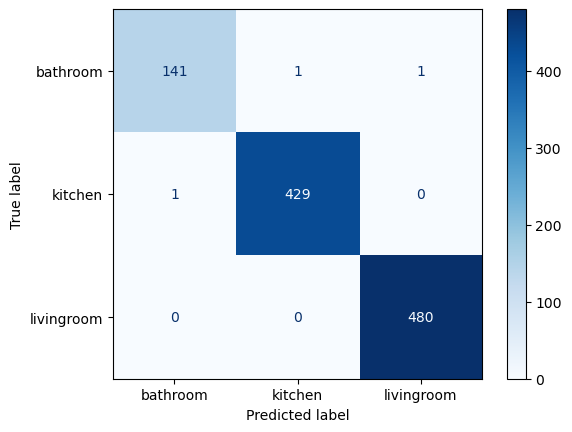

SCENE Scene2  TRAIN: [1826, 3553, 4254, 1857, 1830, 2645, 3899, 2146, 4608, 5246, 3820, 1123, 513, 4529, 1762, 3379, 1430, 1664, 2817, 2801, 1135, 4328, 2151, 761, 2559, 1866, 3764, 1610, 129, 3179, 3413, 3392, 5205, 2792, 358, 3294, 1259, 1932, 4705, 1618, 1026, 484, 2074, 2549, 4066, 3857, 1966, 3317, 1542, 4341, 1923, 3205, 186, 4711, 5033, 2084, 370, 206, 3190, 528, 729, 3588, 1571, 3815, 3397, 1114, 1875, 452, 289, 2294, 4622, 2079, 2516, 2704, 4152, 646, 2848, 2614, 5156, 3218, 2028, 1180, 1812, 330, 3577, 2172, 1712, 4267, 3792, 2400, 421, 3354, 2335, 128, 2938, 4727, 2200, 510, 3214, 1256, 4553, 4211, 92, 41, 3636, 1248, 3830, 608, 3154, 3033, 1677, 3071, 4354, 1701, 5110, 4124, 4364, 560, 4598, 4196, 3755, 1446, 495, 139, 1987, 1840, 2434, 3446, 3785, 2826, 200, 5186, 737, 1116, 3078, 719, 2731, 2754, 552, 3811, 4676, 1555, 138, 4194, 2982, 1326, 2373, 3292, 2551, 4281, 1062, 4382, 3723, 3661, 24, 4258, 4679, 3840, 2622, 5057, 1648, 968, 5195, 4336, 2865, 1283, 4621, 808, 2441

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 58s 209ms/step - loss: 0.1828 - accuracy: 0.9085 - val_loss: 0.0324 - val_accuracy: 0.9896
Epoch 2/25
263/263 [==============================] - 54s 205ms/step - loss: 0.0624 - accuracy: 0.9850 - val_loss: 0.0368 - val_accuracy: 0.9934
Epoch 3/25
263/263 [==============================] - 52s 198ms/step - loss: 0.0426 - accuracy: 0.9917 - val_loss: 0.0184 - val_accuracy: 0.9953
Epoch 4/25
263/263 [==============================] - 52s 199ms/step - loss: 0.0264 - accuracy: 0.9950 - val_loss: 0.0164 - val_accuracy: 0.9943
Epoch 5/25
263/263 [==============================] - 56s 213ms/step - loss: 0.0225 - accuracy: 0.9938 - val_loss: 0.0215 - val_accuracy: 0.9962
Epoch 6/25
263/263 [=========================

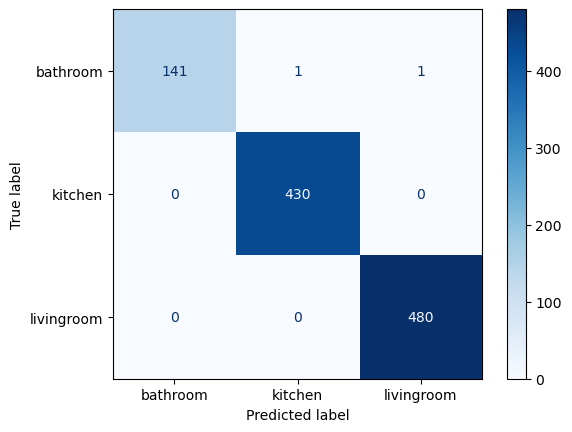

SCENE Scene3  TRAIN: [1187, 4638, 1804, 1298, 4987, 3087, 5185, 3035, 1508, 4980, 1636, 1529, 4800, 2740, 1506, 2346, 506, 1861, 205, 3923, 2859, 277, 3187, 3502, 1481, 523, 5226, 3362, 4592, 1597, 480, 281, 2284, 942, 1687, 4327, 1690, 3406, 3938, 508, 4745, 3000, 2669, 503, 509, 4718, 722, 2460, 1625, 1089, 5111, 30, 2215, 3056, 3173, 2827, 4005, 3081, 2751, 3422, 490, 4675, 1588, 306, 4678, 3142, 2410, 5140, 3993, 4177, 1088, 232, 690, 2591, 3903, 4134, 3262, 1877, 368, 3451, 2105, 5139, 197, 3438, 1003, 1064, 15, 592, 1201, 2485, 2596, 1304, 256, 1113, 54, 1646, 1048, 4898, 3601, 5241, 1269, 4210, 4696, 3726, 1024, 1122, 2450, 2150, 2714, 3221, 209, 3816, 600, 5159, 3650, 780, 4775, 4190, 3554, 3705, 4497, 1411, 4913, 4972, 4864, 4578, 1206, 4992, 4194, 3430, 1836, 224, 647, 3969, 816, 3191, 2880, 3217, 2258, 2772, 1259, 2305, 4727, 3272, 2427, 2007, 4560, 3668, 97, 4774, 273, 3599, 791, 159, 887, 545, 3171, 1198, 131, 2619, 4884, 1609, 3900, 4702, 1689, 3427, 2571, 5193, 1258, 269

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 60s 215ms/step - loss: 0.2618 - accuracy: 0.8767 - val_loss: 0.0473 - val_accuracy: 0.9886
Epoch 2/25
263/263 [==============================] - 53s 201ms/step - loss: 0.0493 - accuracy: 0.9865 - val_loss: 0.0287 - val_accuracy: 0.9943
Epoch 3/25
263/263 [==============================] - 53s 203ms/step - loss: 0.0756 - accuracy: 0.9857 - val_loss: 0.1279 - val_accuracy: 0.9753
Epoch 4/25
263/263 [==============================] - 54s 205ms/step - loss: 0.0436 - accuracy: 0.9919 - val_loss: 0.0187 - val_accuracy: 0.9972
Epoch 5/25
263/263 [==============================] - 56s 213ms/step - loss: 0.0220 - accuracy: 0.9941 - val_loss: 0.0205 - val_accuracy: 0.9953
Epoch 6/25
263/263 [=========================

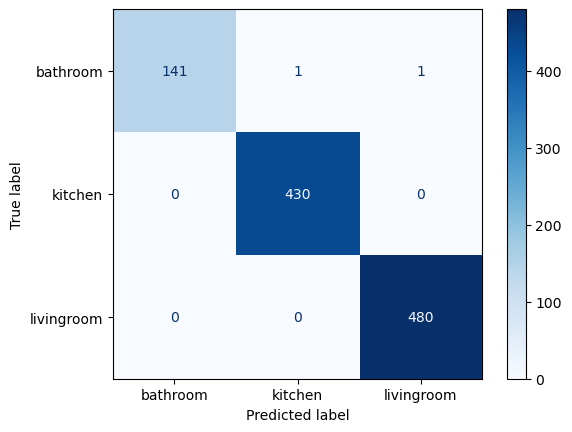

SCENE Scene4  TRAIN: [3790, 1863, 5250, 3457, 1597, 4316, 2104, 3070, 1282, 2671, 4559, 3985, 5036, 1783, 4828, 5180, 2012, 2740, 4672, 1064, 4661, 3610, 3440, 2639, 2042, 1929, 933, 3983, 4013, 2479, 3917, 1723, 4267, 2248, 2634, 735, 1254, 5214, 3473, 4665, 3159, 3466, 4000, 2368, 3020, 3818, 4686, 3609, 1968, 329, 5100, 1868, 3651, 3692, 695, 1155, 74, 2641, 1776, 1768, 4079, 531, 4556, 4470, 3431, 2408, 984, 1315, 1798, 4461, 128, 3516, 2576, 2351, 3604, 3348, 541, 1998, 801, 3885, 1179, 4838, 4317, 2032, 634, 1340, 3851, 2409, 2766, 4439, 4120, 3919, 3149, 5211, 3769, 1423, 1450, 72, 4543, 1056, 606, 5067, 77, 519, 2273, 3337, 161, 2014, 4726, 3512, 2976, 2949, 904, 1275, 2430, 38, 2214, 4740, 1186, 837, 542, 3299, 56, 617, 2353, 2932, 1695, 934, 855, 2638, 1948, 4931, 1196, 3711, 3357, 2373, 1402, 2927, 2415, 2150, 2822, 1102, 1821, 229, 1982, 2730, 1617, 5151, 3538, 4900, 3772, 498, 3682, 3773, 998, 2209, 4760, 658, 1535, 1243, 4689, 345, 4953, 5194, 3618, 4233, 431, 1758, 4805,

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 59s 209ms/step - loss: 0.1971 - accuracy: 0.8966 - val_loss: 0.0545 - val_accuracy: 0.9791
Epoch 2/25
263/263 [==============================] - 55s 210ms/step - loss: 0.0485 - accuracy: 0.9853 - val_loss: 0.0731 - val_accuracy: 0.9753
Epoch 3/25
263/263 [==============================] - 56s 213ms/step - loss: 0.0343 - accuracy: 0.9907 - val_loss: 0.0189 - val_accuracy: 0.9962
Epoch 4/25
263/263 [==============================] - 57s 215ms/step - loss: 0.0791 - accuracy: 0.9910 - val_loss: 0.0474 - val_accuracy: 0.9877
Epoch 5/25
263/263 [==============================] - 55s 210ms/step - loss: 0.0259 - accuracy: 0.9952 - val_loss: 0.0126 - val_accuracy: 0.9962
Epoch 6/25
263/263 [=========================

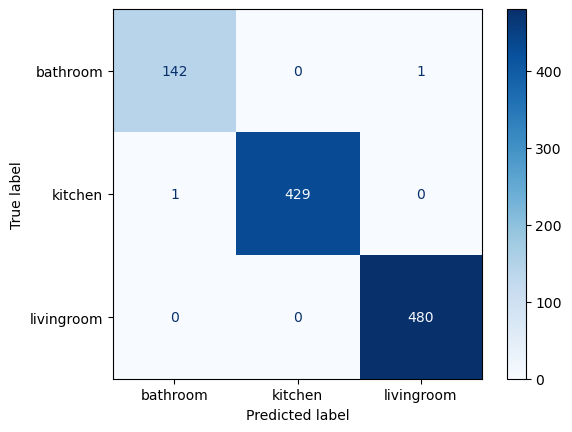

SCENE Scene5  TRAIN: [749, 4365, 1633, 627, 5038, 608, 4137, 1531, 2201, 1670, 3344, 3262, 2410, 3251, 5009, 1678, 2866, 518, 193, 3467, 1171, 1967, 3095, 4328, 1867, 2810, 2605, 5152, 1571, 3759, 353, 3327, 894, 1537, 4326, 1170, 3752, 4915, 3222, 4835, 938, 4145, 2797, 4561, 3179, 4097, 1934, 3579, 4756, 3883, 3406, 1511, 1630, 4953, 1186, 872, 2292, 960, 611, 2046, 246, 3295, 4584, 1062, 2279, 3861, 671, 2382, 1441, 209, 2150, 163, 3306, 3852, 1143, 762, 854, 2021, 4613, 795, 2989, 2266, 4396, 5235, 423, 4059, 2504, 3544, 4017, 1120, 3451, 2337, 884, 384, 3431, 5201, 5138, 2178, 2434, 4041, 2511, 4487, 3777, 2390, 3100, 215, 728, 4304, 2548, 4489, 3171, 2088, 4488, 3412, 1018, 695, 2526, 3984, 420, 1019, 2551, 4389, 4159, 2635, 255, 3944, 3519, 5022, 2368, 738, 1367, 507, 1012, 3058, 989, 339, 1040, 1457, 1164, 452, 3285, 338, 1279, 709, 3530, 3064, 1098, 5257, 1152, 512, 342, 3740, 3762, 5192, 2910, 3071, 3682, 1563, 4764, 515, 278, 1822, 3335, 4162, 2808, 5247, 1233, 2411, 1063, 4

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 58s 209ms/step - loss: 0.2820 - accuracy: 0.8519 - val_loss: 0.0318 - val_accuracy: 0.9839
Epoch 2/25
263/263 [==============================] - 53s 203ms/step - loss: 0.0461 - accuracy: 0.9848 - val_loss: 0.0371 - val_accuracy: 0.9896
Epoch 3/25
263/263 [==============================] - 53s 203ms/step - loss: 0.0346 - accuracy: 0.9914 - val_loss: 0.0269 - val_accuracy: 0.9924
Epoch 4/25
263/263 [==============================] - 54s 204ms/step - loss: 0.0174 - accuracy: 0.9969 - val_loss: 0.0072 - val_accuracy: 0.9972
Epoch 5/25
263/263 [==============================] - 54s 204ms/step - loss: 0.0435 - accuracy: 0.9905 - val_loss: 0.0135 - val_accuracy: 0.9943
Epoch 6/25
263/263 [=========================

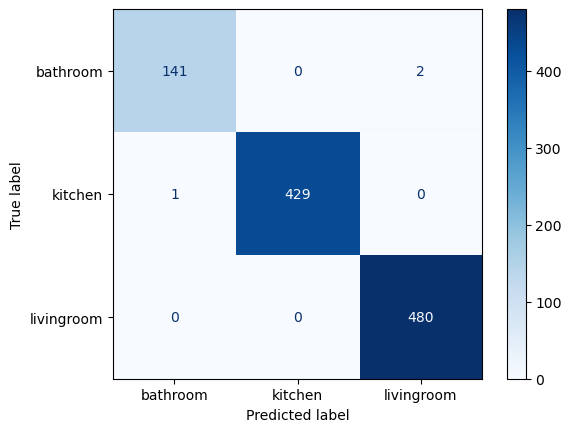

SCENE Scene6  TRAIN: [2743, 408, 4197, 1134, 2277, 495, 4354, 1623, 1914, 338, 3760, 4026, 3583, 512, 3492, 4875, 3249, 4857, 4775, 2088, 3668, 5248, 4429, 4616, 1266, 4960, 1348, 5058, 2831, 2003, 3556, 632, 449, 5163, 3761, 4807, 1167, 1497, 1206, 5076, 286, 3735, 2770, 3110, 4438, 636, 3316, 3947, 2822, 32, 5036, 2726, 313, 4955, 1561, 3413, 4352, 3569, 3580, 3586, 1519, 1236, 591, 5123, 2008, 5064, 789, 4932, 2971, 1970, 3385, 3792, 3870, 4956, 3075, 4560, 3861, 2102, 4864, 2132, 3420, 440, 2279, 4751, 446, 2806, 1810, 1535, 4337, 3759, 2479, 3197, 3369, 269, 4246, 1919, 3832, 3165, 2204, 1563, 4027, 2623, 3847, 1460, 4572, 3815, 4884, 637, 3570, 2981, 1614, 3108, 3765, 352, 1872, 4044, 2980, 1704, 2989, 2454, 4174, 4659, 3312, 1908, 4934, 2551, 3472, 2824, 5129, 2436, 1479, 2476, 3235, 2566, 1896, 4505, 2682, 3599, 678, 4413, 1315, 2764, 2322, 5072, 583, 3293, 4160, 4162, 4534, 2636, 2730, 4794, 3412, 2957, 2783, 2054, 249, 5075, 922, 3255, 2219, 3451, 4403, 4811, 790, 2426, 119, 

Clases
['bathroom' 'kitchen' 'livingroom']
[2.20198849 0.81455672 0.75860826]
{0: 2.2019884877027733, 1: 0.8145567169957414, 2: 0.7586082567153416}
Counter(YT_train) Counter({'livingroom': 1849, 'kitchen': 1722, 'bathroom': 637})
Epoch 1/25
263/263 [==============================] - 61s 220ms/step - loss: 0.2252 - accuracy: 0.8828 - val_loss: 0.0672 - val_accuracy: 0.9839
Epoch 2/25
263/263 [==============================] - 55s 208ms/step - loss: 0.0622 - accuracy: 0.9841 - val_loss: 0.0545 - val_accuracy: 0.9886
Epoch 3/25
263/263 [==============================] - 58s 219ms/step - loss: 0.0670 - accuracy: 0.9817 - val_loss: 0.0318 - val_accuracy: 0.9886
Epoch 4/25
263/263 [==============================] - 55s 208ms/step - loss: 0.0317 - accuracy: 0.9922 - val_loss: 0.0245 - val_accuracy: 0.9943
Epoch 5/25
263/263 [==============================] - 55s 209ms/step - loss: 0.0341 - accuracy: 0.9924 - val_loss: 0.0254 - val_accuracy: 0.9886
Epoch 6/25
263/263 [=========================

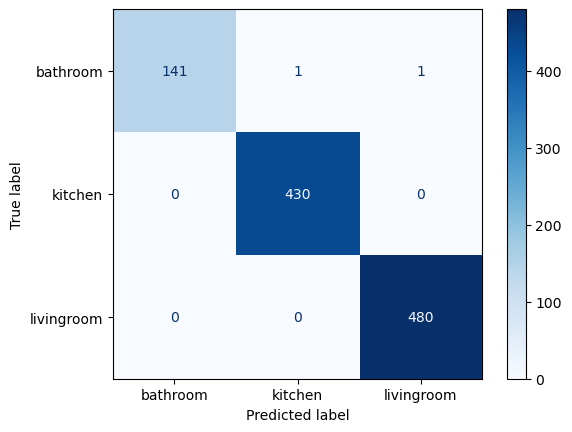

In [25]:
Y_pred_total=np.array([])
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
print(np.unique(S))

total_execution_time = 0

for ixs,sc in enumerate(np.unique(S0)):
#obtenemos train and test index basado en la escena ( y luego lo barajamos)

    indices = list(range(len(YT)))

    # Split indices into training and testing sets
    train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)


    #train_indices=np.where(S != sc)[0]
    #test_indices=np.where(S == sc)[0]
    
    np.random.shuffle(train_indices)

    #datos de train y test
    print("SCENE", sc, " TRAIN:", train_indices, " TEST:", test_indices)
    
    XYT_train=XYT[train_indices].copy()
    rssiT_train=rssiT[train_indices].copy()
    YT_train=YT_categorical[train_indices].copy()
    YT_train0=YT[train_indices].copy()

    XYT_test=XYT[test_indices].copy()
    rssiT_test=rssiT[test_indices].copy()
    YT_test=YT_categorical[test_indices].copy()
    
    autoencoder = load_model("autoencoder.model0.h5")
    class_labels = np.unique(YT_train0)
    print("Clases")
    print(class_labels)

    class_weights = compute_class_weight(class_weight="balanced",
                                         classes=np.unique(YT_train0),
                                         y=YT_train0)
    
    print(class_weights)
    # Create a dictionary with class labels as keys and corresponding weights as values
    class_weight_dict = {label_encoder.transform([class_label])[0]: weight for class_label, weight in zip(class_labels, class_weights)}

    # Print the dictionary
    print(class_weight_dict)

    print("Counter(YT_train)",Counter(YT_train0))
    #class_weight_dict =create_class_weight(Counter(YT_train0),YT_train0)
    #print(class_weight_dict)
    
    start_time = time.time()
    
    history = autoencoder.fit([XYT_train,rssiT_train] , YT_train, batch_size=16, class_weight=class_weight_dict,validation_data=([XYT_test,rssiT_test] , YT_test),epochs=25)
    
    end_time = time.time()
    training_time = end_time - start_time
    
    y_pred = autoencoder.predict([XYT_test,rssiT_test]).argmax(axis=1)
    y_val=YT_test.argmax(axis=1)
    print(y_pred)
    print(y_val)

    cm = confusion_matrix(y_val, y_pred) 
    print(cm)
    print("training time:",training_time)
    print(classification_report(y_val, y_pred, target_names=class_labels))



    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

    disp.plot(cmap=plt.cm.Blues)
    plt.show()
    
    Y_pred_total=np.concatenate((Y_pred_total,y_pred))
    
    total_execution_time = total_execution_time+training_time


#print(np.bincount(YT_train))
#print(np.bincount(YT_test))



##### 